# Исследование объявлений о продаже квартир

В вашем распоряжении данные сервиса Яндекс.Недвижимость — архив объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктов за несколько лет. Нужно научиться определять рыночную стоимость объектов недвижимости. Ваша задача — установить параметры. Это позволит построить автоматизированную систему: она отследит аномалии и мошенническую деятельность. 

По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма. 

**Объект исследования** - объявления о продаже недвижимости в н.п.:

    - Санкт-Петербург;
    - Ленинградская область.

Цель исследования:
    
1. Определить рыночную стоимость объектов недвижимости.
2. Разработать критерии и рабочий макет автоматической системы отслеживания аномалий и мошеннических схем.
3. Установить факторы, влияющие на ценообразование стоимости квартир.

План исследования:

1. Обзор данных, получаемых из файла *.csv, т.к. об их качестве ничего не известно.
2. Проверка данных на ошибки и оценка возможного влияния на исследование.
3. Предобработка данных, в процессе которой необходимо исправить все ошибки данных, которые не приведут к искажению конечного результата.
4. Создание дополнительных столбцов и других программных инструментов, необходимых для проведения исследования.
5. Исследовательский анализ.

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__


Отличная практика - расписывать цель и основные этапы своими словами (этот навык очень поможет на фильнальном проекте). Хорошо было бы добавить ход и цель исследования. Вот мой личный пример: 
    
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Применил.</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Супер, старайся, пожалуйста, придерживаться этой стратегии в дальнейших проектах =)
</div>

### Откройте файл с данными и изучите общую информацию. 

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import plotly.express as px
import seaborn as sns

# настройка, чтобы можно было просматривать все столбцы датафрейма
matplotlib.rcParams.update({'font.size': 12})
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

try:
    data = pd.read_csv('./datasets/real_estate_data.csv', sep='\t')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/real_estate_data.csv', sep='\t')

<div class="alert alert-block alert-success">✔️

    

__Комментарий от ревьюера №1__
        
Здорово, что для подгрузки данных используешь конструкцию `try-except`, она поможет избежать потенциальных ошибок при загрузке данных, связанных, например, с некорректным указанием путей.
        
Подробнее о конструкции по ссылке:
        
https://pythonworld.ru/tipy-dannyx-v-python/isklyucheniya-v-python-konstrukciya-try-except-dlya-obrabotki-isklyuchenij.html
        
Либо же можно использовать стандартную библиотеку os:
        
https://pythonworld.ru/moduli/modul-os.html

    
Несколько интересных статей кейсы использования конструкции:
    
https://www.programiz.com/python-programming/exception-handling
    
https://towardsdatascience.com/do-not-abuse-try-except-in-python-d9b8ee59e23b
    
https://www.techbeamers.com/use-try-except-python/
        
Как вариант в try можно указать корректные пути (в нашем случае глобальные) в except - некорректные (локальные). Можно также специфицровать тип ошибки, FileNotFoundError или задать кастомный тип ошибки (FilePathError, например)
        
Она полезна, если ты работаешь локально, а потом подгружаешь проект на платформу. Конструкция позволит не падать коду и локально, и на сервере ЯП, так как если не сработает один блок с путями, сработает другой.
        
Ну и вообще, в целом полезно про эту констуркцию знать, она универсальна и может быть использована в разных задачах.

In [2]:
# первые пять строк датафрейма
display(data.head())

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,False,False,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,False,False,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,False,False,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,False,False,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,False,False,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


In [3]:
# общая информация о датафрейме:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

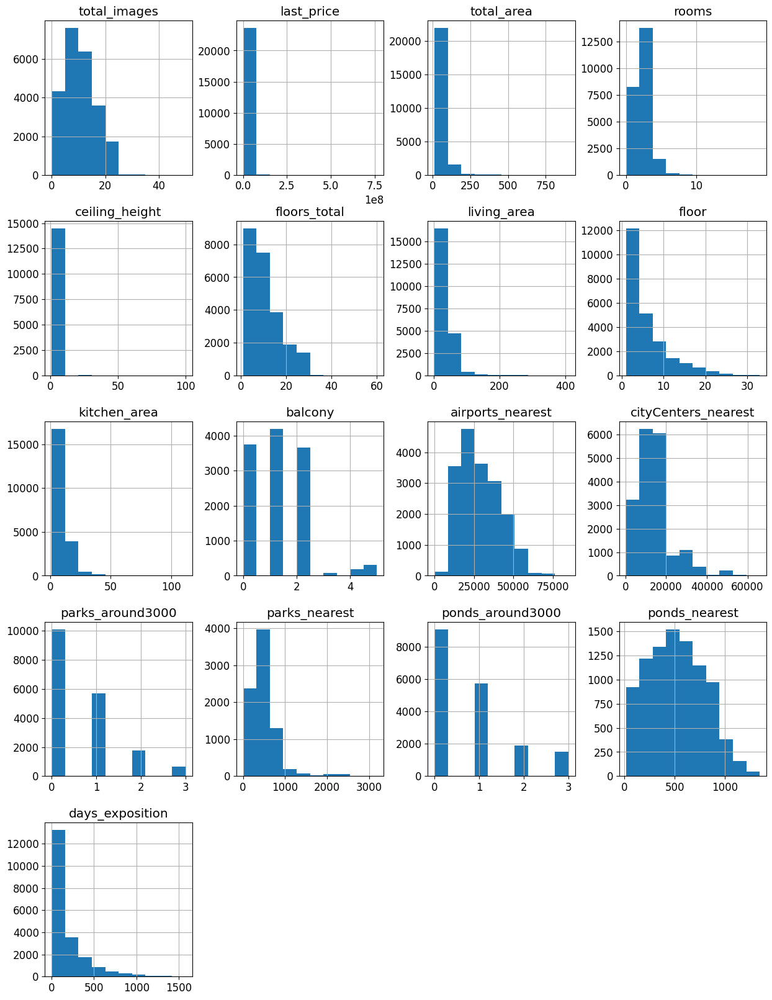

In [4]:
data.hist(figsize=(15, 20));

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__
Такие предупреждения можно убрать 2 способами:
    
1. В конец кода добавить plt.show(), но для этого нужно вызвать библиотеку matplotlib.pyplot as plt
2. В конец кода добавить `;`
     
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Подправил.</div>

In [5]:
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23699.000000,2.369900e+04,23699.000000,23699.000000,14504.000000,23613.000000,21796.000000,23699.000000,21421.000000,12180.000000,18157.000000,18180.000000,18181.000000,8079.000000,18181.000000,9110.000000,20518.000000
mean,9.858475,6.541549e+06,60.348651,2.070636,2.771499,10.673824,34.457852,5.892358,10.569807,1.150082,28793.672193,14191.277833,0.611408,490.804555,0.770255,517.980900,180.888634
std,5.682529,1.088701e+07,35.654083,1.078405,1.261056,6.597173,22.030445,4.885249,5.905438,1.071300,12630.880622,8608.386210,0.802074,342.317995,0.938346,277.720643,219.727988
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.300000,0.000000,0.000000,181.000000,0.000000,1.000000,0.000000,13.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.520000,5.000000,18.600000,2.000000,7.000000,0.000000,18585.000000,9238.000000,0.000000,288.000000,0.000000,294.000000,45.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.650000,9.000000,30.000000,4.000000,9.100000,1.000000,26726.000000,13098.500000,0.000000,455.000000,1.000000,502.000000,95.000000
75%,14.000000,6.800000e+06,69.900000,3.000000,2.800000,16.000000,42.300000,8.000000,12.000000,2.000000,37273.000000,16293.000000,1.000000,612.000000,1.000000,729.000000,232.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


Краткое описание:
1) Файл данных: 'https://code.s3.yandex.net/datasets/real_estate_data.csv'.
2) В качестве разделителя в csv файле применён знак табуляции ('\t').
3) Размерность: 22 столбцов на 23699 строк.
4) Типы данных: bool(2), float64(14), int64(3), object(3).

Описание данных:

    airports_nearest — расстояние до ближайшего аэропорта в метрах (м)
    balcony — число балконов
    ceiling_height — высота потолков (м)
    cityCenters_nearest — расстояние до центра города (м)
    days_exposition — сколько дней было размещено объявление (от публикации до снятия)
    first_day_exposition — дата публикации
    floor — этаж
    floors_total — всего этажей в доме
    is_apartment — апартаменты (булев тип)
    kitchen_area — площадь кухни в квадратных метрах (м²)
    last_price — цена на момент снятия с публикации
    living_area — жилая площадь в квадратных метрах (м²)
    locality_name — название населённого пункта
    open_plan — свободная планировка (булев тип)
    parks_around3000 — число парков в радиусе 3 км
    parks_nearest — расстояние до ближайшего парка (м)
    ponds_around3000 — число водоёмов в радиусе 3 км
    ponds_nearest — расстояние до ближайшего водоёма (м)
    rooms — число комнат
    studio — квартира-студия (булев тип)
    total_area — общая площадь квартиры в квадратных метрах (м²)
    total_images — число фотографий квартиры в объявлении

<div class="alert alert-block alert-success">✔️
    
__Комментарий от ревьюера №1__
    
Отлично! Первый взгляд на данные есть

##### "Песочница" для работы с сырыми данными

In [6]:
#d0 = data.copy()

In [7]:
#d0.loc[0]

In [8]:
#display(d0[(d0['locality_name'] == 'Сясьстрой') ]\
#        .sort_values(by='ceiling_height', ascending=False).head(5))

##### Личный инструментарий

In [9]:
# ЧАСТО ИСПОЛЬЗУЕМОЕ ИМЯ - СПб
SPb = 'санкт-петербург'

In [10]:
def sep_df(df, case):      
    return df.query(case)

In [11]:
# Функция дополнительного функционала для pd.hist() 
def grafix(df_hist, x_name, y_name='Количество квартир', title=''):
    for ax in df_hist.flatten():
        ax.set_xlabel(x_name)
        ax.set_ylabel(y_name)
        ax.set_title(title)

In [12]:
# Функция преобразования типа
def change_type(ds, new_type='int8'):   
    """
        Фунция преобразования типа
        datetime - '%Y-%m-%dT%H:%M:%S'
        другие - 
    """    
    if new_type == 'datetime':
        try:
            ds = pd.to_datetime(ds, format='%Y-%m-%dT%H:%M:%S')
            #ds = pd.to_datetime(ds, format='%Y-%m-%d')
            print(f'OK - {(ds.name)} {len(ds)} {type(ds.values[0])}')
        except:
            print(f'FAIL - {(ds.name)} {len(ds)} {type(ds.values[0])}')
    else:    
        try:
            ds = ds.astype(new_type)
            print(f'OK - {(ds.name)} {len(ds)} {type(ds.values[0])}')
        except:
            print(f'FAIL - {(ds.name)} {len(ds)} {type(ds.values[0])}')     
    
    return ds

In [13]:
# Функция определения характера корреляции (обобщённо для pe, sp, ke) по её числовым параметрам
def corr_analizer(row):
    """
        Функция оценивает числовое значение и преобразует в словесную форму
        Оценка универсальна для методов ("пирсон", "спирмен", "кендалл")
    """
    n_sign = ['нулевая', 'отрицат.', 'положит.']
    r_ch = ['отсутствует', 'оч.слабая', 'слабая', 'средняя', 'высокая', 'оч.высокая']
    r_ch_id = [0.2, 0.4, 0.6, 0.8, 1.0]
    i1 = 0
    i2 = 0
    value = row['last_price']
    if value != 0:
        if value > 0:
            i1 = 2
        else:
            i1 = 1    
        for i in range(len(r_ch_id)):
            if abs(value) < r_ch_id[i]:
                i2 = i+1
                break
    elif value == 0:
        i1 = 0
        i2 = 0
    else:
        row['-/+'] = 'Error!'
        row['r'] = 'Error!'
        
        return row[['-/+', 'r']]
    
    row['-/+'] = n_sign[i1]
    row['r'] = r_ch[i2]
    
    return row[['-/+', 'r']]

# Функция формирования отчёта корреляции
def corr_former(df, first, other, method_corr='pearson'):
    """
        Функция формирует табличный вид результатов работы методов корелляции
    """
    corr_list = []
    for item in other:
        corr = round(df[first].corr(df[item], method=method_corr), 2)
        corr_list.append(corr)
    method_s = method_corr[:2]
    df_c = pd.DataFrame(columns=[method_s, first, '|', '-/+', 'Связь'])
    df_c[first] = corr_list
    df_c[method_s] = '|'
    df_c['|'] = '|'
    df_c[['-/+', 'Связь']] = df_c.apply(corr_analizer, axis=1)
    df_c = df_c.rename(index=lambda x: other[x])

    return df_c 

### Предобработка данных

#### Поиск, изучение и заполнение пропущенных значений в столбцах

In [14]:
# Нахождение пропусков (NaN) в данных
data.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9195
floors_total               86
living_area              1903
floor                       0
is_apartment            20924
studio                      0
open_plan                   0
kitchen_area             2278
balcony                 11519
locality_name              49
airports_nearest         5542
cityCenters_nearest      5519
parks_around3000         5518
parks_nearest           15620
ponds_around3000         5518
ponds_nearest           14589
days_exposition          3181
dtype: int64

In [15]:
# общее количество пропусков (NaN)
data.isna().sum().sum()

101441

In [16]:
# Нахождение пропусков в данных (%)
pd.DataFrame(round(data.isna().mean(), 3), columns=['Пропуски'])\
    .sort_values(by=['Пропуски'], ascending=False)\
    .style.format('{:.1%}')\
    .background_gradient('coolwarm')

,Пропуски
is_apartment,88.3%
parks_nearest,65.9%
ponds_nearest,61.6%
balcony,48.6%
ceiling_height,38.8%
airports_nearest,23.4%
ponds_around3000,23.3%
parks_around3000,23.3%
cityCenters_nearest,23.3%
days_exposition,13.4%


<div class="alert alert-block alert-success">✔️
    
__Комментарий от ревьюера №1__
    
Красивая визуализация) 

##### Приведение имён н.п. (населённых пунктов) к однозначному пониманию ("...избежать знатных ошибок")

Последовательность действий по удалению дубликатов:

0. Просмотр уникальных значений.
1. Приведение к нижнему регистру.
2. Замена везде "ё" на "е".
3. Замена "городской поселок" на "поселок городского типа".
4. Проверка наличия явных дубликатов.

Посёлок Рябово и посёлок городского типа Рябово - разные н.п.

In [17]:
# количество уникальных значений без NaN (пропусков)
len(data['locality_name'].dropna().unique())

364

<div class="alert alert-block alert-success">✔️
    
__Комментарий от ревьюера №1__
    
Да, если пропусков меньше 5% их лучше сразу удалить, дабы сэкономить время

In [18]:
# функция вывода количества уникальных значений
def locality_name_unique():
    return print('Кол-во уникальных значений locality_name:', data['locality_name'].unique().shape[0])
locality_name_unique()

Кол-во уникальных значений locality_name: 365


In [19]:
# приведение к нижнему регистру
data['locality_name'] = data['locality_name'].str.lower()
locality_name_unique()

Кол-во уникальных значений locality_name: 365


In [20]:
# замена 'ё' на 'е'
data['locality_name'] = data['locality_name'].str.replace('ё', 'е')
locality_name_unique()

Кол-во уникальных значений locality_name: 331


In [21]:
# замена в названии н.п. "городской поселок" на "поселок городского типа"
data['locality_name'] = data['locality_name'].str.replace('городской поселок','поселок городского типа')
locality_name_unique()

Кол-во уникальных значений locality_name: 324


In [22]:
# наличие явных дубликатов
data.duplicated().sum()

0

<div class="alert alert-block alert-success">✔️
    
__Комментарий от ревьюера №1__
    
Проверка на дубликаты - основа предобработки данных

In [23]:
# исходное количество имён н.п.
len(data['locality_name'].dropna().unique())

323

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Можно например вот так:
    
    df = df.apply(lambda x: x.replace({'поселок':'посёлок', 'городской посёлок': 'посёлок', 'посёлок городского типа': 'посёлок', 'коттеджный посёлок': 'посёлок', 'посёлок при железнодорожной станции': 'посёлок станции'}, regex=True))

    len(df.locality_name.unique())
    
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Тут для контроля и наглядности оставил.</div>

##### Заполнение пропусков -название н.п.-

In [24]:
# Кол-во пропусков -названия населённых пунктов-
len(data[data['locality_name'].isna()])

49

In [25]:
# Проверка возможности нахождения СПб по цене кв.м., удалённости от центра, аэропорта.
# Не захватывает 9% СПб + ошибочно захватывает 1% других н.п.
def city_analizer_test(df):
    spb = 0
    filter_spb = 0
    filter_all = 0
    error = 0
    for i, row in df.iterrows():
        if ( (row['cityCenters_nearest'] < 17000) |
        ((row['last_price'] / row['total_area']) > 120000) ):
            if ((row['airports_nearest'] > 5000) & (row['airports_nearest'] < 60000)):          
                filter_all += 1
                if row['locality_name'] != SPb:
                    error += 1
        if (row['locality_name'] == SPb):
            spb += 1
            if (row['cityCenters_nearest'] < 17000) \
            | ((row['last_price'] / row['total_area']) > 120000):
                if ((row['airports_nearest'] > 5000) & (row['airports_nearest'] < 60000)):
                    filter_spb += 1
    return [spb, filter_spb, filter_all, error]

print(city_analizer_test(data))

[15721, 14402, 14533, 131]


<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Здорово, что используешь собственные функции
    
</div>

In [26]:
# Функция нахождения СПб по цене кв.м., удалённости от центра, аэропорта.
def city_analizer(row):
    if pd.isnull(row['locality_name']):
        if (row['cityCenters_nearest'] < 17000) \
        | ((row['last_price'] / row['total_area']) > 120000):
            if ((row['airports_nearest'] > 5000) & (row['airports_nearest'] < 60000)):
                return SPb
    return row['locality_name'] 

In [27]:
# Заполнение SPb 
data['locality_name'] = data.apply(city_analizer, axis=1)

len(data[data['locality_name'].isna()])

20

In [28]:
data[data['locality_name'].isna()]\
    .sort_values(by='cityCenters_nearest').head(12)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
2603,20,3351765.0,42.7,2015-09-20T00:00:00,1,NaN,24.0,15.6,3,NaN,False,False,10.7,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,276.0
2632,2,5130593.0,62.4,2015-10-11T00:00:00,2,NaN,24.0,33.1,21,NaN,False,False,8.2,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,256.0
6765,20,4895892.0,60.7,2015-03-12T00:00:00,2,NaN,24.0,31.9,3,NaN,False,False,12.2,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,468.0
13223,1,2919911.0,29.4,2015-03-12T00:00:00,1,2.75,24.0,21.1,2,NaN,False,False,NaN,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,470.0
14273,2,4422000.0,60.0,2016-03-23T00:00:00,2,2.75,23.0,32.0,14,NaN,False,False,11.9,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,90.0
16499,2,4995573.0,56.9,2016-06-17T00:00:00,2,NaN,24.0,29.2,14,NaN,False,False,10.9,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,4.0
19972,20,4361004.0,62.4,2015-09-20T00:00:00,2,NaN,24.0,33.1,21,NaN,False,False,8.2,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,278.0
22933,20,3176015.0,33.3,2015-04-22T00:00:00,1,NaN,23.0,15.4,22,NaN,False,False,9.0,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,427.0
13690,7,3500000.0,71.0,2016-06-23T00:00:00,3,2.75,2.0,45.6,1,False,False,False,8.0,2.0,NaN,20234.0,23659.0,0.0,NaN,2.0,296.0,92.0
8986,10,4850000.0,103.1,2018-07-10T00:00:00,3,NaN,NaN,68.1,4,NaN,False,False,16.7,NaN,NaN,19659.0,31813.0,0.0,NaN,0.0,NaN,28.0


In [29]:
# находим точечную застройку "человейниками". В основном - СПб.
item_spb = len(data[(data['locality_name'] == SPb) & 
     (((data['cityCenters_nearest'] >= 17000) & (data['cityCenters_nearest'] <= 18000)) &
      (data['floors_total'] > 20) &
      ((data['airports_nearest'] > 22000) & (data['airports_nearest'] <= 23000)))] \
    .sort_values(by='cityCenters_nearest', ascending=False))

item_other = len(data[~(data['locality_name'] == SPb) & 
     (((data['cityCenters_nearest'] >= 17000) & (data['cityCenters_nearest'] <= 18000)) &
      (data['floors_total'] > 20) &
      ((data['airports_nearest'] > 22000) & (data['airports_nearest'] <= 23000)))] \
    .sort_values(by='cityCenters_nearest', ascending=False))

print(f'Квартир в заданном райне (СПб|другие): {item_spb}|{item_other}')

Квартир в заданном райне (СПб|другие): 69|8


In [30]:
# Смотрим все данные. Из 77 квартир: 69 - СПб и 8 - пропуски, т.е. теперь тоже СПб.
# Кстати, сразу видны небольшие расхождения в указании:
# высоты потолка, расстояний до центра и аэропорта, этажности - похоже это группа домов плюс ошибки.
# Также хорошая возможность разобраться с другими пропусками в этом конкретном "жилом комплексе"
data[ 
     (((data['cityCenters_nearest'] >= 17000) & (data['cityCenters_nearest'] <= 18000)) &
      (data['floors_total'] > 20) &
      ((data['airports_nearest'] > 22000) & (data['airports_nearest'] <= 23000)))] \
    .sort_values(by='cityCenters_nearest', ascending=False).tail(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
13263,10,4282546.0,60.50,2017-06-13T00:00:00,2,NaN,23.0,32.00,19,NaN,False,False,11.90,0.0,санкт-петербург,22212.0,17399.0,0.0,NaN,1.0,233.0,67.0
2632,2,5130593.0,62.40,2015-10-11T00:00:00,2,NaN,24.0,33.10,21,NaN,False,False,8.20,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,256.0
22933,20,3176015.0,33.30,2015-04-22T00:00:00,1,NaN,23.0,15.40,22,NaN,False,False,9.00,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,427.0
2603,20,3351765.0,42.70,2015-09-20T00:00:00,1,NaN,24.0,15.60,3,NaN,False,False,10.70,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,276.0
13223,1,2919911.0,29.40,2015-03-12T00:00:00,1,2.75,24.0,21.10,2,NaN,False,False,NaN,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,470.0
19972,20,4361004.0,62.40,2015-09-20T00:00:00,2,NaN,24.0,33.10,21,NaN,False,False,8.20,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,278.0
6765,20,4895892.0,60.70,2015-03-12T00:00:00,2,NaN,24.0,31.90,3,NaN,False,False,12.20,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,468.0
14273,2,4422000.0,60.00,2016-03-23T00:00:00,2,2.75,23.0,32.00,14,NaN,False,False,11.90,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,90.0
16499,2,4995573.0,56.90,2016-06-17T00:00:00,2,NaN,24.0,29.20,14,NaN,False,False,10.90,0.0,NaN,22041.0,17369.0,0.0,NaN,1.0,374.0,4.0
17724,5,3250000.0,49.78,2018-03-06T00:00:00,2,NaN,23.0,30.12,8,NaN,False,False,10.05,NaN,санкт-петербург,22572.0,17078.0,0.0,NaN,1.0,545.0,192.0


In [31]:
# заполнение 8 пропусков значением 'санкт-петербург'
data.loc[(data['locality_name'].isna()) &
     (((data['cityCenters_nearest'] >= 17000) & (data['cityCenters_nearest'] <= 18000)) &
      (data['floors_total'] > 20) &
      ((data['airports_nearest'] > 22000) & (data['airports_nearest'] <= 23000))), 'locality_name'] = SPb

len(data[data['locality_name'].isna()])

12

In [32]:
len(data[data['ceiling_height'].isna()])

9195

In [33]:
# заодно заполним пропуски потолков значением 2.75 (самое распространённое значение)  
data.loc[(data['ceiling_height'].isna()) &
     (((data['cityCenters_nearest'] >= 17000) & (data['cityCenters_nearest'] <= 18000)) &
      (data['floors_total'] > 20) &
      ((data['airports_nearest'] > 22000) & (data['airports_nearest'] <= 23000))), 'ceiling_height'] = 2.75

len(data[data['ceiling_height'].isna()])

9152

In [34]:
# смотрим оставшихся
data[data['locality_name'].isna()].sort_values(by='cityCenters_nearest').head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
13690,7,3500000.0,71.0,2016-06-23T00:00:00,3,2.75,2.0,45.6,1,False,False,False,8.0,2.0,NaN,20234.0,23659.0,0.0,NaN,2.0,296.0,92.0
8986,10,4850000.0,103.1,2018-07-10T00:00:00,3,NaN,NaN,68.1,4,NaN,False,False,16.7,NaN,NaN,19659.0,31813.0,0.0,NaN,0.0,NaN,28.0
21119,8,3500000.0,43.2,2018-11-11T00:00:00,2,NaN,4.0,NaN,2,NaN,False,False,NaN,NaN,NaN,19744.0,31897.0,0.0,NaN,0.0,NaN,9.0
21276,0,17122148.0,178.3,2017-02-10T00:00:00,1,NaN,3.0,NaN,1,NaN,False,False,41.6,1.0,NaN,60195.0,41294.0,0.0,NaN,0.0,NaN,4.0
2033,6,5398000.0,80.0,2017-05-30T00:00:00,3,NaN,4.0,42.6,2,NaN,False,False,18.6,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.0


In [35]:
# по 1 квартире (20000, 23000) находим только СПб
data[
     (((data['cityCenters_nearest'] >= 23000) & (data['cityCenters_nearest'] <= 24000)) & 
      ((data['airports_nearest'] > 20000) & (data['airports_nearest'] <= 21000)))] \
    .sort_values(by='cityCenters_nearest', ascending=False).head(15)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
21733,6,3250000.0,31.0,2016-05-31T00:00:00,1,NaN,5.0,17.0,4,NaN,False,False,5.0,0.0,санкт-петербург,20243.0,23668.0,0.0,NaN,1.0,1069.0,246.0
13690,7,3500000.0,71.0,2016-06-23T00:00:00,3,2.75,2.0,45.6,1,False,False,False,8.0,2.0,NaN,20234.0,23659.0,0.0,NaN,2.0,296.0,92.0


In [36]:
# заполнение 1 пропуска (20000, 23000) значением СПб
data.loc[(data['locality_name'].isna()) &
     (((data['cityCenters_nearest'] >= 23000) & (data['cityCenters_nearest'] <= 24000)) & 
      ((data['airports_nearest'] > 20000) & (data['airports_nearest'] <= 21000))), 'locality_name'] = SPb

len(data[data['locality_name'].isna()])

11

In [37]:
# ещё по 2 квартирам (19000, 31000) находим Павловск, Пушкин, посёлок Шушары.
# по координатам Павловск и Пушкин слились - что верно. При этом в Павловске есть парки и водоёмы
# а в Пушкине нет - что странно. Может забором отгородили.
# по вторичным признакам (парки, водоёмы, площадь кухни) больше подходит Пушкин
data[
     (((data['cityCenters_nearest'] >= 31000) & (data['cityCenters_nearest'] <= 32000)) & 
      ((data['airports_nearest'] > 19000) & (data['airports_nearest'] <= 20000)))] \
    .sort_values(by='cityCenters_nearest', ascending=False).head(15)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
221,10,3750000.0,43.0,2018-05-09T00:00:00,2,NaN,4.0,28.0,1,NaN,False,False,6.0,NaN,павловск,19775.0,31929.0,2.0,651.0,1.0,1064.0,277.0
17874,13,17000000.0,170.0,2018-08-21T00:00:00,5,NaN,3.0,94.0,3,NaN,False,False,16.0,NaN,пушкин,19760.0,31914.0,0.0,NaN,0.0,NaN,96.0
21119,8,3500000.0,43.2,2018-11-11T00:00:00,2,NaN,4.0,NaN,2,NaN,False,False,NaN,NaN,NaN,19744.0,31897.0,0.0,NaN,0.0,NaN,9.0
8986,10,4850000.0,103.1,2018-07-10T00:00:00,3,NaN,NaN,68.1,4,NaN,False,False,16.7,NaN,NaN,19659.0,31813.0,0.0,NaN,0.0,NaN,28.0
17156,20,4600000.0,61.5,2017-02-20T00:00:00,2,2.65,9.0,33.3,9,False,False,False,11.0,2.0,поселок шушары,19155.0,31730.0,0.0,NaN,0.0,NaN,18.0
8732,20,9300000.0,151.5,2017-06-27T00:00:00,4,3.00,3.0,57.1,1,NaN,False,False,7.7,NaN,павловск,19575.0,31729.0,2.0,292.0,1.0,605.0,513.0
2526,6,5200000.0,42.2,2018-02-27T00:00:00,1,NaN,5.0,19.3,4,NaN,False,False,11.1,2.0,пушкин,19571.0,31725.0,0.0,NaN,0.0,NaN,4.0
284,6,2650000.0,30.5,2018-02-06T00:00:00,1,2.60,4.0,17.2,2,NaN,False,False,5.0,1.0,павловск,19516.0,31670.0,2.0,314.0,1.0,627.0,37.0
21345,14,5200000.0,74.5,2017-12-13T00:00:00,3,NaN,5.0,47.1,4,NaN,False,False,10.0,1.0,поселок шушары,19027.0,31602.0,0.0,NaN,0.0,NaN,220.0
19872,14,3600000.0,43.7,2017-01-24T00:00:00,2,2.50,4.0,28.2,1,NaN,False,False,5.1,NaN,павловск,19446.0,31600.0,2.0,684.0,1.0,799.0,NaN


In [38]:
# заполнение 1 пропуска (19000, 31000) значением СПб
data.loc[(data['locality_name'].isna()) &
     (((data['cityCenters_nearest'] >= 31000) & (data['cityCenters_nearest'] <= 32000)) & 
      ((data['airports_nearest'] > 19000) & (data['airports_nearest'] <= 20000))), 'locality_name'] = SPb

len(data[data['locality_name'].isna()])

9

In [39]:
# по 1 квартире (60000, 41000) находим посёлок Репино (подходящая цена квадратного метра и т.д.)
data[
     (((data['cityCenters_nearest'] >= 40000) & (data['cityCenters_nearest'] <= 43000)) & 
      ((data['airports_nearest'] > 59000) & (data['airports_nearest'] <= 62000)))] \
    .sort_values(by='cityCenters_nearest', ascending=False).head(15)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
19984,20,7990000.0,62.2,2018-07-29T00:00:00,2,NaN,6.0,32.79,6,NaN,False,False,11.78,NaN,сестрорецк,61872.0,42971.0,0.0,NaN,3.0,169.0,23.0
17162,15,6100000.0,52.5,2018-02-01T00:00:00,1,2.7,6.0,15.50,3,NaN,False,False,21.50,NaN,сестрорецк,61664.0,42763.0,0.0,NaN,3.0,287.0,302.0
2454,12,28000000.0,160.0,2016-10-24T00:00:00,3,3.0,2.0,92.00,2,NaN,False,False,30.00,4.0,поселок репино,61484.0,42583.0,0.0,NaN,0.0,NaN,NaN
5659,2,11067416.0,160.7,2018-08-01T00:00:00,2,3.0,2.0,NaN,1,NaN,False,False,NaN,NaN,поселок репино,61451.0,42550.0,0.0,NaN,0.0,NaN,238.0
21276,0,17122148.0,178.3,2017-02-10T00:00:00,1,NaN,3.0,NaN,1,NaN,False,False,41.60,1.0,NaN,60195.0,41294.0,0.0,NaN,0.0,NaN,4.0


In [40]:
# заполнение 1 пропуска (60000, 41000) значением 'санкт-петербург'
data.loc[(data['locality_name'].isna()) &
     (((data['cityCenters_nearest'] >= 40000) & (data['cityCenters_nearest'] <= 43000)) & 
      ((data['airports_nearest'] > 59000) & (data['airports_nearest'] <= 62000))), 'locality_name'] = SPb

len(data[data['locality_name'].isna()])

8

In [41]:
# Удаляем все оставшиеся пропуски
data = data.dropna(subset=['locality_name'])
len(data[data['locality_name'].isna()])

0

In [42]:
len(data['locality_name'].unique())

323

##### Заполнение пропусков -жилая площадь- и -площадь кухни-

In [43]:
# количество пропусков по жилой площади
len(data[data['living_area'].isna()])

1902

In [44]:
# количество пропусков по площади кухни
len(data[data['kitchen_area'].isna()])

2276

In [45]:
# выборка данных, в которых площади без пропусков
area_ = data.loc[~(data["living_area"].isna()) & ~(data["kitchen_area"].isna())]

In [46]:
# выборка по человеческим пропорциям квартиры
area_ = area_.loc[(area_['studio'] == False) & (area_['living_area'] > 10) & 
                  (area_['living_area'] > area_['kitchen_area'])]

In [47]:
# общая средняя доля жилой от общей площади по всем н.п.
share_living_area = (area_['living_area'] / area_['total_area']).mean()
share_living_area

0.5672226696581945

In [48]:
# общая средняя доля площади кухни от общей площади по всем н.п.
share_kitchen_area = (area_['kitchen_area'] / area_['total_area']).mean()
share_kitchen_area

0.18231328562958132

In [49]:
# количество студий
len(data[data['studio'] == True])

149

In [50]:
# выборка данных cтудий, в которых жилая площадь без пропусков
area_studio_ = data.loc[(data["studio"] == True) & ~(data["living_area"].isna())]

In [51]:
# общая средняя доля жилой от общей площади по всем н.п. для студий
share_living_area_studio = (area_studio_['living_area'] / area_studio_['total_area']).mean()
share_living_area_studio

0.681528904256545

In [52]:
# посмотрим распределение долей по н.п.
# отдельные столбцы
area_['area_l_t'] = area_['living_area'] / area_['total_area']
area_['area_k_t'] = area_['kitchen_area'] / area_['total_area']

In [53]:
# группировка средних значений площадей: жилая от общей
share_living_area_df = area_.pivot_table(index='locality_name', values='area_l_t', aggfunc='mean')

share_living_area_df = share_living_area_df.sort_values(by='area_l_t', ascending=False)
#share_living_area_df

In [54]:
# группировка средних значений кухня от общей
share_kitchen_area_df = area_.pivot_table(index='locality_name', values='area_k_t', aggfunc='mean')

share_kitchen_area_df = share_kitchen_area_df.sort_values(by='area_k_t', ascending=False)
#share_kitchen_area_df

In [55]:
# Функция заполнения пропусков площадей жилой и кухни,
# если есть данные о жилой или кухне, используем их в расчёте,
# если нет - средние значение по н.п.,
# если и их нет - общие средние значения.
# Студии - сразу общее средние для жилой, кухню в ноль.
def fill_area(row):
    if not pd.isnull(row['living_area']):
        if not pd.isnull(row['kitchen_area']):
            return row[['living_area', 'kitchen_area']]
                                           
    if row['studio'] == False:
        if (pd.isnull(row['living_area'])) & ~(pd.isnull(row['kitchen_area'])):
            row['living_area'] = row['total_area'] - 2*row['kitchen_area']
        elif ~(pd.isnull(row['living_area'])) & (pd.isnull(row['kitchen_area'])):
            row['kitchen_area'] = (row['total_area'] - row['living_area'])/2
        elif (pd.isnull(row['living_area'])) & (pd.isnull(row['kitchen_area'])):                                                                    
            sh_la = share_living_area_df.loc[share_living_area_df.index == row['locality_name']].values
            if len(sh_la) > 0:
                row['living_area'] = row['total_area'] * sh_la[0][0]               
            else:
                #print(row['locality_name'])
                row['living_area'] = row['total_area'] * share_living_area          
            
            sh_ka = share_kitchen_area_df.loc[share_kitchen_area_df.index == row['locality_name']].values
            if len(sh_ka) > 0:
                row['kitchen_area'] = row['total_area'] * sh_ka[0][0]
            else:
                row['kitchen_area'] = row['total_area'] * share_kitchen_area
                
    else:
        if pd.isnull(row['living_area']):
            row['living_area'] = row['total_area'] * share_living_area_studio
        row['kitchen_area'] = 0.0
            
    return row[['living_area', 'kitchen_area']]

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Отличный код
    
</div>

In [56]:
# заполнение пропусков площади жилой и кухонь
data[['living_area', 'kitchen_area']] = data.apply(fill_area, axis=1)

In [57]:
# проверка на пропуски
len(data[(data['living_area'].isna()) & (data['living_area'].isna())])

0

In [58]:
data['living_area'] = round(data['living_area'], 1)
data['kitchen_area'] = round(data['kitchen_area'], 1)

##### Заполнение пропусков -высота потолка-

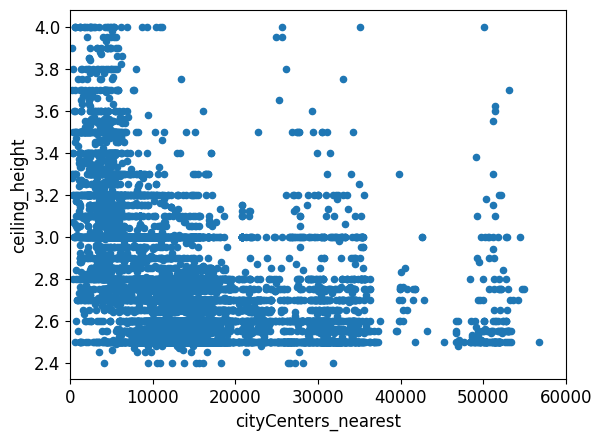

In [59]:
# Зависимость высоты потолка от расстояния до центра для всех н.п.

# выборка данных, в которых -высота потолка- без пропусков
ceiling_height_ = data.loc[~data["ceiling_height"].isna()]

# выборка по высоте потолка [4; 2.4]
ceiling_height_ = ceiling_height_.loc[(ceiling_height_['ceiling_height'] <= 4) &
                                      (ceiling_height_['ceiling_height'] >= 2.4)]
# построение графика рассеяния
ceiling_height_.plot(x='cityCenters_nearest', y='ceiling_height', kind='scatter', xlim=(0,60000));

In [60]:
# Функция группировки и сортировки имён н.п. по частотности ЧИСЛОВЫХ данных
def incle_sort(df, value='cityCenters_nearest', low_limit=20, high_limit=25000):
    """
        Извлечение имён.
        Сортировка по частотности наличия данных.
        Изменяемый максимальный и минимальный пороги получения имён н.п. 
    """
    result = df.pivot_table(index='locality_name', values=value, aggfunc='count')
    result = result[(result[value] >= low_limit) & (result[value] < high_limit)]\
        .sort_values(value, ascending=False)
        
    return result

In [61]:
locality_names_by_cityCenter = incle_sort(ceiling_height_)
locality_names_by_cityCenter

,cityCenters_nearest
locality_name,
санкт-петербург,10065
пушкин,232
поселок шушары,215
колпино,203
петергоф,145
поселок парголово,137
сестрорецк,129
красное село,110
ломоносов,91


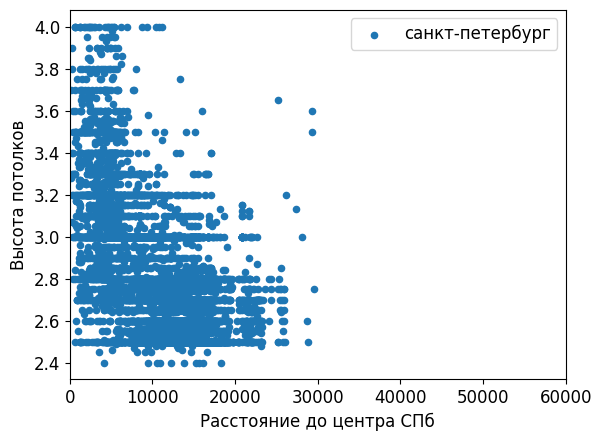

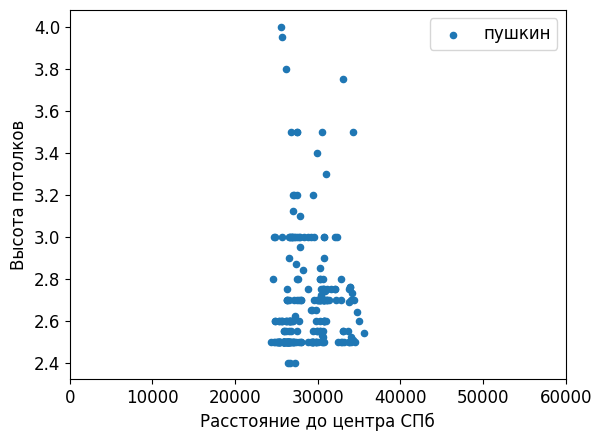

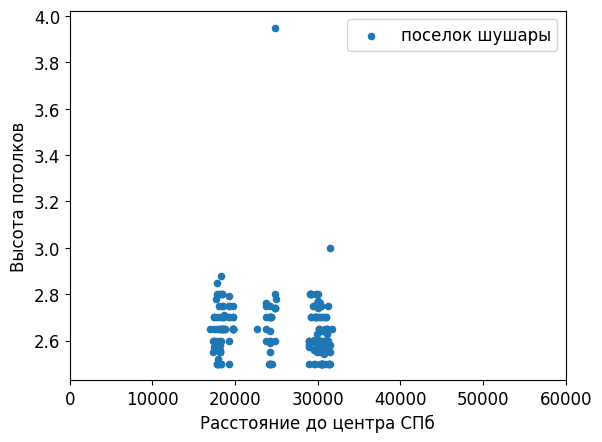

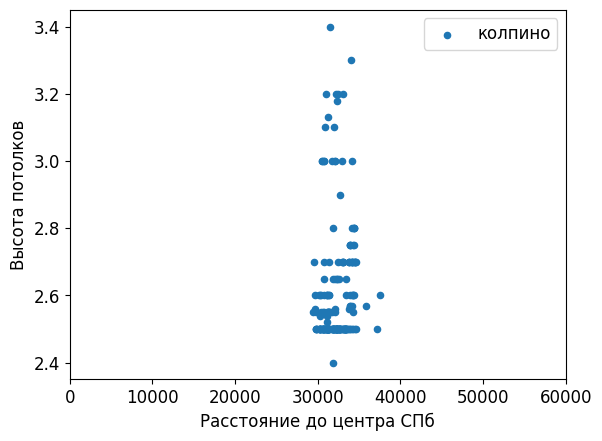

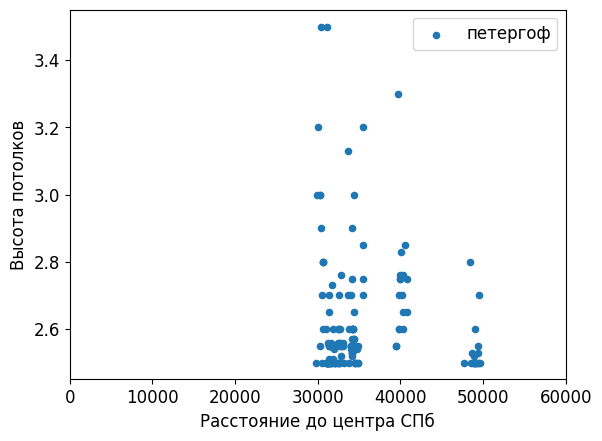

...

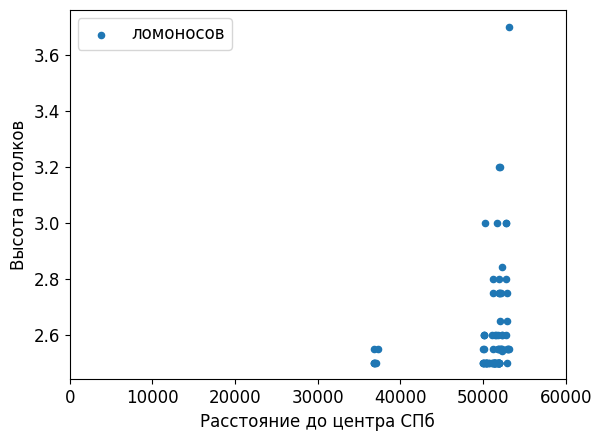

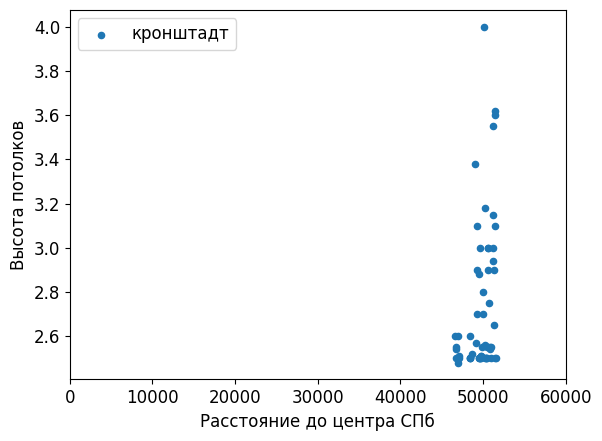

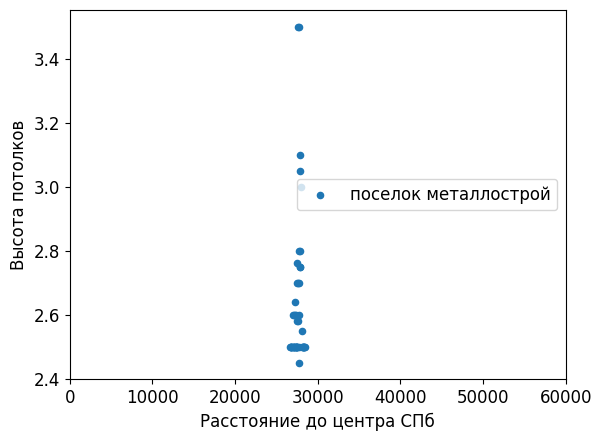

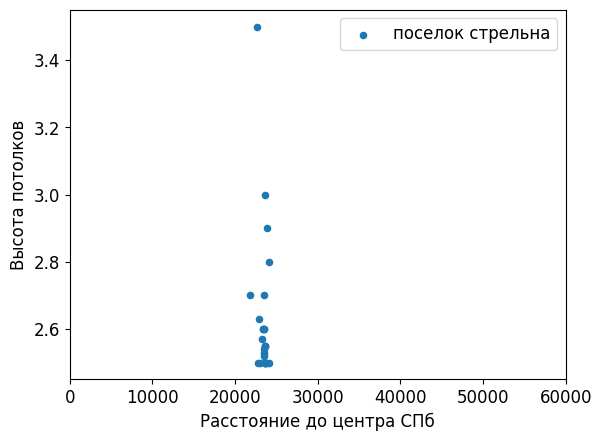

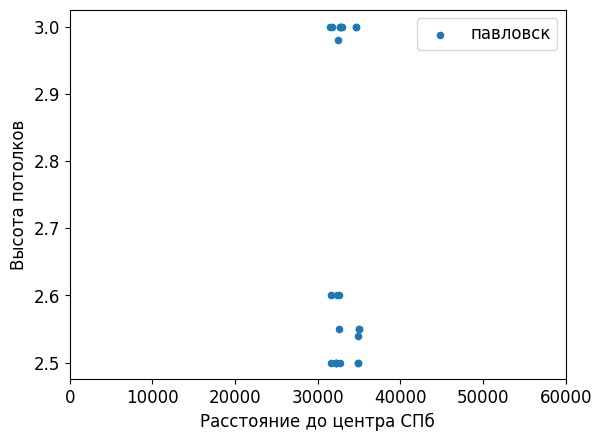

In [62]:
# построение графика рассеяния
for name in locality_names_by_cityCenter.index:
    ceiling_height_[ceiling_height_['locality_name'] == name]\
        .plot(x='cityCenters_nearest', y='ceiling_height',
              kind='scatter',
              xlim=(0, 60000),
              xlabel='Расстояние до центра СПб',
              ylabel='Высота потолков',
              label=name
             )

По н.п. чётко видны массовые застройки с типовой высотой потолков и основным шагом - 10 см и не основным - 5 см.
Самая полная картина в СПб.
Часто видны типовые постройки с высотой 2,4 метра. Любопытный факт. У каждого исторического периода есть свой "потолок".

In [63]:
# cписок имён 
locality_names_by_ceiling = incle_sort(ceiling_height_, value='ceiling_height', low_limit=70)
locality_names_by_ceiling

,ceiling_height
locality_name,
санкт-петербург,10096
всеволожск,270
пушкин,233
поселок шушары,217
поселок мурино,212
колпино,203
гатчина,148
петергоф,145
поселок парголово,137


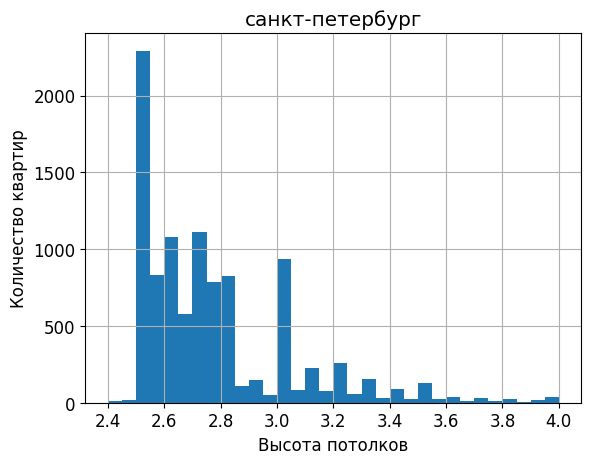

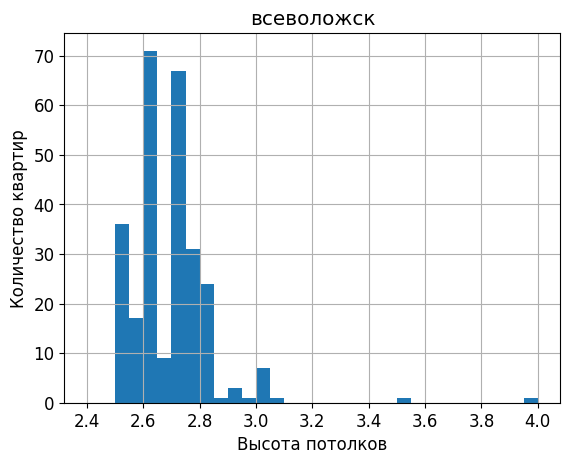

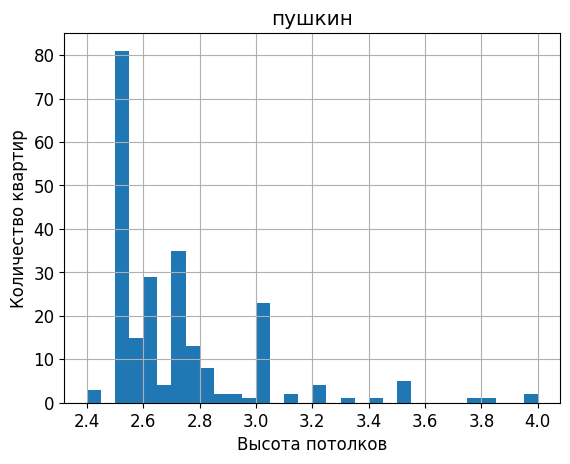

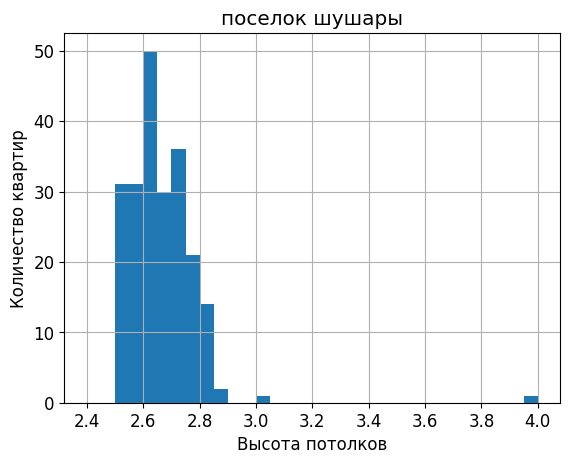

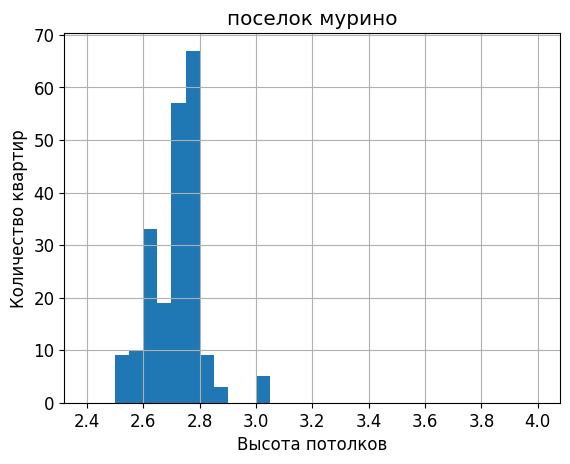

...

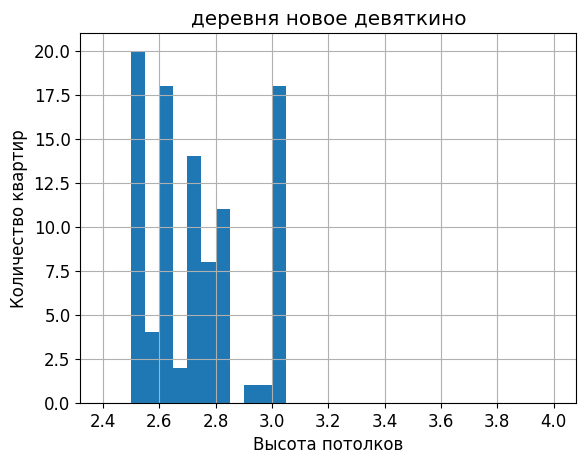

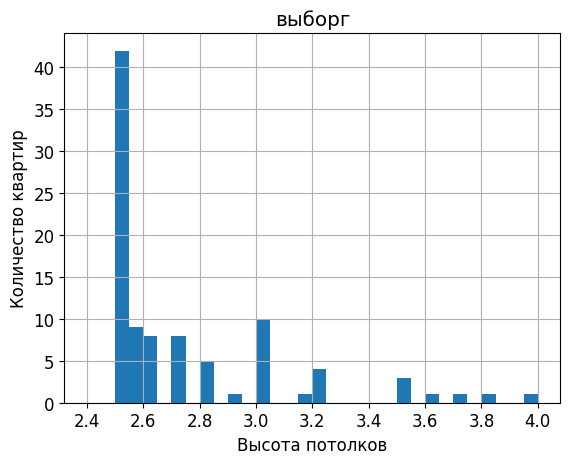

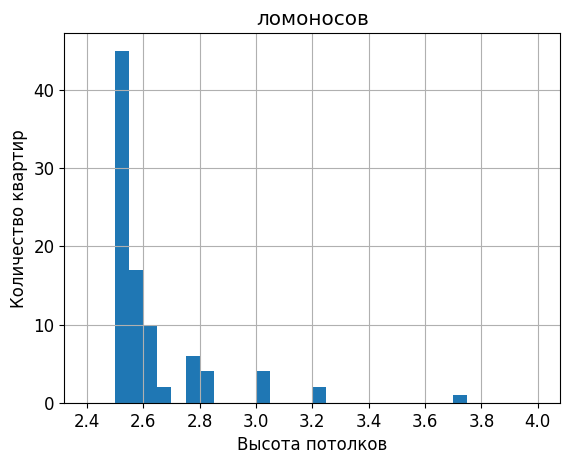

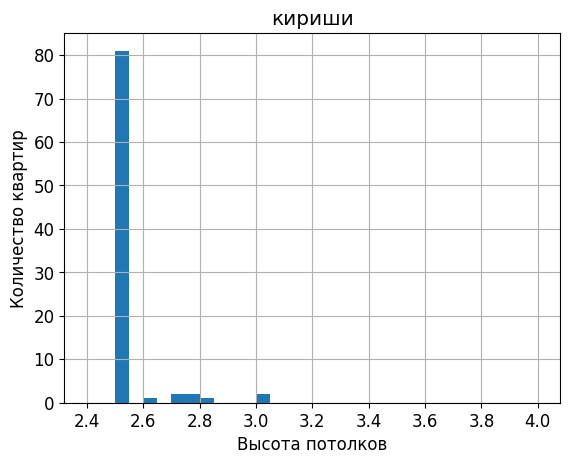

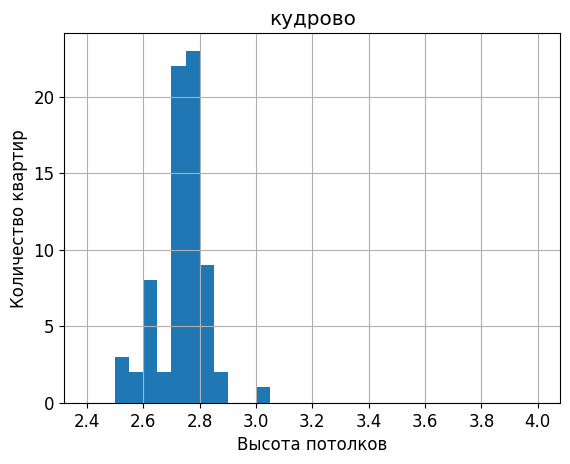

In [64]:
# построение гистограммы высоты потолков для н.п.
for name in locality_names_by_ceiling.index:
    grafix(ceiling_height_[ceiling_height_['locality_name'] == name]\
        .hist('ceiling_height', bins=32, range=(2.4, 4.0)),
           x_name='Высота потолков',
           title=name
          )


In [65]:
# Определение медианного значения высоты потолков в населённом пункте
def locality_ceiling_median(locality_name, print_flag=False):
    ceiling_height_loc = data.loc[data['locality_name'] == locality_name, 'ceiling_height'].median()
    
    if print_flag == True:
        return print(f'Общая медианная высота потолков ({locality_name}):', ceiling_height_loc)
    else:
        ceiling_height_loc

In [66]:
locality_ceiling_median(SPb, True)

Общая медианная высота потолков (санкт-петербург): 2.7


In [67]:
locality_ceiling_median('пушкин', True)

Общая медианная высота потолков (пушкин): 2.6


In [68]:
locality_ceiling_median('поселок шушары', True)

Общая медианная высота потолков (поселок шушары): 2.63


In [69]:
locality_ceiling_median('сясьстрой', True)

Общая медианная высота потолков (сясьстрой): 2.55


 Для СПб при расчёте медиан для большей точности разделим на три категории расстояния от центра:
 - до 5 км
 - от 5 до 12 км
 - более 12 км

In [70]:
# Проверка отсутствия пропусков 
len(data[data['ceiling_height'].isna()])

9146

In [71]:
# медианное значение в СПб при расстоянии до 5 км от центра
ceiling_height_spb_c = ceiling_height_[(ceiling_height_['locality_name'] == SPb) &
                       (ceiling_height_['cityCenters_nearest'] <= 5000)]['ceiling_height'].median()
ceiling_height_spb_c

3.1

In [72]:
# медианное значение в СПб при расстоянии от 5 до 12 км от центра
ceiling_height_spb_m = ceiling_height_[(ceiling_height_['locality_name'] == SPb) &
                       ((ceiling_height_['cityCenters_nearest'] > 5000) &
                        (ceiling_height_['cityCenters_nearest'] <= 12000))]['ceiling_height'].median()
ceiling_height_spb_m

2.7

In [73]:
# медианное значение в СПб при расстоянии более 12 км от центра
ceiling_height_spb_p = ceiling_height_[(ceiling_height_['locality_name'] == SPb) &
                       (ceiling_height_['cityCenters_nearest'] > 12000)]['ceiling_height'].median()
ceiling_height_spb_p

2.6

In [74]:
# заполнение пропусков высоты потолков в СПб (центр)
data.loc[(data['ceiling_height'].isna()) &
         (~(data['cityCenters_nearest'].isna()) & (data['cityCenters_nearest'] <= 5000)) &
         (data['locality_name'] == SPb), 'ceiling_height'] = ceiling_height_spb_c

In [75]:
# заполнение пропусков высоты потолков в СПб (середина)
data.loc[(data['ceiling_height'].isna()) &
         (~(data['cityCenters_nearest'].isna()) &
          ((data['cityCenters_nearest'] > 5000)) & (data['cityCenters_nearest'] <= 12000)) &
         (data['locality_name'] == SPb), 'ceiling_height'] = ceiling_height_spb_m

In [76]:
# заполнение пропусков высоты потолков в СПб (периферия)
data.loc[(data['ceiling_height'].isna()) &
         (~(data['cityCenters_nearest'].isna()) & (data['cityCenters_nearest'] > 12000)) &
         (data['locality_name'] == SPb), 'ceiling_height'] = ceiling_height_spb_p


In [77]:
# Проверка отсутствия пропусков 
len(data[(data['locality_name'] == SPb) & (data['ceiling_height'].isna())])

30

In [78]:
# заполнение пропусков высоты потолка в СПб (остатки - многоэтажки или большие кухни)
data.loc[(data['ceiling_height'].isna()) &
         ((data['floors_total'] > 6) | (data['kitchen_area'] >= 7)) &
         (data['locality_name'] == SPb), 'ceiling_height'] = 2.7 

In [79]:
# Проверка отсутствия пропусков 
len(data[(data['locality_name'] == SPb) & (data['ceiling_height'].isna())])

2

In [80]:
# заполнение неохваченных пропусков высоты потолка в СПб ("брежневки", "хрущёвки")
data.loc[(data['ceiling_height'].isna()) & (data['locality_name'] == SPb), 'ceiling_height'] = 2.5

In [81]:
# Проверка отсутствия пропусков 
len(data[data['ceiling_height'].isna()])

3543

In [82]:
# Заполнение пропусков высоты потолка медианным значением для остальных н.п.
names = ceiling_height_.pivot_table(index='locality_name', values='ceiling_height', aggfunc='count')
for name in names.drop(SPb).index:
    ch = ceiling_height_.loc[ceiling_height_['locality_name'] == name, 'ceiling_height'].median()   
    data.loc[(data['locality_name'] == name), 'ceiling_height'] = ch

In [83]:
len(data[(data['ceiling_height'].isna())])

101

In [84]:
# заполнение пропусков высоты потолка (остатки - многоэтажки или большие кухни)
data.loc[(data['ceiling_height'].isna()) &
         ((data['floors_total'] > 5) | (data['kitchen_area'] >= 8)), 'ceiling_height'] = 2.7 

In [85]:
# проверка отсутствия пропусков 
len(data[data['ceiling_height'].isna()])

40

In [86]:
# Остальные неохваченные пропуски заполним значением "брежневок"
data['ceiling_height'] = data['ceiling_height'].fillna(2.5)

In [87]:
# проверка отсутствия пропусков 
len(data[data['ceiling_height'].isna()])

0

##### Заполнение пропусков -этажность-

In [88]:
# Обработка пропусков в общей этажности
# высоту здания возьмём среднюю для конкретного населенного пункта,
# если она ниже конкретного этажа, то берём значение этажа.

# создадим вспомогательный список уникальных местоположений
locality_names = list(data['locality_name'].unique())
len(locality_names)

323

In [89]:
len(data[data['floors_total'].isna()])

86

In [90]:
# создадим вспомогательную таблицу с медианной этажностью домов в н.п.
floors_total_loc = data.pivot_table(index='locality_name', values='floors_total', aggfunc='median')
floors_total_loc['floors_total'] = floors_total_loc['floors_total'].astype(int)
floors_total_loc.head()

,floors_total
locality_name,
бокситогорск,5
волосово,5
волхов,5
всеволожск,9
выборг,5


In [91]:
# Заполнение пропусков этажности медианным значением для конкретного н.п.
for name in locality_names:
    data.loc[(data['floors_total'].isna()) & (data['locality_name'] == name), 'floors_total'] = \
    int(floors_total_loc['floors_total'][floors_total_loc.index == name])

In [92]:
# функция сравнение этажа и количества этажей в здании,
# фильтрация значений этажности (этаж <= этажность)
def floors_comparator(row):
    if row['floor'] > row['floors_total']:
        return row['floor']
    else:
        return row['floors_total']

In [93]:
# фильтрация значений этажности
data['floors_total'] = data[['floors_total', 'floor']].apply(floors_comparator, axis=1)

In [94]:
len(data[data['floors_total'].isna()])

0

##### Заполнение пропусков -дней размещено-

Больше 13% пропусков. Предположу, что эти объявления - "висяки". Были активны в момент выгрузки данных.

In [95]:
# проверка на пропуски
len(data[(data['days_exposition'].isna())])

3180

In [96]:
# Количество уникальных дат
d = data[data['days_exposition'].isna()]
len(d['first_day_exposition'].unique())

708

In [97]:
# Первый день размещения первого объявления 
first_day_exposition_min = min(pd.to_datetime(data['first_day_exposition']))
first_day_exposition_min

Timestamp('2014-11-27 00:00:00')

In [98]:
# Первый день размещения последнего объявления, но не закрытого
first_day_exposition_max = max(pd.to_datetime(data['first_day_exposition']))
first_day_exposition_max

Timestamp('2019-05-03 00:00:00')

In [99]:
# Функция вычисления дня ближайшего к выгрузке данных (ищет долго). Результат '2019-05-02 00:00:00'
def search_day_preddownload(df):
    result_day = first_day_exposition_min
    for _, row in df.iterrows():
        if not (pd.isnull(row['days_exposition'])):
            days_exposition = int(row['days_exposition'])
            #days_exposition = 20
            current_day = pd.to_datetime(row['first_day_exposition']) + pd.Timedelta(days=days_exposition)
            if current_day > result_day:
                result_day = current_day
    return result_day

In [100]:
# день выгрузки данных
day_download = '2019-05-03 00:00:00'
#day_preddownload = search_day_preddownload(data[{'first_day_exposition', 'days_exposition'}])
day_download

'2019-05-03 00:00:00'

In [101]:
# последнее закрытое объявление '2019-05-01 00:00:00'
data[(data['first_day_exposition'] >= '2019-05-01T00:00:00') & ~(data['days_exposition'].isna())]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
1632,19,4000000.0,49.9,2019-05-01T00:00:00,2,2.5,9.0,25.0,1,NaN,False,False,10.0,NaN,санкт-петербург,13567.0,14384.0,1.0,20.0,1.0,681.0,1.0


In [102]:
# Функция вычисления дней с момента регистрации до текущего дня
def days_exposition(row):
    if pd.isnull(row['days_exposition']):
        return (pd.to_datetime(day_download) - pd.to_datetime(row['first_day_exposition'])).days
    return row['days_exposition']

In [103]:
# Заполнение пропусков в столбце -дней размещения-
#data['days_exposition'] = data.apply(days_exposition, axis=1)

In [104]:
data['days_exposition'] = np.floor(pd.to_numeric(data['days_exposition'], errors='coerce'))

<div class="alert alert-info"> <b>Комментарий студента:</b>      
    Убрал заполнение (возможность оставил).
</div>

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №2__

Хорошо, нужно быть очень внимательным к пропускам. Многие лучше оставить, нежелени заменять на 0. Категоральные - лучше на заглушку (no_name, unknown и т.п.)
</div>

In [105]:
# проверка на пропуски
len(data[(data['days_exposition'].isna())])

3180

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__

Не обязательно заполнять все пропуски. Например в столбце days_exposition я бы рекомендовал их оставить, как есть. Т.к. любая замена - это или случайное число или заглушка. Которые исказят результаты исследовательского анализа
</div>

##### Заполнение пропусков -парки...- и -пруды...-

In [106]:
# просмотр строк, где пропуски в "парки ближайшие", но есть ноль в "парки в радиусе 3км"
len(data[(data['parks_nearest'].isna()) & ~(data['parks_around3000'].isna())])

10102

In [107]:
data[(data['parks_nearest'].isna()) & ~(data['parks_around3000'].isna())].head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,2.63,11.0,18.6,1,NaN,False,False,11.0,2.0,поселок шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
6,6,3700000.0,37.3,2017-11-02T00:00:00,1,2.64,26.0,10.6,6,NaN,False,False,14.4,1.0,поселок парголово,52996.0,19143.0,0.0,NaN,0.0,NaN,155.0
7,5,7915000.0,71.6,2019-04-18T00:00:00,2,2.70,24.0,33.8,22,NaN,False,False,18.9,2.0,санкт-петербург,23982.0,11634.0,0.0,NaN,0.0,NaN,NaN
9,18,5400000.0,61.0,2017-02-26T00:00:00,3,2.50,9.0,43.6,7,NaN,False,False,6.5,2.0,санкт-петербург,50898.0,15008.0,0.0,NaN,0.0,NaN,289.0
11,9,3300000.0,44.0,2018-08-27T00:00:00,2,2.55,5.0,31.0,4,False,False,False,6.0,1.0,ломоносов,48252.0,51677.0,0.0,NaN,0.0,NaN,7.0


In [108]:
# просмотр строк, где заполнены "парки ближайшие", но есть пропуски или нули в "парки в радиусе 3км"
display(data[~(data['parks_nearest'].isna()) & ((data['parks_around3000'].isna()) |
                                                (data['parks_around3000'] == 0))])

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
1590,3,7500000.0,70.0,2017-07-11T00:00:00,2,2.7,18.0,37.0,13,NaN,False,False,10.0,0.0,санкт-петербург,14878.0,9791.0,0.0,3064.0,1.0,264.0,4.0
10959,9,3000000.0,31.1,2017-03-21T00:00:00,1,2.7,5.0,17.7,2,NaN,False,False,5.5,0.0,санкт-петербург,14821.0,9734.0,0.0,3190.0,1.0,431.0,234.0
19208,17,14950000.0,187.0,2017-10-12T00:00:00,5,3.0,2.0,80.0,2,NaN,False,False,17.0,1.0,санкт-петербург,36805.0,8656.0,0.0,3013.0,3.0,537.0,49.0
19430,9,3900000.0,30.5,2018-02-22T00:00:00,1,2.6,5.0,16.5,1,NaN,False,False,5.5,NaN,санкт-петербург,14821.0,9734.0,0.0,3190.0,1.0,431.0,176.0


Пропусков нет, но есть 4 объявления от любителей питерских парков, водоёмов, аэропортов или кадастровых инженеров. Редкость.

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__

Давай весь неиспользуемый код удалим?
</div>

<div class="alert alert-info"> <b>Комментарий студента:</b>      
    Хорошо.
</div>

In [109]:
# просмотр строк, где пропуски в "пруды рядом", но указан ноль в "пруды в радиусе 3км"
len(data[(data['ponds_nearest'].isna()) & ~(data['ponds_around3000'].isna())])

9071

In [110]:
# просмотр строк, где заполнены "пруды рядом", но пропуски или нули в "пруды в радиусе 3км"
len(data[~(data['ponds_nearest'].isna()) & (data['ponds_around3000'].isna() |
                                            data['ponds_around3000'] == 0)])

0

In [111]:
data[(data['ponds_nearest'].isna()) & ~(data['ponds_around3000'].isna())].head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,2.63,11.0,18.6,1,NaN,False,False,11.0,2.0,поселок шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
6,6,3700000.0,37.3,2017-11-02T00:00:00,1,2.64,26.0,10.6,6,NaN,False,False,14.4,1.0,поселок парголово,52996.0,19143.0,0.0,NaN,0.0,NaN,155.0
7,5,7915000.0,71.6,2019-04-18T00:00:00,2,2.70,24.0,33.8,22,NaN,False,False,18.9,2.0,санкт-петербург,23982.0,11634.0,0.0,NaN,0.0,NaN,NaN
9,18,5400000.0,61.0,2017-02-26T00:00:00,3,2.50,9.0,43.6,7,NaN,False,False,6.5,2.0,санкт-петербург,50898.0,15008.0,0.0,NaN,0.0,NaN,289.0
11,9,3300000.0,44.0,2018-08-27T00:00:00,2,2.55,5.0,31.0,4,False,False,False,6.0,1.0,ломоносов,48252.0,51677.0,0.0,NaN,0.0,NaN,7.0


In [112]:
# проверка на общие пропуски для всех чётырёх категорий
nans = len(data[(data['parks_nearest'].isna()) &
                (data['parks_around3000'].isna()) &
                (data['ponds_nearest'].isna()) &
                (data['ponds_around3000'].isna())])

print(f'Общих пропусков: {round(nans/len(data)*100, 1)}%')

Общих пропусков: 23.3%


##### Заполнение пропусков -аэропорты ближайшие-

In [113]:
# просмотр количества данных, в которых -аэропорты ближайшие- с пропусками
len(data[data['airports_nearest'].isna()])

5534

In [114]:
# выборка количества данных, в которых -аэропорты ближайшие- с пропусками, а -до центра- заполнено
len(data[(data['airports_nearest'].isna()) & ~(data['cityCenters_nearest'].isna())])

24

In [115]:
data[(data['airports_nearest'].isna()) & (data['cityCenters_nearest'])] \
    .sort_values(by='cityCenters_nearest').head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
9880,11,5300000.0,51.0,2018-01-10T00:00:00,2,3.10,5.0,22.6,4,NaN,False,False,15.8,NaN,санкт-петербург,NaN,4892.0,0.0,NaN,2.0,369.0,13.0
7521,16,43500000.0,245.8,2015-12-17T00:00:00,3,4.45,7.0,170.8,7,True,False,False,25.0,1.0,санкт-петербург,NaN,5735.0,2.0,110.0,0.0,NaN,1067.0
8018,20,84000000.0,507.0,2015-12-17T00:00:00,5,4.45,7.0,301.5,7,True,False,False,45.5,1.0,санкт-петербург,NaN,5735.0,2.0,110.0,0.0,NaN,1078.0
8628,0,8000000.0,48.9,2018-02-23T00:00:00,1,2.70,6.0,27.8,4,NaN,False,False,8.8,NaN,санкт-петербург,NaN,5735.0,2.0,110.0,0.0,NaN,60.0
13106,13,27000000.0,116.0,2018-02-01T00:00:00,2,3.40,7.0,78.9,2,NaN,False,False,11.0,1.0,санкт-петербург,NaN,5735.0,2.0,110.0,0.0,NaN,NaN


In [116]:
# посмотрим аналоги на 9 квартир в 20-этажном "жилом комплексе"
data.loc[(data['floors_total'] >= 19) &
         (data['parks_around3000'] >= 0) & (data['ceiling_height'] >= 2.7) &
     (data['cityCenters_nearest'] >= 13300) & (data['cityCenters_nearest'] <= 13400)] \
    .sort_values(by='cityCenters_nearest').head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
5027,10,5450000.0,34.3,2019-01-23T00:00:00,1,3.40,19.0,16.4,19,NaN,False,False,9.8,NaN,санкт-петербург,35231.0,13301.0,0.0,NaN,1.0,830.0,NaN
6680,13,5250000.0,57.0,2017-07-21T00:00:00,2,2.75,25.0,33.0,3,NaN,False,False,12.0,NaN,санкт-петербург,7106.0,13322.0,1.0,1188.0,0.0,NaN,136.0
5822,5,3550000.0,38.0,2017-06-12T00:00:00,1,3.00,22.0,17.6,20,False,False,False,10.8,2.0,санкт-петербург,10031.0,13330.0,1.0,915.0,0.0,NaN,225.0
733,18,18700000.0,109.7,2018-02-03T00:00:00,3,2.75,21.0,57.2,13,NaN,False,False,15.3,1.0,санкт-петербург,NaN,13355.0,1.0,735.0,0.0,NaN,112.0
2415,17,9500000.0,67.4,2017-04-15T00:00:00,2,2.80,23.0,37.6,4,NaN,False,False,12.0,0.0,санкт-петербург,NaN,13355.0,1.0,735.0,0.0,NaN,56.0


С этими квартирами однозначно не выяснить расстояния до аэропорта по аналогам. Оставляем как есть.

##### Заполнение пропусков -балкон-, -апартаменты-

In [117]:
# Заполение пропусков -балкон- нулями
# много "безбалконных", но т.к. это в основном "человейники" СПб, то... 
data['balcony'] = data['balcony'].fillna(0)

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Согласен, если пропуск - вероятнее всего балкон отсутствует

In [118]:
# Заполнение пропусков -апартаменты- значением False.
# под непонятным словом апартаменты мало желающих приложить усилия - вникнуть и заполнить данные. 
data['is_apartment'] = data['is_apartment'].fillna(False)

In [119]:
# Посмотрим на студии.
data[data['studio'] == True].head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
144,1,2450000.0,27.00,2017-03-30T00:00:00,0,2.70,24.0,15.5,2,False,True,False,0.0,2.0,поселок мурино,NaN,NaN,NaN,NaN,NaN,NaN,181.0
440,8,2480000.0,27.11,2018-03-12T00:00:00,0,2.60,17.0,24.8,4,False,True,False,0.0,2.0,санкт-петербург,38171.0,15015.0,0.0,NaN,2.0,982.0,64.0
608,2,1850000.0,25.00,2019-02-20T00:00:00,0,2.63,10.0,17.0,7,False,True,False,0.0,0.0,поселок шушары,NaN,NaN,NaN,NaN,NaN,NaN,29.0
697,12,2500000.0,24.10,2017-12-01T00:00:00,0,2.75,25.0,17.5,21,False,True,False,0.0,0.0,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,201.0
716,5,1500000.0,17.00,2017-06-07T00:00:00,0,2.63,9.0,12.0,1,False,True,False,0.0,0.0,поселок шушары,18654.0,29846.0,0.0,NaN,0.0,NaN,40.0


In [120]:
# Посмотрим других "безкомнатных". Это оказалась свободная планировка
data[(data['rooms'] == 0) & (data['studio'] == False)].head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
349,4,2320000.0,25.0,2017-09-27T00:00:00,0,2.75,14.0,17.0,1,False,False,True,4.0,0.0,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,45.0
508,0,3375000.0,34.4,2017-03-28T00:00:00,0,2.64,26.0,24.3,19,False,False,True,5.0,1.0,поселок парголово,53115.0,19292.0,0.0,NaN,1.0,593.0,430.0
780,9,2600000.0,26.1,2018-02-20T00:00:00,0,2.70,18.0,13.0,8,False,False,True,6.3,1.0,поселок мурино,NaN,NaN,NaN,NaN,NaN,NaN,45.0
839,14,1900000.0,35.0,2017-04-14T00:00:00,0,2.65,5.0,15.0,3,False,False,True,10.0,1.0,поселок новый свет,NaN,NaN,NaN,NaN,NaN,NaN,7.0
946,5,2200000.0,23.0,2016-09-27T00:00:00,0,2.70,27.0,18.0,7,False,False,True,2.5,2.0,поселок мурино,NaN,NaN,NaN,NaN,NaN,NaN,483.0


##### Вывод:

Краткое описание пропусков:
1. Общее количество пропусков: 101441.
2. Столбцы с пропусками, (> 80%): is_apartment.
   - причины пропусков: незаполнение данных пользователем (и так лень заполнять, а тут ещё непонятный термин какой-то).
3. Столбцы с пропусками, (> 50%): parks_nearest, ponds_nearest.
   - причины пропусков: отсутствие описываемого объекта, незаполнение данных пользователем (ярко выраженная комплексная причина).
4. Столбцы с пропусками, (> 40%): balcony.
   - причины пропусков: отсутствие описываемого объекта, незаполнение данных пользователем.
5. Столбцы с пропусками, (> 30%): ceiling_height.
   - причины пропуска: незаполнение данных пользователем.
6. Столбцы с пропусками, (> 20%):
   - airports_nearest, cityCenters_nearest.
       - причины пропуска: незаполнение данных пользователем, отсутствие описываемого объекта, 24 значения airports_nearest восстановить не удалось.
   - ponds_around3000, parks_around3000.
       - причины пропуска: незаполнение данных пользователем.  
7) Столбцы с пропусками, (> 10%): days_exposition.
   - причины пропуска: незаполнение данных принудительно при выгрузке данных.
8) Столбцы с пропусками, (> 5%) : kitchen_area, living_area.
   - причины пропуска: незаполнение данных пользователем.
9) Столбцы с пропусками, (> 0%) : floors_total, locality_name.
   - причины пропуска:
       - locality_name: сбой по 49 записям - отработал функцией анализа расстояния до центра и аэропорта, остатки "заполировал" ручным изменением по найденным аналогам.
       - floors_total: незаполнение данных или сбой.


In [121]:
# пропуски в данных (%). Проверка
pd.DataFrame(round(data.isna().mean(), 3), columns=['Пропуски'])\
    .sort_values(by=['Пропуски'], ascending=False)\
    .style.format('{:.1%}')\
    .background_gradient('coolwarm')

,Пропуски
parks_nearest,65.9%
ponds_nearest,61.5%
airports_nearest,23.4%
ponds_around3000,23.3%
parks_around3000,23.3%
cityCenters_nearest,23.3%
days_exposition,13.4%
last_price,0.0%
locality_name,0.0%
balcony,0.0%


1) У категорий "парки...", "пруды...", "центры" и "аэропорты" 23,3% данных не заполнили топографические пофигисты. Неясно какими правдоподобными значениями можно эти 6 категорий заполнить. Пока оставил без изменений. 
2) Для "парки ближайшие" и "пруды ближайшие" остальные несколько десятков процентов пропусков были не заполнены при количестве объектов равных нулю в категории "...в радиусе 3 км". Пока оставил без изменений.

#### Изучение и изменение типов данных

In [122]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23691 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23691 non-null  int64  
 1   last_price            23691 non-null  float64
 2   total_area            23691 non-null  float64
 3   first_day_exposition  23691 non-null  object 
 4   rooms                 23691 non-null  int64  
 5   ceiling_height        23691 non-null  float64
 6   floors_total          23691 non-null  float64
 7   living_area           23691 non-null  float64
 8   floor                 23691 non-null  int64  
 9   is_apartment          23691 non-null  bool   
 10  studio                23691 non-null  bool   
 11  open_plan             23691 non-null  bool   
 12  kitchen_area          23691 non-null  float64
 13  balcony               23691 non-null  float64
 14  locality_name         23691 non-null  object 
 15  airports_nearest   

Смена типа данных:

0. total_image ---------- int8 (int64)
1. last_price ----------- int64 (float64)
3. first_day_exposition - datetime (object)
4. rooms ---------------- int8 (int64)
6. floors_total --------- int8 (float64)
8. floor ---------------- int8 (int64)
13. balcony ------------- int8 (float64)
17. parks_around3000 ---- int8 (float64)
19. ponds_around3000 ---- int8 (float64)
21. days_exposition ----- int16 (float64)

In [123]:
data['total_images'] = change_type(data['total_images'], 'int8')
data['last_price'] = change_type(data['last_price'], 'int64')
data['first_day_exposition'] = change_type(data['first_day_exposition'], 'datetime')
data['rooms'] = change_type(data['rooms'], 'int8')
data['floors_total'] = change_type(data['floors_total'], 'int8')
data['floor'] = change_type(data['floor'], 'int8')
data['balcony'] = change_type(data['balcony'], 'int8')
data['parks_around3000'] = change_type(data['parks_around3000'], 'int8')
data['ponds_around3000'] = change_type(data['ponds_around3000'], 'int8')
data['days_exposition'] = change_type(data['days_exposition'], 'int16')

OK - total_images 23691 <class 'numpy.int8'>
OK - last_price 23691 <class 'numpy.int64'>
OK - first_day_exposition 23691 <class 'numpy.datetime64'>
OK - rooms 23691 <class 'numpy.int8'>
OK - floors_total 23691 <class 'numpy.int8'>
OK - floor 23691 <class 'numpy.int8'>
OK - balcony 23691 <class 'numpy.int8'>
FAIL - parks_around3000 23691 <class 'numpy.float64'>
FAIL - ponds_around3000 23691 <class 'numpy.float64'>
FAIL - days_exposition 23691 <class 'numpy.float64'>


<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__

Не стоит пользоваться сторонними источниками. Это плохая практика
</div>

<div class="alert alert-info"> <b>Комментарий студента:</b>      
    Переработал.
</div>

In [124]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23691 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          23691 non-null  int8          
 1   last_price            23691 non-null  int64         
 2   total_area            23691 non-null  float64       
 3   first_day_exposition  23691 non-null  datetime64[ns]
 4   rooms                 23691 non-null  int8          
 5   ceiling_height        23691 non-null  float64       
 6   floors_total          23691 non-null  int8          
 7   living_area           23691 non-null  float64       
 8   floor                 23691 non-null  int8          
 9   is_apartment          23691 non-null  bool          
 10  studio                23691 non-null  bool          
 11  open_plan             23691 non-null  bool          
 12  kitchen_area          23691 non-null  float64       
 13  balcony         

1. Сменил тип для удобства работы с датой, эффективного использования памяти (маленькие целые числа).
2. Для -parks_around3000-, -ponds_around3000- сменить тип не дают пропуски.  

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Столбцы имеют корректный тип данных
</div>

#### Изучение уникальных значений

Сделано в 2.1.1

Посёлок Рябово и посёлок городского типа Рябово - разные н.п.

In [125]:
locality_name_unique()

Кол-во уникальных значений locality_name: 323


In [126]:
# наличие явных дубликатов
data.duplicated().sum()

0

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Грамотный шаг
</div>

#### Нахождение и устранение аномальных значений

##### Первичный анализ

In [127]:
# распределение значений данных
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23691.000000,2.369100e+04,23691.000000,23691.000000,23691.000000,23691.000000,23691.000000,23691.000000,23691.000000,23691.000000,18157.000000,18180.000000,18181.000000,8079.000000,18181.000000,9110.000000,20511.000000
mean,9.860158,6.542278e+06,60.346202,2.070618,2.712937,10.681440,34.662315,5.893377,10.531628,0.591153,28793.672193,14191.277833,0.611408,490.804555,0.770255,517.980900,180.909561
std,5.682524,1.088874e+07,35.658589,1.078491,0.884935,6.593282,22.863440,4.885669,6.169439,0.959411,12630.880622,8608.386210,0.802074,342.317995,0.938346,277.720643,219.759659
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,-26.000000,1.000000,0.000000,0.000000,0.000000,181.000000,0.000000,1.000000,0.000000,13.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.550000,5.000000,19.000000,2.000000,7.000000,0.000000,18585.000000,9238.000000,0.000000,288.000000,0.000000,294.000000,45.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.600000,9.000000,30.000000,4.000000,9.100000,0.000000,26726.000000,13098.500000,0.000000,455.000000,1.000000,502.000000,95.000000
75%,14.000000,6.800000e+06,69.800000,3.000000,2.700000,16.000000,42.200000,8.000000,12.000000,1.000000,37273.000000,16293.000000,1.000000,612.000000,1.000000,729.000000,232.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,511.000000,33.000000,115.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


Возможные аномалии и ошибки:

1. total_images-- порядок.
2. last_price---- аномалии и нет бесплатных квартир, а когда-то были.
    - min----------- квартира стоимостью 12 190. Аномалия.
    - 25%, 50%, 75%- всё хорошо. 
    - max----------- есть с ценой под милиард. Вот где бесплатные квартиры.
3. total_area---- аномалии.
    - есть квартира площадью 12 кв.м. Интересно в зоопарке клетки побольше?
    - есть квартира площадью 900 кв.м. Можно картошку садить.
4. rooms--------- аномалии.
    - есть нулевое значение. Студия, апартаменты, ошибка? 
    - у кого-то 19 комнат. Олигарх подтверждён.
5. ceiling_height- ошибки.
    - есть метровая высота потолков и 100 метров. Ошибки.
6. floors_total--- аномалии.
    - одноэтажки возможны. И 60-этажки тоже. При капитализме.
7. living_area---- ошибки.
    - отрицательное значение - ошибка. 511 метров - реальность.
8. floor---------- аномалия.
    - 33-й этаж. С 34 по 60 не продают?
9. kitchen_area--- ошибка.
    - 0 и 115 метров. Ошибка и, возможно, кухня олигарха.
10. balcony------- порядок.
11. airports_nearest- ошибка.
    - 0 метров до аэропорта. Если бы в Москве, то можно на Сноудена было подумать. Ошибка.
12. cityCenters_nearest- порядок, если в самом центре можно продавать недвижимость.
13. parks_around3000---- порядок. В смысле ошибок нет. И парков почти нет.
14. parks_nearest------- аномалия.
    - 1 метр до парка. Ошибка или парк олигарха?
15. ponds_around3000---- порядок. Почти как с парками.
16. ponds_nearest------- аномалия.
    - 13 метров до пруда. Логично. Это парк можно вплотную к особняку, а пруд надо чуть дальше.
17. days_exposition----- аномалия.
    - объявление может быть 0 дней (выставленные в день выгрузки данных). А 1580 дней - это очень много.

##### Цена квартиры (last_price)

In [128]:
print('Кол-во квартир с ценой = 0:', data.query('last_price == 0')['last_price'].count())
print('Кол-во квартир с ценой < 0,1 мил.:', data.query('last_price < 1e+05')['last_price'].count())
print('Кол-во квартир с ценой > 100 мил.:', data.query('last_price > 1e+08')['last_price'].count())

Кол-во квартир с ценой = 0: 0
Кол-во квартир с ценой < 0,1 мил.: 1
Кол-во квартир с ценой > 100 мил.: 37


In [129]:
# посмотрим на олигархов
display(data[data['last_price'] > 1e+08].sort_values(by='last_price', ascending=False).head(5))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
12971,19,763000000,400.0,2017-09-30,7,3.1,10,250.0,10,False,False,False,75.0,2,санкт-петербург,25108.0,3956.0,1.0,530.0,3.0,756.0,33.0
19540,8,420000000,900.0,2017-12-06,12,2.8,25,409.7,25,False,False,False,112.0,0,санкт-петербург,30706.0,7877.0,0.0,NaN,2.0,318.0,106.0
14706,15,401300000,401.0,2016-02-20,5,3.1,9,204.0,9,False,False,False,24.0,3,санкт-петербург,21912.0,2389.0,1.0,545.0,1.0,478.0,393.0
1436,19,330000000,190.0,2018-04-04,3,3.5,7,95.0,5,False,False,False,40.0,0,санкт-петербург,23011.0,1197.0,3.0,519.0,3.0,285.0,233.0
15651,20,300000000,618.0,2017-12-18,7,3.4,7,258.0,5,False,False,False,70.0,0,санкт-петербург,32440.0,5297.0,0.0,NaN,2.0,198.0,111.0


Кухня в 112 метров найдена, а особняк нет, соответственно нет личного парка и пруда. Все квартиры. Самые "крутые" на "чердаках". Одно объявление за 130 млн. "висело" более 1000 дней, т.е. это норма для них.

In [130]:
print('Кол-во квартир с ценой < 0,1 млн.:', data.query('last_price < 1e+05')['last_price'].count())
print('Кол-во квартир с ценой > 100 млн.:', data.query('last_price > 1e+08')['last_price'].count())

Кол-во квартир с ценой < 0,1 млн.: 1
Кол-во квартир с ценой > 100 млн.: 37


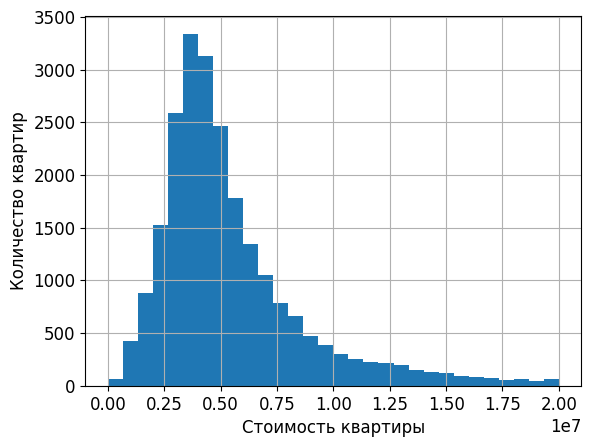

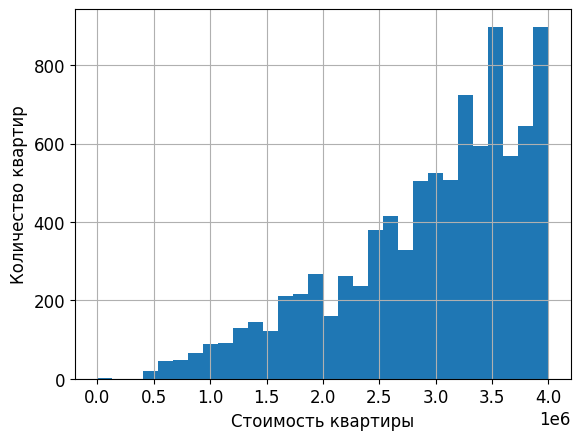

In [131]:
grafix(
    data.hist('last_price', bins=30, range=(0,2e+07)),
    'Стоимость квартиры'
)
grafix(
    data.hist('last_price', bins=30, range=(0,4e+06)),
    'Стоимость квартиры'
)

In [132]:
# удалим олигархов, чтобы не мешали
data.drop(index=data.query('last_price > 10e+08').index, inplace=True)

##### Общая площадь (total_area)

In [133]:
# посмотрим на распределение квартир по общей площади
box = px.box(data, x=['total_area'], range_x=[0, 900])
box.show()

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Здорово, что  проверяешь данные не "на глаз". Лучше посмотреть на выбросы и аномалии данных математически, и удалить их с помощью специального метода boxplot() 

In [134]:
print('Кол-во квартир < 15 кв.м.:', data.query('total_area < 15')['total_area'].count()) 
print('Кол-во квартир > 500 кв.м.:', data.query('total_area > 500')['total_area'].count())

Кол-во квартир < 15 кв.м.: 6
Кол-во квартир > 500 кв.м.: 7


In [135]:
# посмотрим на богатеев
display(data[data['total_area'] > 400].sort_values(by='total_area', ascending=False).head(5))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
19540,8,420000000,900.0,2017-12-06,12,2.8,25,409.7,25,False,False,False,112.0,0,санкт-петербург,30706.0,7877.0,0.0,NaN,2.0,318.0,106.0
12859,20,140000000,631.2,2019-04-09,7,3.9,4,322.3,4,False,False,False,19.5,1,санкт-петербург,25707.0,4972.0,0.0,NaN,2.0,210.0,NaN
3117,19,140000000,631.0,2019-03-30,7,3.1,5,511.0,5,False,False,False,60.0,0,санкт-петербург,25707.0,4972.0,0.0,NaN,2.0,210.0,NaN
15651,20,300000000,618.0,2017-12-18,7,3.4,7,258.0,5,False,False,False,70.0,0,санкт-петербург,32440.0,5297.0,0.0,NaN,2.0,198.0,111.0
5358,20,65000000,590.0,2019-02-14,15,3.5,6,409.0,3,False,False,False,100.0,0,санкт-петербург,24447.0,4666.0,1.0,767.0,0.0,NaN,14.0


Особняк снова не найден. Квартиры. Одна в 22 метрах от пруда. Ещё одно объявление "висело" более 1000 дней. Странная цена в объявлении о продаже квартиры площадью 494,1 кв.м от 2017-05-12.

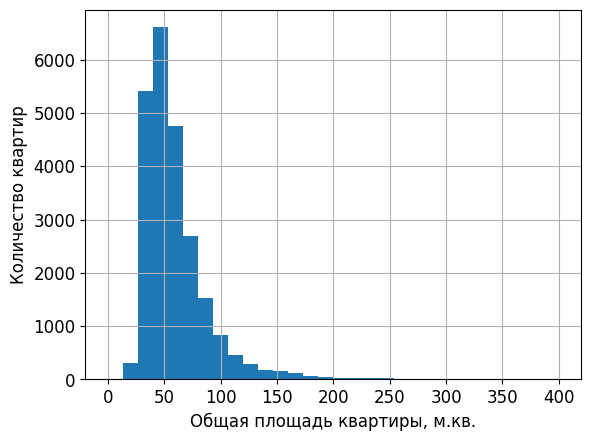

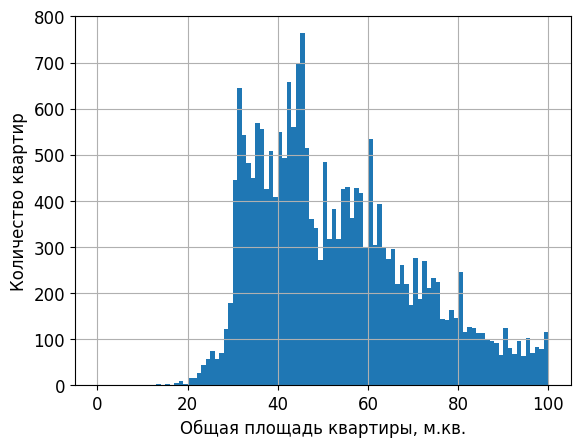

In [136]:
grafix(
    data.hist('total_area', bins=30, range=(0, 400)),
    'Общая площадь квартиры, м.кв.'
)
grafix(
    data.hist('total_area', bins=100, range=(0, 100)),
    'Общая площадь квартиры, м.кв.'
)

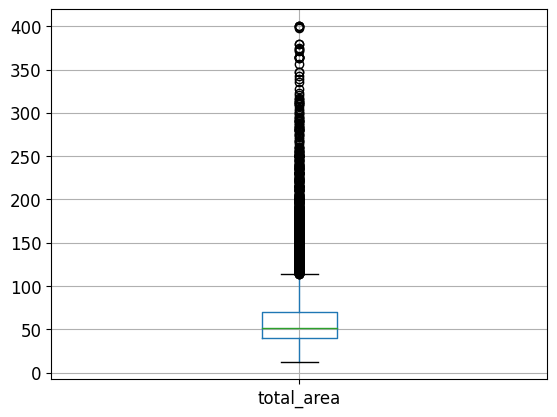

In [137]:
# удалим олигархов, чтобы не мешали
data.drop(index=data.query('( total_area > 400)').index, inplace=True)
data.boxplot(column="total_area");

##### Количество комнат (rooms)

<AxesSubplot:title={'center':'Распределение комнатности'}, xlabel='Количество комнат в квартире', ylabel='Количество квартир'>

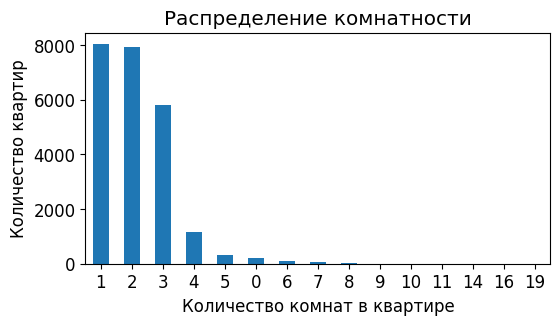

In [138]:
# Общая картина
data.rooms.value_counts() \
    .plot(kind='bar',
          title='Распределение комнатности',
          xlabel='Количество комнат в квартире',
          ylabel='Количество квартир',
          rot=0,
          figsize=(6,3)
         )

In [139]:
# посмотрим на "многокомнатных"
display(data[data['rooms'] > 7].sort_values(by='rooms', ascending=False).head(5))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
14498,6,32250000,374.6,2018-06-09,19,3.10,5,264.5,2,False,False,False,27.6,0,санкт-петербург,19497.0,3574.0,0.0,NaN,2.0,548.0,114.0
18848,6,28500000,270.0,2015-03-02,16,3.00,4,180.0,4,False,False,False,13.0,1,санкт-петербург,23575.0,4142.0,1.0,516.0,0.0,NaN,1365.0
866,5,25000000,363.0,2017-12-23,14,3.16,5,222.0,4,False,False,False,16.6,0,санкт-петербург,38076.0,7950.0,0.0,NaN,2.0,435.0,418.0
20829,6,28659000,245.4,2016-03-31,14,3.10,4,168.3,2,False,False,False,25.9,0,санкт-петербург,21104.0,2054.0,3.0,541.0,2.0,118.0,95.0
648,3,17500000,183.7,2018-07-01,11,3.40,7,138.8,7,False,False,False,13.3,0,санкт-петербург,23606.0,3148.0,0.0,NaN,0.0,NaN,NaN


Тоже богатеи. Квартиры и один таунхаус. Много "зависших" объявлений. Личных парков и прудов нет.

In [140]:
print('Квартиры без комнат:', data.query('rooms == 0')['rooms'].count())
print('Квартиры без комнат и студии:', data.query('rooms == 0 and studio')['rooms'].count()) 
print('Квартиры без комнат и апартаменты:', data.query('rooms == 0 and is_apartment')['rooms'].count()) 
print('Квартиры без комнат и свободная планировка:', data.query('rooms == 0 and open_plan')['rooms'].count())
print('Квартиры без комнат не апартаменты и не свободная планировка:', data.query('rooms == 0 and ~open_plan and ~studio')['rooms'].count())

Квартиры без комнат: 197
Квартиры без комнат и студии: 138
Квартиры без комнат и апартаменты: 0
Квартиры без комнат и свободная планировка: 59
Квартиры без комнат не апартаменты и не свободная планировка: 0


Ошибок с нулевым количеством комнат нет. Это студии плюс свободная планировка.

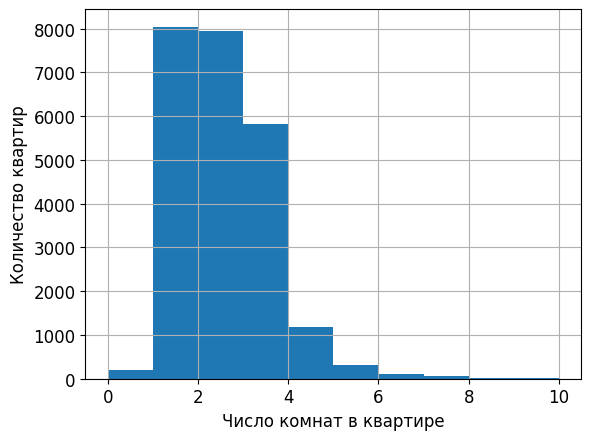

In [141]:
grafix(
    data.hist('rooms', bins=10, range=(0,10)),
    'Число комнат в квартире'
)

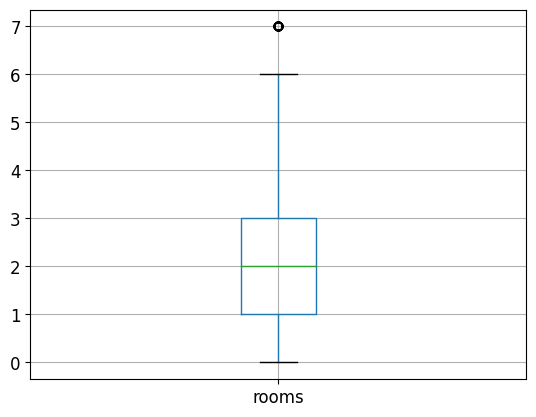

In [142]:
# удалим олигархов, чтобы не мешали
data.drop(index=data.query('rooms > 7').index, inplace=True)
data.boxplot(column="rooms");

##### Высота потолков (ceiling_height)

In [143]:
# Посмотрим на распределение квартир по высоте потолка
box = px.box(data, x=['ceiling_height'], range_x=[0,40])
box.show()

In [144]:
print('Квартиры с потолками > 5 метров:', data.query('ceiling_height > 5')['ceiling_height'].count())

Квартиры с потолками > 5 метров: 26


In [145]:
# посмотрим на "небожителей"
display(data[data['ceiling_height'] > 5].sort_values(by='ceiling_height', ascending=False).head(5))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
22869,0,15000000,25.0,2018-07-25,1,100.0,5,14.0,5,True,False,False,11.0,5,санкт-петербург,34963.0,8283.0,1.0,223.0,3.0,30.0,19.0
22336,19,9999000,92.4,2019-04-05,2,32.0,6,55.5,5,False,False,False,16.5,4,санкт-петербург,18838.0,3506.0,0.0,NaN,3.0,511.0,NaN
21377,19,4900000,42.0,2017-04-18,1,27.5,24,37.7,19,False,False,False,11.0,2,санкт-петербург,42742.0,9760.0,0.0,NaN,0.0,NaN,61.0
5807,17,8150000,80.0,2019-01-09,2,27.0,36,41.0,13,False,False,False,12.0,5,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,38.0
17857,1,3900000,56.0,2017-12-22,3,27.0,5,33.0,4,False,False,False,11.5,0,санкт-петербург,41030.0,15543.0,0.0,NaN,0.0,NaN,73.0


Пёстрая картина. Во многом неадекватная "стометровка"; ошибки в запятой от 32 до 24; 22,6 похожая на 2,6; 20 похожая на 2 с чем-то; 6 шт. от 14 до 8 - непонятно; 4 шт. 5,8-5,3 - возможно, мансардные; 5,2 похоже на двухэтажную квартиру с мансардой.

In [146]:
# удаляем "стометровку"
data.drop(index=data.query('ceiling_height > 36').index, inplace=True)

In [147]:
# делим на 10, чтобы получить от 2,4 до 3,6 метра
data.update(data[(data['ceiling_height'] >= 24) & (data['ceiling_height'] <= 36)]['ceiling_height']/10)

In [148]:
# Определение медианного значения высоты потолков в населённом пункте
locality_ceiling_median('красное село', True)

Общая медианная высота потолков (красное село): 2.6


In [149]:
# замена пропусков высоты потолков (красное село)
data.loc[(data['locality_name'] == 'красное село') &
        ((data['ceiling_height'] >= 8)), 'ceiling_height'] = locality_ceiling_median('красное село')

In [150]:
# Определение медианного значения высоты потолка в н.п.
locality_ceiling_median('деревня нурма', True)

Общая медианная высота потолков (деревня нурма): 2.5


In [151]:
# замена высоты потолка (деревня нурма)
data.loc[(data['locality_name'] == 'деревня нурма') &
        ((data['ceiling_height'] >= 8)),
         'ceiling_height'] = locality_ceiling_median('деревня нурма')

In [152]:
# замена высоты потолка в СПб (периферия)
data.loc[(data['locality_name'] == SPb) &
        ((data['ceiling_height'] < 23) & (data['ceiling_height'] >= 8)),
         'ceiling_height'] = ceiling_height_spb_p

In [153]:
# посмотрим ещё раз на "небожителей"
display(data[data['ceiling_height'] > 5].sort_values(by='ceiling_height', ascending=False).head(10))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
20264,17,119000000,187.6,2017-07-10,4,6.0,7,147.0,7,False,False,False,15.6,0,санкт-петербург,26902.0,5605.0,3.0,484.0,1.0,305.0,259.0
21227,0,8200000,71.0,2017-07-21,0,5.8,5,68.0,5,False,True,False,0.0,0,санкт-петербург,20170.0,1261.0,2.0,295.0,3.0,366.0,30.0
1388,20,59800000,399.0,2015-01-21,5,5.6,6,227.0,6,False,False,False,72.0,0,санкт-петербург,26204.0,6934.0,2.0,149.0,2.0,577.0,719.0
7578,17,38000000,143.0,2017-11-02,3,5.5,5,83.0,5,False,False,False,29.0,1,санкт-петербург,26333.0,6448.0,3.0,479.0,0.0,NaN,NaN
1026,20,155000000,310.0,2018-10-12,5,5.3,3,190.0,3,False,False,False,63.0,2,санкт-петербург,24899.0,4785.0,0.0,NaN,1.0,603.0,NaN
12628,14,3900000,50.0,2018-03-29,1,5.3,5,28.5,5,False,False,False,9.0,0,санкт-петербург,19644.0,3918.0,1.0,505.0,1.0,92.0,8.0
464,15,66571000,280.3,2015-06-11,6,5.2,8,159.5,7,False,False,False,21.1,0,санкт-петербург,26316.0,6655.0,3.0,187.0,1.0,616.0,578.0


In [154]:
# смотрим "карликов" в СПб
display(data[(data['locality_name'] == SPb) & (data['ceiling_height'] < 2.4)]\
        .sort_values(by='ceiling_height', ascending=True).head(10))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
22590,16,6000000,55.0,2018-10-31,2,1.00,12,32.4,7,False,False,False,10.0,0,санкт-петербург,33053.0,14217.0,2.0,293.0,2.0,289.0,13.0
16934,5,4100000,40.0,2017-10-17,1,1.75,37,17.4,5,False,False,False,8.3,0,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,71.0
552,11,2999000,33.5,2017-03-30,1,2.00,15,17.5,6,False,False,False,6.5,0,санкт-петербург,33972.0,11746.0,1.0,520.0,1.0,949.0,270.0
16446,6,12300000,88.3,2019-03-12,3,2.00,5,63.9,2,False,False,False,12.0,0,санкт-петербург,38415.0,7675.0,1.0,568.0,1.0,154.0,NaN
1582,4,4100000,45.6,2016-01-13,2,2.30,9,28.4,8,False,False,False,7.0,2,санкт-петербург,49152.0,14977.0,1.0,489.0,1.0,525.0,329.0


Для квартир с потолками 1 и 1.75, 2 метра ошибки "-2" и "-1" метр. Для 2.3 метра похоже на небольшую опечатку. 

In [155]:
# заполнение пропусков высоты потолков в СПб
data.loc[22590, 'ceiling_height'] = 3.0
data.loc[16934, 'ceiling_height'] = 2.75
data.loc[552, 'ceiling_height'] = 3.0
data.loc[16446, 'ceiling_height'] = 3.0
data.loc[1582, 'ceiling_height'] = 2.5

In [156]:
# проверка "карликов" в остальных н.п.
len(data[(data['ceiling_height'] < 2.4)]\
        .sort_values(by='ceiling_height', ascending=True).head(5))

0

In [157]:
data['ceiling_height'] = round(data['ceiling_height'], 2)

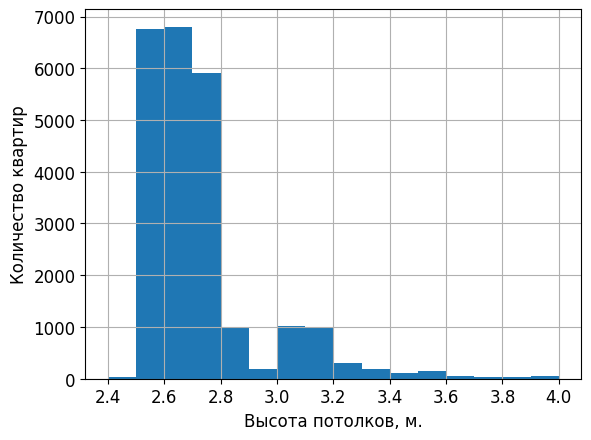

In [158]:
grafix(
    data.hist('ceiling_height', bins=16, range=(2.4, 4.0)),
    'Высота потолков, м.'
)

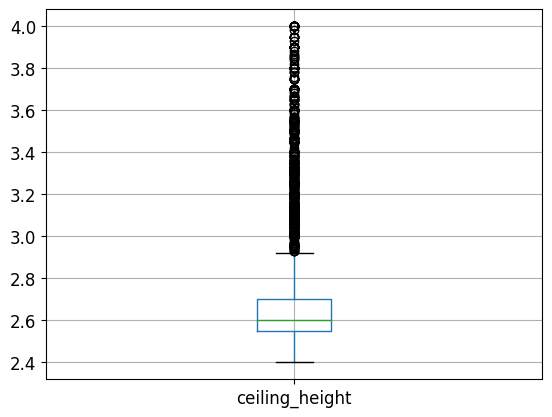

In [159]:
# удалим олигархов, чтобы не мешали
data.drop(index=data.query('ceiling_height > 4').index, inplace=True)
data.boxplot(column="ceiling_height");

##### Этажность (floors_total)

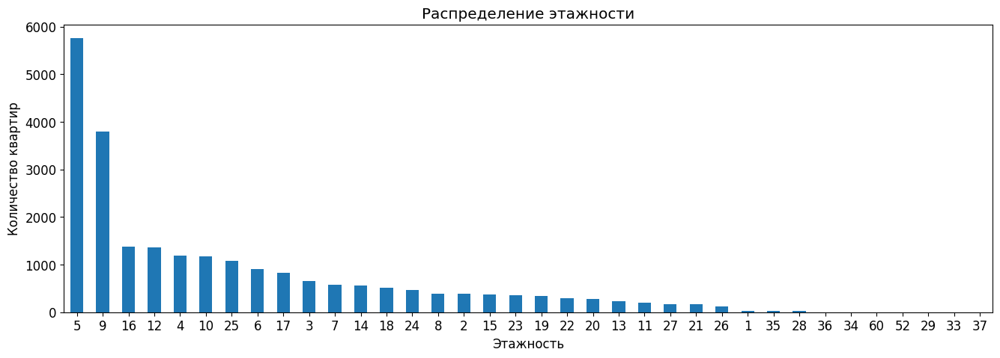

In [160]:
# Распределение этажности
data.floors_total.value_counts() \
    .plot(kind='bar',
          title='Распределение этажности',
          xlabel='Этажность',
          ylabel='Количество квартир',
          rot=0,
          figsize=(16, 5)
         );

In [161]:
print('Квартир в одноэтажных домах : ', data.query('floors_total == 1')['floors_total'].count())
print('Квартир с этажностью > 40 : ', len(data[data['floors_total'] > 40]))

Квартир в одноэтажных домах :  25
Квартир с этажностью > 40 :  2


In [162]:
# посмотрим на "одноэтажников"
data[data['floors_total'] == 1].sort_values(by='locality_name', ascending=False).head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
22550,2,5800000,115.0,2017-09-12,2,2.70,1,40.0,1,False,False,False,14.0,0,сестрорецк,54331.0,35394.0,0.0,NaN,0.0,NaN,124.0
8388,20,3550000,48.2,2019-03-30,3,2.70,1,33.9,1,False,False,False,9.1,0,сестрорецк,50046.0,31144.0,0.0,NaN,0.0,NaN,NaN
11641,6,3685000,44.7,2018-07-05,1,2.50,1,23.5,1,False,False,False,15.0,0,санкт-петербург,41351.0,15457.0,0.0,NaN,3.0,534.0,112.0
5787,16,9000000,88.0,2018-08-06,3,2.60,1,50.1,1,False,False,False,15.9,0,санкт-петербург,44870.0,20802.0,0.0,NaN,1.0,792.0,60.0
17744,8,2300000,50.9,2017-08-09,2,2.68,1,30.0,1,False,False,False,7.0,0,поселок суйда,NaN,NaN,NaN,NaN,NaN,NaN,454.0


Особняков нет. Квартиры как квартиры. В основном не СПб, что понятно. Одноэтажка в СПб - диковина, в деревне - норма, а в городках?

In [163]:
# посмотрим аналоги "однушки" для СПб (44870.0; 20802.0)
data.loc[(data['floors_total'] >= 1) &
         (data['airports_nearest'] >= 44800) & (data['airports_nearest'] <= 45000) &
         (data['cityCenters_nearest'] >= 20700) & (data['cityCenters_nearest'] <= 20900)] \
    .sort_values(by='floors_total').head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
5787,16,9000000,88.0,2018-08-06,3,2.6,1,50.1,1,False,False,False,15.9,0,санкт-петербург,44870.0,20802.0,0.0,NaN,1.0,792.0,60.0
673,5,4789500,46.5,2019-03-19,1,3.0,3,24.0,1,False,False,False,11.3,0,санкт-петербург,44870.0,20802.0,0.0,NaN,0.0,NaN,34.0
19521,6,10000000,71.0,2019-01-22,2,3.0,3,35.0,3,False,False,False,18.0,0,санкт-петербург,44870.0,20802.0,0.0,NaN,0.0,NaN,NaN
17638,10,10487000,72.9,2014-12-09,2,2.7,3,25.0,2,False,False,False,31.5,0,санкт-петербург,44870.0,20802.0,0.0,NaN,1.0,792.0,742.0
14459,4,9635328,76.8,2018-10-01,1,2.8,3,43.7,3,True,False,False,13.9,0,санкт-петербург,44870.0,20802.0,0.0,NaN,1.0,792.0,30.0


In [164]:
# надо исправлять на 3 или 4-этажку.
data.loc[5787, 'floors_total'] = 4

In [165]:
# смотрим вторую в СПб (41351.0; 15457.0)
data.loc[(data['floors_total'] >= 1) &
         (data['airports_nearest'] >= 41200) & (data['airports_nearest'] <= 41500) &
         (data['cityCenters_nearest'] >= 15300) & (data['cityCenters_nearest'] <= 15600)] \
    .sort_values(by='floors_total').head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
11641,6,3685000,44.7,2018-07-05,1,2.50,1,23.5,1,False,False,False,15.0,0,санкт-петербург,41351.0,15457.0,0.0,NaN,3.0,534.0,112.0
7768,9,2400000,31.0,2017-12-19,1,2.60,4,17.6,2,False,False,False,5.6,0,санкт-петербург,41463.0,15572.0,0.0,NaN,1.0,126.0,35.0
15722,12,3575000,43.0,2017-08-04,2,2.55,4,28.0,3,False,False,False,5.0,1,санкт-петербург,41313.0,15437.0,0.0,NaN,0.0,NaN,112.0
15601,10,3850000,58.0,2018-02-01,3,2.55,5,40.7,1,False,False,False,4.5,0,санкт-петербург,41313.0,15437.0,0.0,NaN,0.0,NaN,188.0
18135,8,3600000,49.9,2018-09-22,2,2.50,5,30.5,5,False,False,False,6.6,4,санкт-петербург,41429.0,15535.0,0.0,NaN,2.0,576.0,123.0


In [166]:
# Удаляем, т.к. совпадений по координатам нет.
data.drop(index=11641, inplace=True)

In [167]:
# в городках одноэтажки тоже не распространены, но 2- и 3-этажек много.
data[((data['locality_name'] == 'сестрорецк') | (data['locality_name'] == 'зеленогорск') |
     (data['locality_name'] == 'поселок стрельна') | (data['locality_name'] == 'высоцк')) &
     (data['floors_total'] == 1)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
8388,20,3550000,48.2,2019-03-30,3,2.70,1,33.9,1,False,False,False,9.1,0,сестрорецк,50046.0,31144.0,0.0,NaN,0.0,NaN,NaN
14836,3,3900000,45.0,2018-02-01,2,2.55,1,28.4,1,False,False,False,3.3,0,поселок стрельна,26770.0,23654.0,0.0,NaN,2.0,640.0,196.0
22550,2,5800000,115.0,2017-09-12,2,2.70,1,40.0,1,False,False,False,14.0,0,сестрорецк,54331.0,35394.0,0.0,NaN,0.0,NaN,124.0
22855,16,2950000,31.0,2018-03-07,1,2.55,1,16.4,1,False,False,False,5.6,0,зеленогорск,73115.0,54214.0,3.0,188.0,1.0,269.0,328.0
23498,7,1600000,54.0,2016-12-26,2,2.50,1,33.0,1,False,False,False,3.5,0,высоцк,NaN,NaN,NaN,NaN,NaN,NaN,281.0


In [168]:
# Малоэтажная застройка. Реальная одноэтажка в городке - не аномалия.
data.loc[(data['locality_name'] == 'сестрорецк')] \
    .sort_values(by='floors_total').head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
22550,2,5800000,115.0,2017-09-12,2,2.7,1,40.0,1,False,False,False,14.0,0,сестрорецк,54331.0,35394.0,0.0,NaN,0.0,NaN,124.0
8388,20,3550000,48.2,2019-03-30,3,2.7,1,33.9,1,False,False,False,9.1,0,сестрорецк,50046.0,31144.0,0.0,NaN,0.0,NaN,NaN
21775,18,5990000,82.0,2015-12-14,3,2.7,3,39.0,3,False,False,False,10.0,0,сестрорецк,50031.0,31130.0,0.0,NaN,0.0,NaN,224.0
9065,11,4300000,36.5,2018-11-26,1,2.7,3,15.3,2,False,False,False,11.0,0,сестрорецк,54148.0,35248.0,0.0,NaN,0.0,NaN,46.0
777,16,18000000,100.0,2015-12-09,3,2.7,3,50.8,2,False,False,False,14.0,0,сестрорецк,57815.0,34745.0,2.0,265.0,1.0,651.0,215.0


In [169]:
# Малоэтажная застройка есть. Оставляю.
data.loc[(data['locality_name'] == 'зеленогорск') |
         (data['locality_name'] == 'поселок городского типа рощино')] \
    .sort_values(by='floors_total').head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
22855,16,2950000,31.0,2018-03-07,1,2.55,1,16.4,1,False,False,False,5.6,0,зеленогорск,73115.0,54214.0,3.0,188.0,1.0,269.0,328.0
19590,20,6150000,95.0,2018-07-29,2,2.55,1,65.0,1,False,False,False,21.0,0,поселок городского типа рощино,NaN,NaN,NaN,NaN,NaN,NaN,23.0
4379,5,5300000,58.5,2017-11-15,2,2.55,1,31.6,1,False,False,False,9.4,0,поселок городского типа рощино,NaN,NaN,NaN,NaN,NaN,NaN,226.0
11244,8,4250000,32.0,2018-02-04,1,2.55,2,20.0,2,False,False,False,7.0,0,зеленогорск,72713.0,59052.0,3.0,148.0,1.0,671.0,24.0
15535,16,2100000,36.1,2018-03-26,2,2.55,2,23.6,1,False,False,False,5.0,0,поселок городского типа рощино,NaN,NaN,NaN,NaN,NaN,NaN,263.0


In [170]:
# посмотрим на небоскрёбы
data[(data['floors_total'] > 35)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
397,15,5990000,54.0,2018-03-22,2,2.60,36,21.4,28,False,False,False,18.7,1,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,11.0
2253,12,3800000,45.5,2018-06-28,2,2.55,60,27.4,4,False,False,False,7.4,0,кронштадт,67763.0,49488.0,2.0,342.0,3.0,614.0,166.0
5807,17,8150000,80.0,2019-01-09,2,2.70,36,41.0,13,False,False,False,12.0,5,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,38.0
11079,16,9200000,75.0,2019-02-22,2,2.70,36,40.0,29,False,False,False,12.0,2,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,NaN
16731,9,3978000,40.0,2018-09-24,1,2.65,52,10.5,18,False,False,False,14.0,0,санкт-петербург,20728.0,12978.0,1.0,793.0,0.0,NaN,45.0
16934,5,4100000,40.0,2017-10-17,1,2.75,37,17.4,5,False,False,False,8.3,0,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,71.0


In [171]:
# посмотрим аналоги в Кронштадте для (67763.0; 49488.0)
data.loc[(data['floors_total'] >= 3) &
         (data['airports_nearest'] >= 67600) & (data['airports_nearest'] <= 68100) &
         (data['cityCenters_nearest'] >= 49300) & (data['cityCenters_nearest'] <= 49800)] \
    .sort_values(by='cityCenters_nearest').head(4)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
21022,9,3000000,38.1,2018-09-18,1,2.55,9,19.4,1,False,False,False,8.4,0,кронштадт,67665.0,49391.0,2.0,619.0,2.0,212.0,62.0
2253,12,3800000,45.5,2018-06-28,2,2.55,60,27.4,4,False,False,False,7.4,0,кронштадт,67763.0,49488.0,2.0,342.0,3.0,614.0,166.0
12203,10,2800000,30.2,2018-10-25,1,2.55,5,17.0,3,False,False,False,6.0,1,кронштадт,67816.0,49542.0,2.0,445.0,2.0,387.0,7.0
17913,15,2490000,30.2,2018-11-06,1,2.55,5,16.6,5,False,False,False,5.5,0,кронштадт,67816.0,49542.0,2.0,445.0,2.0,387.0,32.0


In [172]:
# просто многоэтажки Кронштадта. Чем дальше в лес, тем... больше других ошибок видишь.
data.loc[(data['locality_name'] == 'кронштадт')].sort_values(by='floors_total', ascending=False).head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
2253,12,3800000,45.5,2018-06-28,2,2.55,60,27.4,4,False,False,False,7.4,0,кронштадт,67763.0,49488.0,2.0,342.0,3.0,614.0,166.0
10189,16,4450000,62.5,2018-02-11,2,2.55,20,36.5,16,False,False,False,10.1,0,кронштадт,68042.0,49767.0,3.0,526.0,2.0,352.0,45.0
8826,20,3550000,47.0,2017-06-02,1,2.55,15,19.0,11,False,False,False,11.0,1,кронштадт,65254.0,46979.0,1.0,266.0,1.0,1110.0,190.0
23114,6,7300000,102.0,2017-11-16,3,2.55,13,55.0,3,False,False,False,16.0,5,кронштадт,65254.0,46979.0,1.0,266.0,1.0,1110.0,199.0
11190,7,3200000,30.0,2017-04-23,1,2.55,12,18.3,9,False,False,False,6.6,1,кронштадт,65328.0,47054.0,1.0,173.0,1.0,936.0,45.0


In [173]:
# нет в Кронштадте ни 60-этажек, ни 20-этажек, ни 13-этажек.
# удаляем 60-этажку. А кто-то старался 12 фотографий прикрепил, но координаты квартиры без аналогов.
# c 20-этажкой проще. Это 5-этажка и этаж 4 вместо 16. Чудеса умножения на х4.
# c 13-этажкой ещё проще. Это 15-этажка (2007 года постройки)
data.drop(index=data.query('floors_total > 59').index, inplace=True)
data.loc[10189, 'floors_total'] = 5
data.loc[10189, 'floor'] = 4
data.loc[23114, 'floors_total'] = 15

In [174]:
# смотрим для СПб 52-этажку (20728.0; 12978.0)
data.loc[(data['floors_total'] >= 1) &
         (data['airports_nearest'] >= 20600) & (data['airports_nearest'] <= 20800) &
         (data['cityCenters_nearest'] >= 12800) & (data['cityCenters_nearest'] <= 13100)] \
    .sort_values(by='cityCenters_nearest').head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
10279,13,4350000,41.0,2017-05-30,1,3.40,4,22.0,2,False,False,False,9.4,0,санкт-петербург,20637.0,12887.0,2.0,488.0,0.0,NaN,525.0
15675,14,4250000,41.0,2017-08-07,1,3.20,4,22.0,1,False,False,False,9.4,0,санкт-петербург,20637.0,12887.0,2.0,488.0,0.0,NaN,374.0
16731,9,3978000,40.0,2018-09-24,1,2.65,52,10.5,18,False,False,False,14.0,0,санкт-петербург,20728.0,12978.0,1.0,793.0,0.0,NaN,45.0


In [175]:
# Удаляем, т.к. нет аналогов
data.drop(index=data.query('floors_total > 50').index, inplace=True)

In [176]:
# смотрим для СПб 37-этажку (18732.0; 20444.0). Входит в "жилой комплекс". Оставляем.
data.loc[(data['floors_total'] >= 1) &
         (data['airports_nearest'] >= 18600) & (data['airports_nearest'] <= 18900) &
         (data['cityCenters_nearest'] >= 20300) & (data['cityCenters_nearest'] <= 20600)] \
    .sort_values(by='cityCenters_nearest').head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
18617,8,7350000,68.5,2017-10-09,2,2.6,35,27.0,3,False,False,False,23.0,1,санкт-петербург,18627.0,20339.0,1.0,609.0,3.0,145.0,41.0
4855,12,5500000,50.0,2017-06-22,1,2.8,35,22.0,4,False,False,False,13.0,0,санкт-петербург,18627.0,20339.0,1.0,609.0,3.0,145.0,537.0
397,15,5990000,54.0,2018-03-22,2,2.6,36,21.4,28,False,False,False,18.7,1,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,11.0
21599,12,6200000,51.0,2017-08-27,2,2.6,35,27.0,13,False,False,False,19.0,0,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,NaN
20938,18,9900000,100.9,2019-04-08,3,2.6,35,53.4,22,False,False,False,13.4,0,санкт-петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,NaN


In [177]:
print('Квартир в одноэтажных домах : ', data.query('floors_total == 1')['floors_total'].count())
print('Квартир с этажностью > 40 : ', len(data[data['floors_total'] > 40]))

Квартир в одноэтажных домах :  23
Квартир с этажностью > 40 :  0


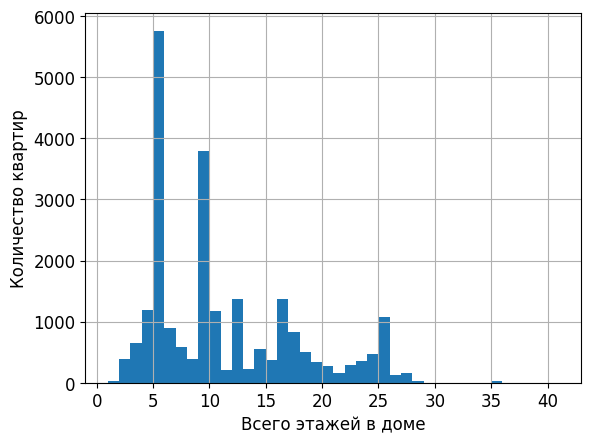

In [178]:
grafix(
    data.hist('floors_total', bins=40, range=(1, 41)),
    'Всего этажей в доме'
)

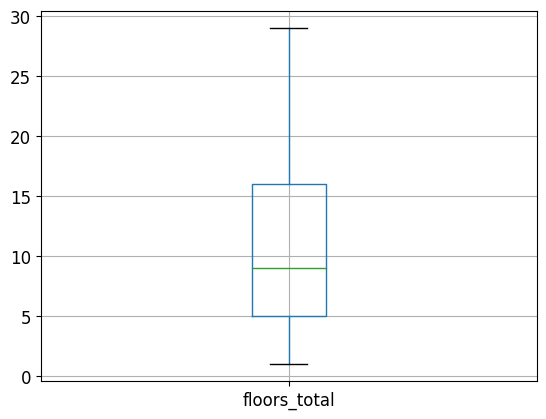

In [179]:
# удалим детище олигархов, чтобы не мешало
data.drop(index=data.query('floors_total > 30').index, inplace=True)
data.boxplot(column="floors_total");

##### Жилая площадь (living_area)

In [180]:
print('Жилая площадь < 10 кв.м.:',
      data.query('living_area < 10 & ~(studio) & ~(open_plan)')['living_area'].count())
print('Жилая площадь < 0 кв.м.:', data.query('living_area < 0')['living_area'].count())
print('Жилая площадь > общей:', data.query('living_area > total_area')['living_area'].count())
print('Жилая площадь > 200 кв.м.:', data.query('living_area > 200')['living_area'].count())

Жилая площадь < 10 кв.м.: 42
Жилая площадь < 0 кв.м.: 2
Жилая площадь > общей: 0
Жилая площадь > 200 кв.м.: 17


In [181]:
# просмотр квартир с жилой площадью < 10 метров
data[(data['living_area'] < 10) & ~(data['studio'])] \
    .sort_values(by='total_area', ascending=False).head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
23574,14,64990000,139.0,2015-11-24,3,3.0,8,3.0,8,False,False,False,16.0,1,санкт-петербург,33255.0,5975.0,1.0,630.0,3.0,100.0,280.0
19382,9,20786000,109.0,2018-07-16,2,3.0,7,3.0,4,False,False,False,53.0,0,санкт-петербург,24283.0,4850.0,2.0,335.0,0.0,NaN,5.0
5297,19,45000000,96.0,2018-11-15,2,3.2,6,6.0,4,True,False,False,45.0,1,санкт-петербург,21860.0,318.0,2.0,160.0,3.0,569.0,NaN
21943,15,6100000,77.6,2019-02-28,4,2.5,9,5.4,1,False,False,False,9.8,0,санкт-петербург,29338.0,11270.0,1.0,584.0,0.0,NaN,33.0
2869,6,16000000,73.0,2018-10-22,2,3.1,6,3.0,4,False,False,False,35.0,0,санкт-петербург,23756.0,3322.0,0.0,NaN,1.0,859.0,115.0


Перепутанные местами площади кухни и жилой, опечатки в жилой, просто непонятные значения.

In [182]:
# Функция обмена или замены значений площащи жилой и кухни
def change_area(row):
    if row['living_area'] < 10:
        if (row['living_area'] < row['kitchen_area']) & (row['studio'] == False):
            ta = row['total_area']
            la = row['living_area']
            ka = row['kitchen_area']         
            if (ta >= (2*la + ka - ta/15)) & (ta <= (2*la + ka + ta/15)):
                buf = row['living_area']
                row['living_area'] = row['kitchen_area']
                row['kitchen_area'] = buf
                return row[['living_area', 'kitchen_area']]
            else:
                row['living_area'] = row['total_area']*share_living_area
                row['kitchen_area'] = row['total_area']*share_kitchen_area
                return row[['living_area', 'kitchen_area']] 
                
    return row[['living_area', 'kitchen_area']]

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Тут согласен

In [183]:
data[['living_area', 'kitchen_area']] = data.apply(change_area, axis=1)

In [184]:
print('Жилая площадь < 10 кв.м.: ', data.query('(living_area < 10) & ~(studio) & ~(open_plan)') \
      ['living_area'].count())

Жилая площадь < 10 кв.м.:  9


In [185]:
# смотрим квартиры с жилой меньше 10 метров
data[(data['living_area'] < 10) & ~(data['studio'])] \
    .sort_values(by='total_area', ascending=False).head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
8325,9,4800000,52.0,2017-10-25,2,2.60,5,9.0,2,False,False,False,6.0,1,санкт-петербург,33358.0,13171.0,0.0,NaN,2.0,118.0,119.0
114,5,4000000,21.4,2019-02-07,1,2.90,8,8.3,7,False,False,False,6.3,0,санкт-петербург,27089.0,5791.0,2.0,488.0,1.0,286.0,NaN
4542,12,3300000,18.0,2018-11-07,1,3.50,5,9.0,2,False,False,False,4.5,0,санкт-петербург,25157.0,4948.0,2.0,349.0,1.0,963.0,9.0
22356,6,2050000,17.2,2019-01-13,1,2.77,23,9.8,1,False,False,False,3.1,0,санкт-петербург,33645.0,13513.0,0.0,NaN,0.0,NaN,7.0
12040,5,1900000,15.0,2018-06-27,1,2.50,5,8.8,1,False,False,False,2.6,0,сосновый бор,NaN,NaN,NaN,NaN,NaN,NaN,45.0
16949,9,1550000,15.0,2018-08-21,1,2.70,9,8.5,1,False,False,False,2.7,0,санкт-петербург,51048.0,16376.0,0.0,NaN,1.0,1079.0,42.0
19558,2,1686000,13.2,2018-12-17,1,3.10,5,7.5,1,False,False,False,2.4,0,санкт-петербург,19891.0,4165.0,1.0,361.0,1.0,155.0,19.0
17961,3,1400000,13.0,2017-12-03,1,2.60,9,7.4,1,False,False,False,2.3,0,санкт-петербург,14350.0,15945.0,0.0,NaN,1.0,185.0,410.0
19546,3,1850000,13.0,2019-03-11,1,3.40,5,7.4,2,False,False,False,2.3,0,санкт-петербург,24915.0,5483.0,1.0,644.0,0.0,NaN,24.0


Почти все по площади очень похожи на студии, но при изучении по домам не подтвердилось. Микроскопические "однушки".

In [186]:
# переведём однушки в открытую планировку
data.loc[(data['living_area'] < 10) & ~(data['studio'] & (data['rooms'] == 1)), 'open_plan'] = True 

In [187]:
# последние из маломерок смотрим "двушки" по координатам. И снова нет ничего похожего.
data[(data['rooms'] == 2) &
     (((data['cityCenters_nearest'] >= 13000) & (data['cityCenters_nearest'] <= 13300)) & 
      ((data['airports_nearest'] > 33200) & (data['airports_nearest'] <= 33500)))] \
    .sort_values(by='cityCenters_nearest', ascending=False).head(15)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
8325,9,4800000,52.0,2017-10-25,2,2.60,5,9.0,2,False,False,True,6.0,1,санкт-петербург,33358.0,13171.0,0.0,NaN,2.0,118.0,119.0
6444,7,5700000,52.0,2018-08-31,2,2.70,16,32.0,6,False,False,False,8.0,0,санкт-петербург,33301.0,13041.0,0.0,NaN,1.0,1034.0,NaN
17974,12,5500000,54.0,2018-11-28,2,2.65,16,31.0,4,False,False,False,9.0,1,санкт-петербург,33301.0,13041.0,0.0,NaN,1.0,1034.0,10.0
18403,10,5320000,52.4,2019-02-26,2,2.65,16,31.3,2,False,False,False,17.5,0,санкт-петербург,33301.0,13041.0,0.0,NaN,1.0,1034.0,60.0


In [188]:
# подправим жилую площадь для "двушки" на "глазок.
data.loc[8325, 'living_area'] = 52 - 2*6 - 3

In [189]:
print('Жилая площадь < 10 кв.м.:',
      data.query('living_area < 10 & ~(studio) & ~(open_plan)')['living_area'].count())
print('Жилая площадь < 0 кв.м.:', data.query('living_area < 0')['living_area'].count())
print('Жилая площадь > общей:', data.query('living_area > total_area')['living_area'].count())
print('Жилая площадь > 200 кв.м.:', data.query('living_area > 200')['living_area'].count())

Жилая площадь < 10 кв.м.: 0
Жилая площадь < 0 кв.м.: 0
Жилая площадь > общей: 0
Жилая площадь > 200 кв.м.: 17


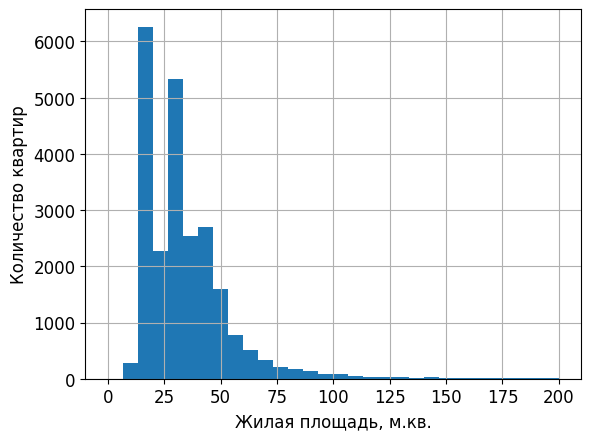

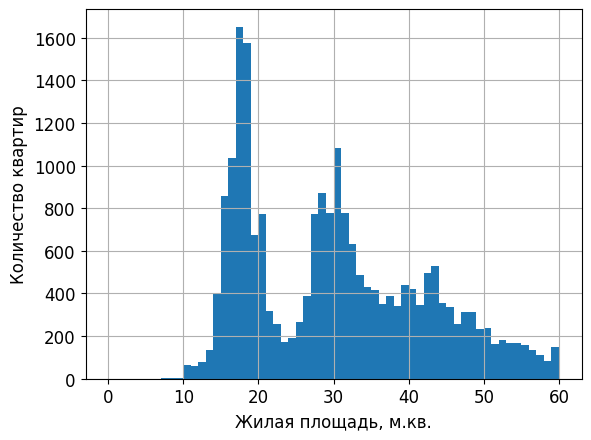

In [190]:
grafix(
    data.hist('living_area', bins=30, range=(0, 200)),
    'Жилая площадь, м.кв.',
)
grafix(
    data.hist('living_area', bins=60, range=(0, 60)),
    'Жилая площадь, м.кв.'
)

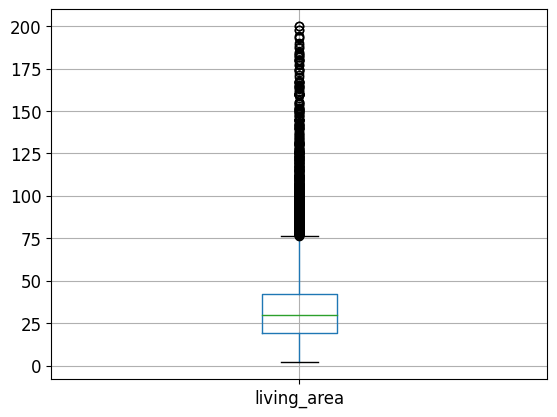

In [191]:
# удалим олигархов, чтобы не мешали
data.drop(index=data.query('living_area > 200').index, inplace=True)
data.boxplot(column="living_area");

##### Этаж (floor)

In [192]:
print('Этажей нулевых:', data.query('floor == 0')['floor'].count())
print('Этажей выше 30-го:', data.query('floor > 30')['floor'].count())
print('Этажей больше этажности:', data.query('floor > floors_total')['floor'].count())

Этажей нулевых: 0
Этажей выше 30-го: 0
Этажей больше этажности: 0


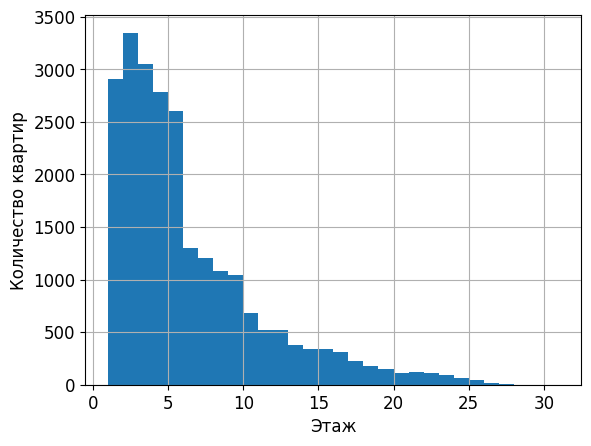

In [193]:
grafix(
    data.hist('floor', bins=30, range=(1, 31)),
    'Этаж'
)

##### Площадь кухни (kitchen_area)

In [194]:
print('Площадь кухни < 2 кв.м.:', data.query('kitchen_area < 2')['living_area'].count())
print('Площадь кухни = 5 кв.м.:', data.query('kitchen_area == 5')['living_area'].count())
print('Площадь кухни > 50 кв.м.:', data.query('kitchen_area > 50')['living_area'].count())
print('Площадь кухни > общей:', data.query('kitchen_area > total_area')['living_area'].count())
print('Площадь кухни < 1 кв.м.:',
      data.query('(kitchen_area < 1) & ~(studio) & ~(open_plan)')['kitchen_area'].count())

Площадь кухни < 2 кв.м.: 165
Площадь кухни = 5 кв.м.: 380
Площадь кухни > 50 кв.м.: 42
Площадь кухни > общей: 0
Площадь кухни < 1 кв.м.: 3


In [195]:
# просмотр квартир с кухней < 1 метра
data[(data['kitchen_area'] < 1) & ~(data['studio'])] \
    .sort_values(by='total_area', ascending=False).head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
20256,5,13351000,102.70,2018-07-03,6,3.40,4,101.0,1,False,False,False,0.9,0,санкт-петербург,24477.0,5464.0,2.0,519.0,0.0,NaN,229.0
2959,9,2550000,32.00,2017-12-02,1,2.75,14,30.2,13,False,False,False,0.9,1,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,157.0
10606,14,2950000,25.27,2017-11-17,0,2.60,25,25.0,11,False,False,True,0.1,1,санкт-петербург,11405.0,13222.0,0.0,NaN,1.0,623.0,51.0
9861,10,2350000,25.00,2017-12-03,0,2.70,22,25.0,17,False,False,True,0.0,2,поселок мурино,NaN,NaN,NaN,NaN,NaN,NaN,13.0
12691,1,3700000,24.20,2017-11-10,0,2.60,19,24.2,13,False,False,True,0.0,1,санкт-петербург,17837.0,16840.0,0.0,NaN,2.0,210.0,74.0
21802,6,1737000,17.78,2018-11-22,1,2.60,9,15.9,1,False,False,False,0.9,0,санкт-петербург,13289.0,12086.0,0.0,NaN,0.0,NaN,66.0


In [196]:
# посмотрим для 6-комнатной возможные аналоги в этом доме. Комнат пять, а не шесть и т.д.
data[(data['rooms'] >= 4) &
     (((data['cityCenters_nearest'] >= 5300) & (data['cityCenters_nearest'] <= 5600)) & 
      ((data['airports_nearest'] > 24300) & (data['airports_nearest'] <= 24600)))] \
    .sort_values(by='cityCenters_nearest', ascending=False).head(15)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
4090,8,33800000,147.0,2018-02-09,4,3.0,8,88.2,2,False,False,False,13.8,0,санкт-петербург,24463.0,5480.0,3.0,406.0,0.0,NaN,218.0
2426,5,8500000,101.4,2017-05-04,5,3.4,5,63.4,1,False,False,False,19.0,0,санкт-петербург,24477.0,5464.0,2.0,519.0,0.0,NaN,264.0
20256,5,13351000,102.7,2018-07-03,6,3.4,4,101.0,1,False,False,False,0.9,0,санкт-петербург,24477.0,5464.0,2.0,519.0,0.0,NaN,229.0


In [197]:
# исправляем по корректному аналогу
data.loc[20256, 'rooms'] = 5
data.loc[20256, 'floors_total'] = 5
data.loc[20256, 'living_area'] = 63.4
data.loc[20256, 'kitchen_area'] = 19

In [198]:
# посмотрим на 32 метровую "однушку". Находим дом с такими же квартирами.
data[(data['locality_name'] == 'деревня кудрово') & (data['rooms'] == 1) &
     (data['total_area'] < 35) & (data['floors_total'] == 14)] \
    .sort_values(by='total_area', ascending=False).head(15)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
6461,19,3300000,34.0,2017-09-06,1,2.75,14,16.5,11,False,False,False,8.5,1,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,68.0
5657,10,3360000,33.0,2018-02-19,1,2.75,14,16.3,5,False,False,False,8.5,0,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,126.0
18991,18,3850000,33.0,2018-03-20,1,2.75,14,16.3,7,False,False,False,8.0,0,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,45.0
2959,9,2550000,32.0,2017-12-02,1,2.75,14,30.2,13,False,False,False,0.9,1,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,157.0
12296,6,3865000,31.2,2018-06-16,1,2.75,14,15.0,6,False,False,False,8.9,0,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,5.0
20761,18,3250000,31.0,2018-04-06,1,2.75,14,15.0,13,False,False,False,8.5,1,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,22.0
10040,11,2570000,27.0,2016-12-06,1,2.75,14,18.4,6,False,False,False,4.3,0,деревня кудрово,NaN,NaN,NaN,NaN,NaN,NaN,541.0


In [199]:
# исправляем 32 метровую
data.loc[2959, 'living_area'] = 15.0
data.loc[2959, 'kitchen_area'] = 9.0

In [200]:
# поиск дома для 17 метровой
data[(data['rooms'] <= 1) &
     (((data['cityCenters_nearest'] >= 11900) & (data['cityCenters_nearest'] <= 12200)) & 
      ((data['airports_nearest'] > 13100) & (data['airports_nearest'] <= 13300)))] \
    .sort_values(by='cityCenters_nearest', ascending=False).head(15)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
21802,6,1737000,17.78,2018-11-22,1,2.60,9,15.9,1,False,False,False,0.9,0,санкт-петербург,13289.0,12086.0,0.0,NaN,0.0,NaN,66.0
13079,9,4500000,44.00,2017-09-10,1,2.60,22,34.0,9,False,False,False,10.0,2,санкт-петербург,13275.0,12071.0,0.0,NaN,0.0,NaN,59.0
4625,9,3600000,27.10,2019-02-12,1,2.60,12,19.5,2,False,False,False,3.8,0,санкт-петербург,13194.0,11990.0,0.0,NaN,1.0,1154.0,14.0
14830,17,4850000,42.90,2018-08-18,1,2.70,12,21.5,2,False,False,False,11.3,0,санкт-петербург,13194.0,11990.0,0.0,NaN,1.0,1154.0,123.0
973,11,4500000,34.00,2019-02-27,1,2.65,17,16.0,11,False,False,False,9.0,1,санкт-петербург,13172.0,11969.0,0.0,NaN,0.0,NaN,47.0
5524,17,3995000,33.90,2018-09-02,1,2.55,17,15.9,7,False,False,False,9.8,1,санкт-петербург,13172.0,11969.0,0.0,NaN,0.0,NaN,78.0


In [201]:
# Дом отсутствует. Переводим в свободную планировку
data.loc[21802, 'open_plan'] = True

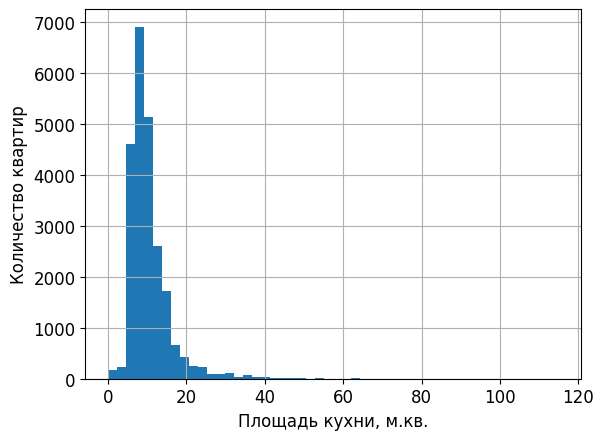

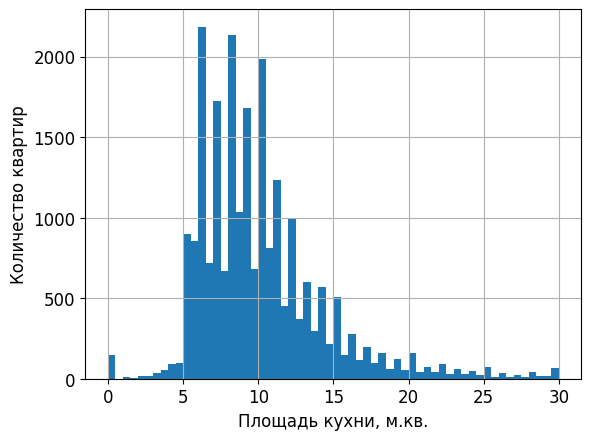

In [202]:
grafix(
    data.hist('kitchen_area', bins=50),
    'Площадь кухни, м.кв.'
)
grafix(
    data.hist('kitchen_area', bins=60, range=(0,30)),
    'Площадь кухни, м.кв.'
)

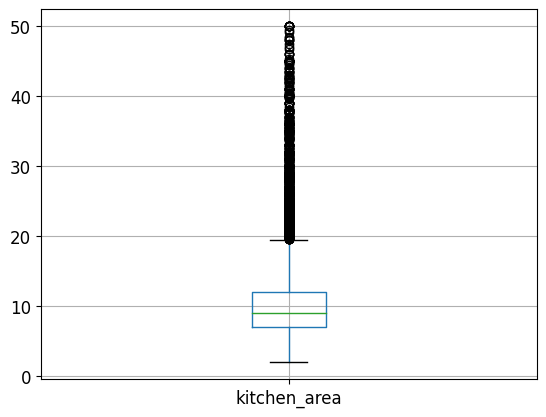

In [203]:
# удалим олигархов и "странных", чтобы не мешали
data.drop(index=data.query('kitchen_area > 50').index, inplace=True)
data.drop(index=data.query('kitchen_area < 2').index, inplace=True)
data.boxplot(column="kitchen_area");

##### Количество балконов (balcony)

In [204]:
print('Квартир 1-комнатных с количеством балконов = 5:',
      data.query('(rooms == 1) & (balcony == 5)')['balcony'].count())
print('Квартир 2-комнатных с количеством балконов = 5:',
      data.query('(rooms == 2) & (balcony == 5)')['balcony'].count())
print('Квартир 3-комнатных с количеством балконов = 5:',
      data.query('(rooms == 3) & (balcony == 5)')['balcony'].count())
print('Квартир 4-комнатных с количеством балконов = 5:',
      data.query('(rooms == 4) & (balcony == 5)')['balcony'].count())
print('Квартир 5-комнатных с количеством балконов = 5:',
      data.query('(rooms == 5) & (balcony == 5)')['balcony'].count())

Квартир 1-комнатных с количеством балконов = 5: 24
Квартир 2-комнатных с количеством балконов = 5: 82
Квартир 3-комнатных с количеством балконов = 5: 166
Квартир 4-комнатных с количеством балконов = 5: 23
Квартир 5-комнатных с количеством балконов = 5: 5


Пять балконов даже для 4-комнатной редкость. Ну угловые "трёшки" ещё с двумя окнами в комнате как фантазия. Но куда поместить пять балконов в 2-, а тем болеев 1-комнатную квартиру?

In [205]:
# нужна полная картина
data.pivot_table(index='rooms', columns='balcony', values='studio', aggfunc='count', fill_value=0)

balcony,0,1,2,3,4,5
rooms,,,,,,
0,13,11,27,0,0,0
1,5023,1467,1476,2,16,24
2,5064,1543,1140,21,61,82
3,3747,908,826,41,80,166
4,865,153,90,12,18,23
5,240,41,15,3,5,5
6,78,16,3,0,0,0
7,31,8,0,1,0,0


Для 1-, 2-, 3-комнатных в категории 4 и 5 балконов есть "лажа". В 1-комнатных виднее всех.

In [206]:
len(data[(data['rooms'] == 1) & (data['total_area'] >= 50) & (data['balcony'] > 3)])

10

In [207]:
# смотрим однокомнатные
# через балконы вскрыли ошибки в количестве комнат. Есть 4-, 3-, 2-комнатные.
# но с "многобалконными" всё равно большой перебор
data[(data['rooms'] == 1) & (data['total_area'] > 50) & (data['balcony'] > 3)] \
    .sort_values(by='total_area', ascending=False).head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
17520,12,11500000,95.0,2017-02-14,1,2.75,16,60.0,13,False,False,False,12.0,5,санкт-петербург,36525.0,12107.0,2.0,561.0,2.0,612.0,47.0
22586,6,7753921,63.6,2018-07-24,1,3.00,4,39.1,3,False,False,False,12.3,5,санкт-петербург,46015.0,20802.0,0.0,NaN,1.0,792.0,NaN
8322,20,39900000,55.3,2017-10-26,1,3.05,6,35.0,4,False,False,False,8.0,4,санкт-петербург,25685.0,2136.0,1.0,72.0,3.0,202.0,NaN
18194,6,2290000,55.0,2018-08-28,1,2.55,11,24.5,10,False,False,False,12.0,4,отрадное,NaN,NaN,NaN,NaN,NaN,NaN,43.0
19017,12,4887000,52.4,2018-03-19,1,3.10,4,24.7,2,True,False,False,11.7,5,санкт-петербург,44870.0,20802.0,0.0,NaN,1.0,792.0,113.0


In [208]:
# смотрим для 95 м. (36525.0; 12107.0). Так и есть. Минимум "трёшка"
data[ 
    ((data['airports_nearest'] > 36500) & (data['airports_nearest'] <= 36600)) & 
    ((data['cityCenters_nearest'] >= 12000) & (data['cityCenters_nearest'] <= 12200))] \
    .sort_values(by='total_area', ascending=False).head(6)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
13502,19,12450000,190.0,2016-09-26,3,2.55,16,48.0,3,False,False,False,35.0,2,санкт-петербург,36520.0,12041.0,1.0,718.0,0.0,NaN,837.0
19616,19,15500000,106.2,2018-08-18,3,2.75,25,59.7,2,False,False,False,12.5,0,санкт-петербург,36598.0,12120.0,1.0,523.0,1.0,648.0,NaN
13346,20,15200000,101.0,2018-01-16,3,2.75,25,58.4,13,False,False,False,16.4,0,санкт-петербург,36575.0,12097.0,1.0,610.0,1.0,654.0,168.0
17793,7,9400000,95.9,2018-12-12,4,2.70,12,54.6,1,False,False,False,17.3,0,санкт-петербург,36552.0,12074.0,1.0,603.0,1.0,712.0,6.0
17520,12,11500000,95.0,2017-02-14,1,2.75,16,60.0,13,False,False,False,12.0,5,санкт-петербург,36525.0,12107.0,2.0,561.0,2.0,612.0,47.0
6231,19,9800000,84.9,2018-02-08,3,2.50,14,43.7,11,False,False,False,13.8,1,санкт-петербург,36520.0,12041.0,1.0,718.0,0.0,NaN,23.0


In [209]:
# "добавляем" комнат
data.loc[17520, 'rooms'] = 4
data.loc[22586, 'rooms'] = 3
data.loc[(data['rooms'] == 1) & (data['total_area'] > 50) & (data['balcony'] > 3), 'rooms'] = 2

In [210]:
data.loc[(data['rooms'] == 1) & (data['balcony'] > 2), 'balcony'] = 2

data.loc[(data['rooms'] == 2) & (data['balcony'] > 3), 'balcony'] = 3

data.loc[(data['rooms'] == 3) & (data['balcony'] > 4), 'balcony'] = 4

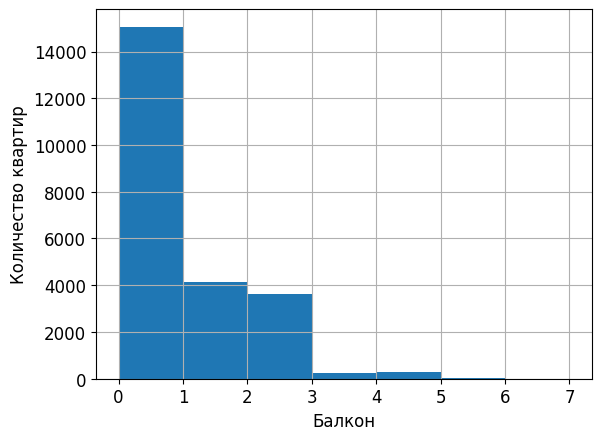

In [211]:
grafix(
    data.hist('balcony', bins=7, range=(0,7)),
    'Балкон'
)

In [212]:
# масштаб возможного бедствия
len(data[(data['rooms'] == 1) & (data['total_area'] >= 50)])

384

In [213]:
# посмотрим ради интереса на удивительные вещи
data[(data['rooms'] == 1) & (data['living_area'] >= 50)] \
    .sort_values(by='total_area', ascending=False).head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
21276,0,17122148,178.3,2017-02-10,1,2.6,3,95.1,1,False,False,False,41.6,1,санкт-петербург,60195.0,41294.0,0.0,NaN,0.0,NaN,4.0
13023,8,11000000,127.3,2018-09-09,1,3.1,5,55.5,4,False,False,False,14.8,0,санкт-петербург,20750.0,2045.0,2.0,284.0,3.0,175.0,4.0
1430,1,13605800,106.3,2017-10-23,1,3.1,10,60.5,3,False,False,False,19.2,0,санкт-петербург,25279.0,4073.0,0.0,NaN,0.0,NaN,400.0
10253,8,13800000,103.4,2017-07-10,1,3.7,2,58.0,1,False,False,False,14.0,0,санкт-петербург,24653.0,1501.0,0.0,NaN,3.0,192.0,91.0
1126,2,8300000,96.5,2017-12-06,1,2.6,10,50.4,6,False,False,False,20.6,0,поселок бугры,NaN,NaN,NaN,NaN,NaN,NaN,57.0


Всё! Ничего не знаю. Исправлять ничего не буду. Так и должно быть. Наверное. Применены электромагнитные силовые линии вместо несущих стен и т.п.

##### Расстояния до аэропорта, парков и прудов (airports_nearest, parks_nearest, ponds_nearest)

In [214]:
print('Квартир на расстояния от аэропорта < 5000 м.:', 
      data.query('airports_nearest < 5000')['airports_nearest'].count())
print('Квартир на расстоянии от парка < 5 м.:',
      data.query('parks_nearest < 5')['parks_nearest'].count())
print('Квартир на расстоянии от пруда < 10 м.:',
      data.query('ponds_nearest < 10')['ponds_nearest'].count())

Квартир на расстояния от аэропорта < 5000 м.: 1
Квартир на расстоянии от парка < 5 м.: 3
Квартир на расстоянии от пруда < 10 м.: 0


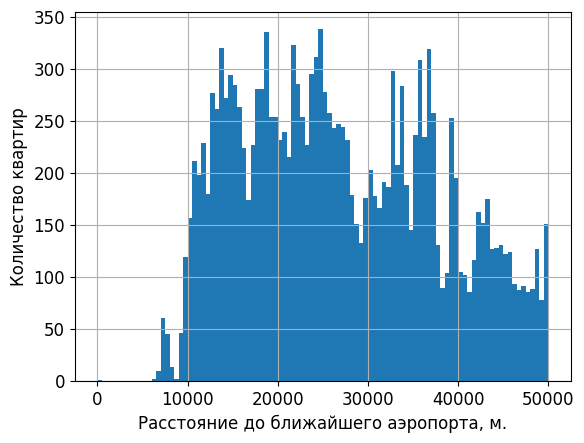

In [215]:
grafix(
    data.hist('airports_nearest', bins=100, range=(0, 50000)),
    'Расстояние до ближайшего аэропорта, м.'
)

In [216]:
# посмотрим на квартиру в аэропорту. Явная ошибка с расстоянием
data[data['airports_nearest'] < 5000]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
21085,0,7000000,34.7,2018-09-23,1,2.7,9,19.8,3,False,False,False,6.0,2,санкт-петербург,0.0,22801.0,0.0,NaN,0.0,NaN,60.0


In [217]:
# посмотрим аналоги
data.loc[(data['floors_total'] >= 9) &
         (data['parks_around3000'] >= 0) & (data['ceiling_height'] >= 2.7) &
         (data['cityCenters_nearest'] >= 22700) & (data['cityCenters_nearest'] <= 22900)] \
    .sort_values(by='cityCenters_nearest').head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
14283,7,3690000,36.0,2018-10-25,1,2.70,27,19.0,18,False,False,False,8.0,0,санкт-петербург,20998.0,22710.0,0.0,NaN,1.0,767.0,46.0
17789,11,4590000,33.3,2018-02-14,1,2.70,27,15.5,10,False,False,False,10.0,0,санкт-петербург,20998.0,22710.0,0.0,NaN,1.0,767.0,NaN
19034,20,4100000,32.0,2017-04-07,1,2.70,27,16.0,22,True,False,False,8.0,1,санкт-петербург,20998.0,22710.0,0.0,NaN,1.0,767.0,388.0
22810,18,4400000,33.1,2018-06-14,1,2.70,27,15.5,8,False,False,False,8.9,0,санкт-петербург,20998.0,22710.0,0.0,NaN,1.0,767.0,NaN
11205,13,5320000,55.0,2019-04-01,2,2.75,16,30.0,13,False,False,False,10.0,0,санкт-петербург,19359.0,22783.0,0.0,NaN,1.0,277.0,NaN
21085,0,7000000,34.7,2018-09-23,1,2.70,9,19.8,3,False,False,False,6.0,2,санкт-петербург,0.0,22801.0,0.0,NaN,0.0,NaN,60.0


In [218]:
# "аналоговнет". Удаляем.
data.drop(index=data.query('airports_nearest < 5000').index, inplace=True)

In [219]:
# смотрим парки
data[data['parks_nearest'] < 5]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
11949,7,4500000,44.0,2017-11-24,2,2.60,9,30.0,7,False,False,False,7.0,0,санкт-петербург,11806.0,12292.0,1.0,3.0,1.0,508.0,82.0
14624,8,3770000,45.4,2019-03-20,2,2.60,9,28.4,2,False,False,False,6.9,0,санкт-петербург,43932.0,16436.0,1.0,1.0,0.0,NaN,42.0
22941,8,10965000,69.3,2019-01-10,1,2.55,4,48.9,4,True,False,False,10.2,2,зеленогорск,73391.0,54490.0,3.0,4.0,1.0,217.0,110.0


In [220]:
# посмотрим аналоги для зеленогорска (73391.0; 54490.0). Оправдал название. Подправим на 10.
data.loc[
         (data['parks_around3000'] >= 1) &
         (data['airports_nearest'] >= 73000) & (data['airports_nearest'] <= 74000) &
         (data['cityCenters_nearest'] >= 54000) & (data['cityCenters_nearest'] <= 55000)] \
    .sort_values(by='cityCenters_nearest').head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
22855,16,2950000,31.0,2018-03-07,1,2.55,1,16.4,1,False,False,False,5.6,0,зеленогорск,73115.0,54214.0,3.0,188.0,1.0,269.0,328.0
22941,8,10965000,69.3,2019-01-10,1,2.55,4,48.9,4,True,False,False,10.2,2,зеленогорск,73391.0,54490.0,3.0,4.0,1.0,217.0,110.0


In [221]:
# посмотрим аналоги для СПб (43932.0; 16436.0). Тоже возможно, но скромнее надо быть.
data.loc[
         (data['parks_around3000'] >= 1) &
         (data['airports_nearest'] >= 43800) & (data['airports_nearest'] <= 44100) &
         (data['cityCenters_nearest'] >= 16300) & (data['cityCenters_nearest'] <= 16600)] \
    .sort_values(by='cityCenters_nearest').head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
18353,3,4200000,49.0,2018-01-18,2,2.5,9,30.0,5,False,False,False,7.0,0,санкт-петербург,43878.0,16381.0,2.0,19.0,0.0,NaN,54.0
14624,8,3770000,45.4,2019-03-20,2,2.6,9,28.4,2,False,False,False,6.9,0,санкт-петербург,43932.0,16436.0,1.0,1.0,0.0,NaN,42.0


In [222]:
# Подправим оба на 5
data.loc[[22941, 14624], 'parks_nearest'] = 5

In [223]:
# посмотрим аналоги для СПб (11806.0; 12292.0). Похоже на опечатку.
data.loc[
         (data['parks_around3000'] >= 1) &
         (data['airports_nearest'] >= 11700) & (data['airports_nearest'] <= 11900) &
         (data['cityCenters_nearest'] >= 12200) & (data['cityCenters_nearest'] <= 12400)] \
    .sort_values(by='cityCenters_nearest').head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
22658,9,3400000,32.0,2017-07-31,1,2.6,9,18.0,8,False,False,False,6.5,0,санкт-петербург,11781.0,12268.0,1.0,301.0,1.0,63.0,164.0
11949,7,4500000,44.0,2017-11-24,2,2.6,9,30.0,7,False,False,False,7.0,0,санкт-петербург,11806.0,12292.0,1.0,3.0,1.0,508.0,82.0
8443,9,3750000,49.0,2017-08-21,4,2.5,5,37.1,5,False,False,False,5.3,0,санкт-петербург,11900.0,12386.0,1.0,223.0,1.0,71.0,30.0


In [224]:
# Исправим на 300
data.loc[11949, 'parks_nearest'] = 300

In [225]:
print('Квартир на расстояния от аэропорта < 5000 м.:', 
      data.query('airports_nearest < 5000')['airports_nearest'].count())
print('Квартир на расстоянии от парка < 5 м.:',
      data.query('parks_nearest < 5')['parks_nearest'].count())
print('Квартир на расстоянии от пруда < 10 м.:',
      data.query('ponds_nearest < 10')['ponds_nearest'].count())

Квартир на расстояния от аэропорта < 5000 м.: 0
Квартир на расстоянии от парка < 5 м.: 0
Квартир на расстоянии от пруда < 10 м.: 0


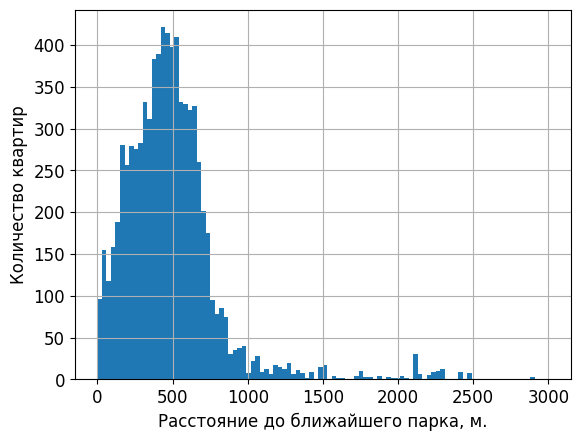

In [226]:
grafix(
    data.hist('parks_nearest', bins=100, range=(0, 3000)),
    'Расстояние до ближайшего парка, м.'
)

##### Дней размещения объявления (days_exposition)

In [227]:
print('Дней размещения = 0: ', data.query('days_exposition == 0')['days_exposition'].count())
print('Объявлению размещено > 3 лет : ', data.query('days_exposition > 3*365')['days_exposition'].count())

Дней размещения = 0:  0
Объявлению размещено > 3 лет :  165


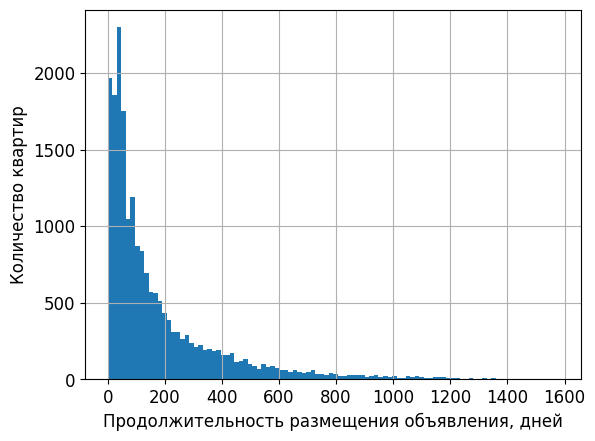

In [228]:
grafix(
    data.hist('days_exposition', bins=100),
    'Продолжительность размещения объявления, дней'
)

##### Вывод:

In [229]:
# распределение значений данных
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23344.000000,2.334400e+04,23344.000000,23344.000000,23344.000000,23344.000000,23344.000000,23344.000000,23344.000000,23344.000000,17877.000000,17897.000000,17898.000000,7947.000000,17898.000000,8925.000000,20218.000000
mean,9.860178,6.223421e+06,59.314749,2.064599,2.688620,10.633396,34.058680,5.868232,10.388542,0.568626,28854.356548,14248.354585,0.609174,491.249402,0.761761,520.447283,180.642546
std,5.679127,7.346609e+06,29.849111,1.010899,0.210517,6.512717,19.428172,4.851117,5.203484,0.881344,12659.499880,8614.238767,0.799479,342.690464,0.931352,277.325916,219.247593
min,0.000000,1.219000e+04,13.000000,0.000000,2.400000,1.000000,7.400000,1.000000,2.000000,0.000000,6450.000000,181.000000,0.000000,5.000000,0.000000,13.000000,1.000000
25%,6.000000,3.440000e+06,40.000000,1.000000,2.550000,5.000000,19.000000,2.000000,7.000000,0.000000,18551.000000,9350.000000,0.000000,288.000000,0.000000,297.000000,45.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.600000,9.000000,30.000000,4.000000,9.000000,0.000000,26832.000000,13123.000000,0.000000,455.000000,0.000000,503.000000,95.500000
75%,14.000000,6.700000e+06,69.200000,3.000000,2.700000,16.000000,42.100000,8.000000,12.000000,1.000000,37364.000000,16296.000000,1.000000,612.500000,1.000000,733.000000,231.000000
max,50.000000,3.300000e+08,380.000000,7.000000,4.000000,29.000000,200.000000,27.000000,50.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


In [230]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23344 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          23344 non-null  int8          
 1   last_price            23344 non-null  int64         
 2   total_area            23344 non-null  float64       
 3   first_day_exposition  23344 non-null  datetime64[ns]
 4   rooms                 23344 non-null  int8          
 5   ceiling_height        23344 non-null  float64       
 6   floors_total          23344 non-null  int8          
 7   living_area           23344 non-null  float64       
 8   floor                 23344 non-null  int8          
 9   is_apartment          23344 non-null  bool          
 10  studio                23344 non-null  bool          
 11  open_plan             23344 non-null  bool          
 12  kitchen_area          23344 non-null  float64       
 13  balcony         

Возможные аномалии и ошибки:

1. total_images-- аномалии и ошибки не найдены.
2. last_price---- найдена ошибка, аномалии не найдены, если не считать проявления капитализма аномалией.
    - квартира стоимостью 12190 - убрана.
    - квартира стоимостью > 700 млн. - квартира олигарха.
3. total_area---- аномалии и ошибки не найдены.
    - квартира площадью 12 кв.м. - студия или открытая планировка.
    - квартира 900 метров - квартира олигарха.
4. rooms--------- аномалии и ошибки не найдены.
    - нулевое значение - студии. 
    - 19 комнат - олигарх.
    - и самое интересное. В "однушках" ошибочно есть и бОльшие квартиры.
5. ceiling_height- найдены ошибки.
    - исправлены ошибки в высоте потолка: опечатки, польностью неправильные значения.
    - значения высот квартир с мансардами оставлены. 
6. floors_total--- ошибки.
    - 60-этажка в Кронштадте - ошибка исправлена. А 35-этажки в СПб - реальность.
7. living_area---- найдены ошибки.
    - исправлены отрицательные значения, опечатки, перепутанные с площадью кухни значения. 
    - площадь 511 метров - олигарх.
8. floor---------- аномалии и ошибки не найдены.
    - есть 33-й этаж в продаже, т.к. есть 35-этажка. 
9. kitchen_area--- аномалии и ошибки не найдены.
    - нулевое значение - студии и некоторые открытые планировки.
    - 115 метров - олигарх.
10. balcony------- аномалии и ошибки найдены.
    - странная ситуация с балконами. Увеличено значение более сотни балконов. Подправил как смог.
11. airports_nearest- найдена ошибка.
    - 0 метров до аэропорта. Убрана.
12. cityCenters_nearest- аномалии и ошибки не найдены.
13. parks_around3000---- аномалии и ошибки не найдены.
14. parks_nearest------- найдена ошибка.
    - 1 и 4 метра до парка подправлены на 10. 3 метра исправлено на 300.
15. ponds_around3000---- аномалии и ошибки не найдены.
16. ponds_nearest------- аномалии и ошибки не найдены.
    - 13 метров до пруда - возможно.
17. days_exposition----- аномалии и ошибки не найдены..
    - 0 дней - выставленные в день выгрузки данных.
    - более 2*365 дней - это объявления о продаже дорогих квартир.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__
    
Второй раздел сделан хорошо. Проверены основные возможные проблемы в данных.

### Посчитайте и добавьте в таблицу новые столбцы

In [231]:
#цена одного квадратного метра
data['price_per_sqm'] = round(data['last_price'] / data['total_area'])
data['price_per_sqm'] = change_type(data['price_per_sqm'], 'int64')

print()

# Периодические данные: день и месяц
# день публикации объявления (0 - понедельник, 1 - вторник и т.д.)
data['dayOfWeek'] = data['first_day_exposition'].dt.dayofweek
data['dayOfWeek'] = change_type(data['dayOfWeek'], 'int8')

# месяц публикации объявления
data['month'] = data['first_day_exposition'].dt.month
data['month'] = change_type(data['month'], 'int8')
  
# год публикации объявления
data['year'] = data['first_day_exposition'].dt.year
data['year'] = change_type(data['year'], 'int16')  

print()

# Непериодические данные: день, месяц, год
# день публикации объявления
data['dayOfWeek2'] = data['first_day_exposition'].dt.date
data['dayOfWeek2'] = change_type(data['dayOfWeek2'], 'datetime64[D]')

# месяц публикации объявления
data['month2'] = data['first_day_exposition'].dt.date
data['month2'] = change_type(data['month2'], 'datetime64[M]')
  
# год публикации объявления
data['year2'] = data['first_day_exposition'].dt.date
data['year2'] = change_type(data['year2'], 'datetime64[Y]')  

OK - price_per_sqm 23344 <class 'numpy.int64'>

OK - dayOfWeek 23344 <class 'numpy.int8'>
OK - month 23344 <class 'numpy.int8'>
OK - year 23344 <class 'numpy.int16'>

OK - dayOfWeek2 23344 <class 'numpy.datetime64'>
OK - month2 23344 <class 'numpy.datetime64'>
OK - year2 23344 <class 'numpy.datetime64'>


<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__

Совет на будущие работы (в этом проекте этот метод не нужен): обычно в датафреймах содержатся данные за несколько лет. Важно выбрать корректный метод для вычленения месяца, иначе месяца разных годов могут стать одним месяцем. Обрати внимание на метод astype('datetime64[M]'). Для его использования не нужно обращаться к pd.DatetimeIndex. 
    
Вот хорошая статья на этот счёт: 
    
    https://runebook.dev/ru/docs/numpy/reference/arrays.datetime
    
    и
    
    https://stackoverflow.com/questions/70901855/get-hour-and-minutes-and-seconds-from-numpy-datetime64
</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Этот метод нужен для визуализации динамики по неделям, месяцам или годам (смотря какой метод выберешь)
    
Код выглядит так:
    
        df['first_day_exposition'].dt.date #приводим к временному формату
        df['first_day_exposition'].astype('datetime64[M]') 
    
Если года разные, то в новой колонке месяца у тебя отобразится первый день месяца ('2019-05-01')
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Применил.</div>

In [232]:
# тип этажа квартиры (значения: «первый», «последний», «другой»)
data['floor_category'] = data.apply(
    lambda row: 'первый' if (row.floor == 1) 
    else ('последний' if (row.floor == row.floors_total) & isinstance(row.floors_total, int) 
    else ('другой' ) ),
    axis=1
)
data['floor_category'].value_counts()

другой       17143
последний     3314
первый        2887
Name: floor_category, dtype: int64

In [233]:
# тип этажа квартиры числовой (значения: 0 (первый), 2 (последний), 1 (другой))
data['floor_category_id'] = data.apply(
    lambda row: 0 if (row.floor == 1) 
    else (2 if (row.floor == row.floors_total) & isinstance(row.floors_total, int) 
    else (1 ) ),
    axis=1
)
data['floor_category_id'] = change_type(data['floor_category_id'], 'int8')
data['floor_category_id'].value_counts()

OK - floor_category_id 23344 <class 'numpy.int8'>


1    17143
2     3314
0     2887
Name: floor_category_id, dtype: int64

In [234]:
# расстояние в км до центра города
data['cityCenters_nearest_km'] = round(data['cityCenters_nearest'] / 1000)
data['cityCenters_nearest_km'] =  change_type(data['cityCenters_nearest_km'], 'int16')

#data['cityCenters_nearest_km'].value_counts()

FAIL - cityCenters_nearest_km 23344 <class 'numpy.float64'>


In [235]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23344 entries, 0 to 23698
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   total_images            23344 non-null  int8          
 1   last_price              23344 non-null  int64         
 2   total_area              23344 non-null  float64       
 3   first_day_exposition    23344 non-null  datetime64[ns]
 4   rooms                   23344 non-null  int8          
 5   ceiling_height          23344 non-null  float64       
 6   floors_total            23344 non-null  int8          
 7   living_area             23344 non-null  float64       
 8   floor                   23344 non-null  int8          
 9   is_apartment            23344 non-null  bool          
 10  studio                  23344 non-null  bool          
 11  open_plan               23344 non-null  bool          
 12  kitchen_area            23344 non-null  float6

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Этот раздел выполнен качественно
</div>

### Проведите исследовательский анализ данных

#### Изучение параметров объектов недвижимости

In [236]:
# распределение значений данных
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_per_sqm,dayOfWeek,month,year,floor_category_id,cityCenters_nearest_km
count,23344.000000,2.334400e+04,23344.000000,23344.000000,23344.000000,23344.000000,23344.000000,23344.000000,23344.000000,23344.000000,17877.000000,17897.000000,17898.000000,7947.000000,17898.000000,8925.000000,20218.000000,2.334400e+04,23344.000000,23344.000000,23344.000000,23344.000000,17897.000000
mean,9.860178,6.223421e+06,59.314749,2.064599,2.688620,10.633396,34.058680,5.868232,10.388542,0.568626,28854.356548,14248.354585,0.609174,491.249402,0.761761,520.447283,180.642546,9.855221e+04,2.569268,6.399203,2017.367418,1.018292,14.242834
std,5.679127,7.346609e+06,29.849111,1.010899,0.210517,6.512717,19.428172,4.851117,5.203484,0.881344,12659.499880,8614.238767,0.799479,342.690464,0.931352,277.325916,219.247593,4.648052e+04,1.789673,3.491539,1.039956,0.515085,8.622680
min,0.000000,1.219000e+04,13.000000,0.000000,2.400000,1.000000,7.400000,1.000000,2.000000,0.000000,6450.000000,181.000000,0.000000,5.000000,0.000000,13.000000,1.000000,1.120000e+02,0.000000,1.000000,2014.000000,0.000000,0.000000
25%,6.000000,3.440000e+06,40.000000,1.000000,2.550000,5.000000,19.000000,2.000000,7.000000,0.000000,18551.000000,9350.000000,0.000000,288.000000,0.000000,297.000000,45.000000,7.638600e+04,1.000000,3.000000,2017.000000,1.000000,9.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.600000,9.000000,30.000000,4.000000,9.000000,0.000000,26832.000000,13123.000000,0.000000,455.000000,0.000000,503.000000,95.500000,9.473700e+04,3.000000,6.000000,2017.000000,1.000000,13.000000
75%,14.000000,6.700000e+06,69.200000,3.000000,2.700000,16.000000,42.100000,8.000000,12.000000,1.000000,37364.000000,16296.000000,1.000000,612.500000,1.000000,733.000000,231.000000,1.138510e+05,4.000000,10.000000,2018.000000,1.000000,16.000000
max,50.000000,3.300000e+08,380.000000,7.000000,4.000000,29.000000,200.000000,27.000000,50.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000,1.736842e+06,6.000000,12.000000,2019.000000,2.000000,66.000000


Строим гистрограммы в соответствии с заданием

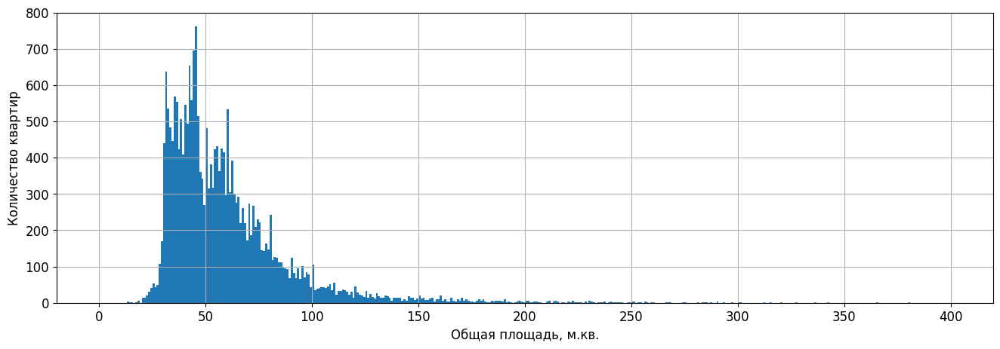

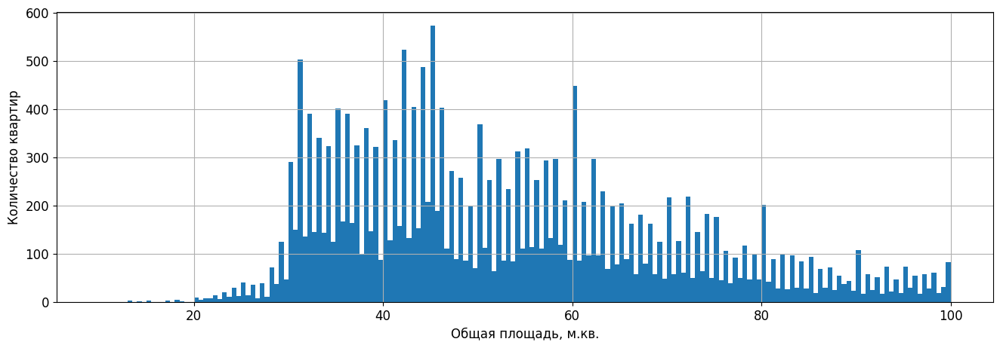

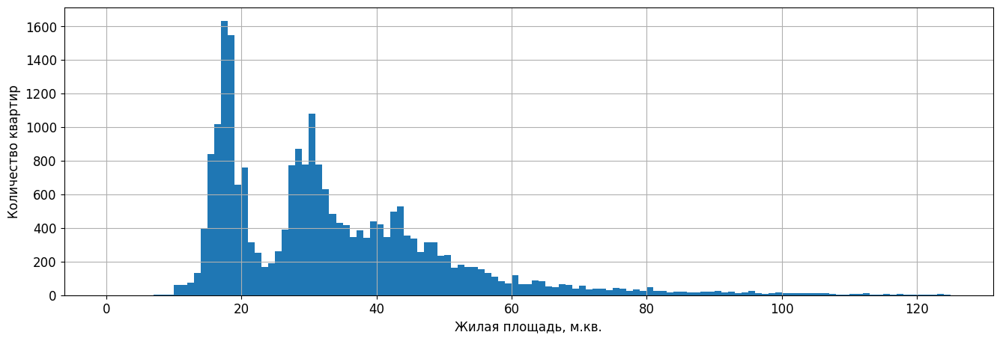

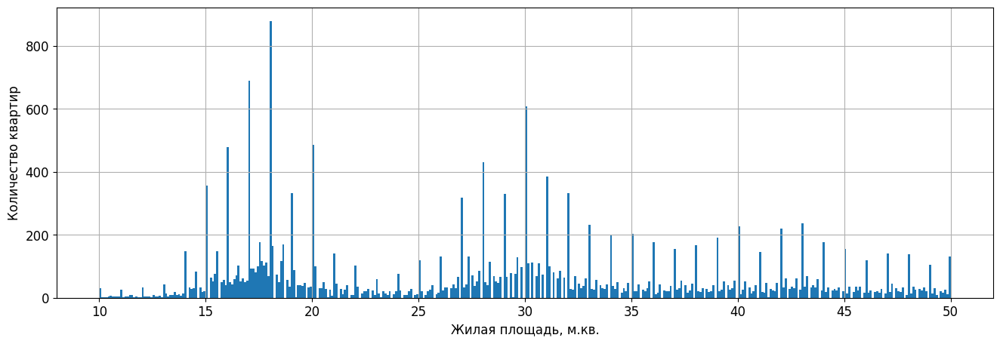

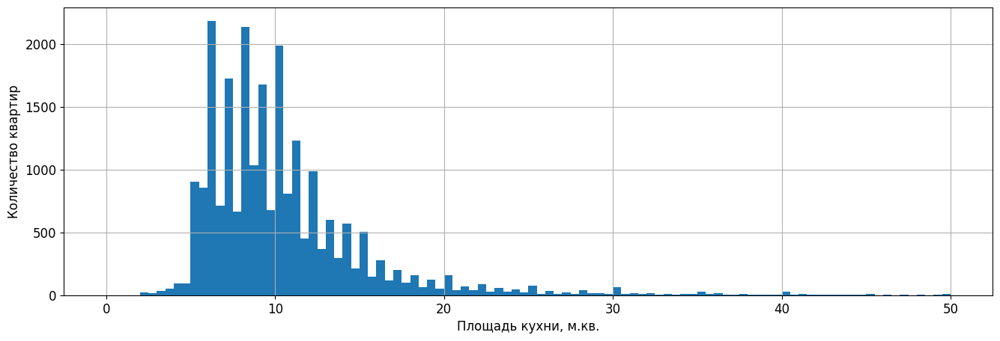

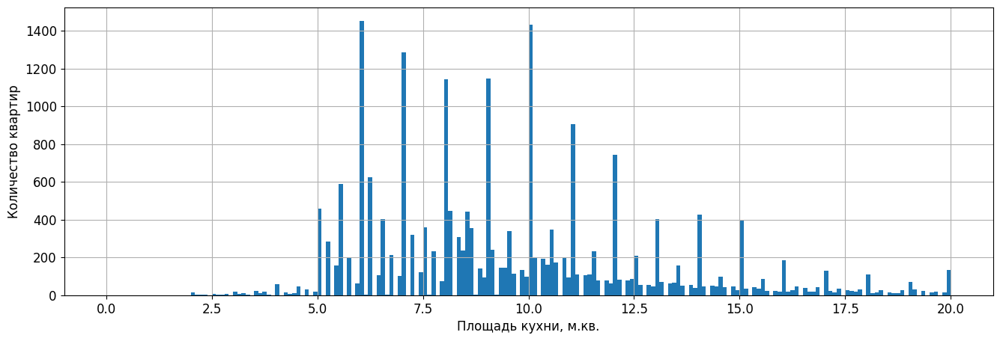

In [237]:
grafix(data.hist('total_area', bins=400, range=(0,400), figsize=(16,5)), 'Общая площадь, м.кв.')
grafix(data.hist('total_area', bins=180, range=(10,100), figsize=(16,5)), 'Общая площадь, м.кв.')

grafix(data.hist('living_area', bins=125, range=(0,125), figsize=(16,5)), 'Жилая площадь, м.кв.')
grafix(data.hist('living_area', bins=400, range=(10,50), figsize=(16,5)), 'Жилая площадь, м.кв.')

grafix(data.hist('kitchen_area', bins=100, range=(0,50), figsize=(16,5)), 'Площадь кухни, м.кв.')
grafix(data.hist('kitchen_area', bins=200, range=(0,20), figsize=(16,5)), 'Площадь кухни, м.кв.')

1. Общая площадь:
    - похоже на распределение Пуассона. Пики: 30, 45, 60, 80. Значение 110 с небольшим метров отделяет массовые квартиры от более дорогих и, соответственно, редких. Олигархические квартиры, которые можно мерять огородными сотками отсеяли ранее из-за ещё большей редкости и бесполезности в текущем исследовании.
2. Жилая площадь:
    - два пика - на 18 кв.м. и на 30 кв.м. И провал на 24 кв.м. Цель для отдельно исследования. Но скорее всего оказало влияние советское массовое строительство с установленными метражами 1- и 2-комнатных квартир.
3. Площадь кухни:
    - похоже на распределение Пуассона. Пики: на 6, 7 и 10 м.кв. Везде следы прошлой цивилизации.

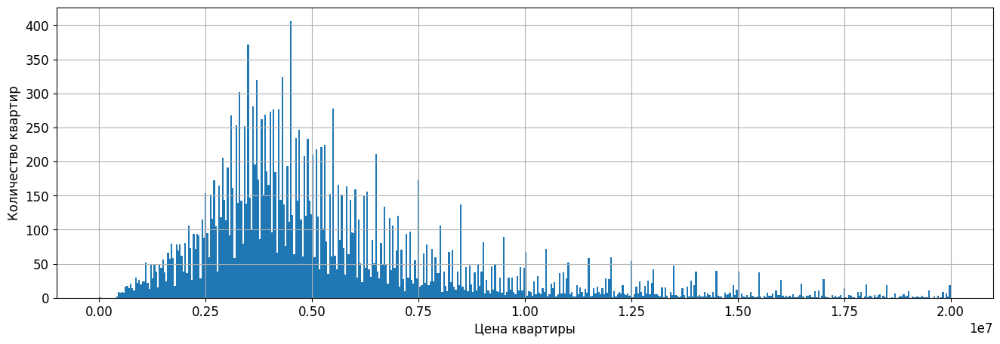

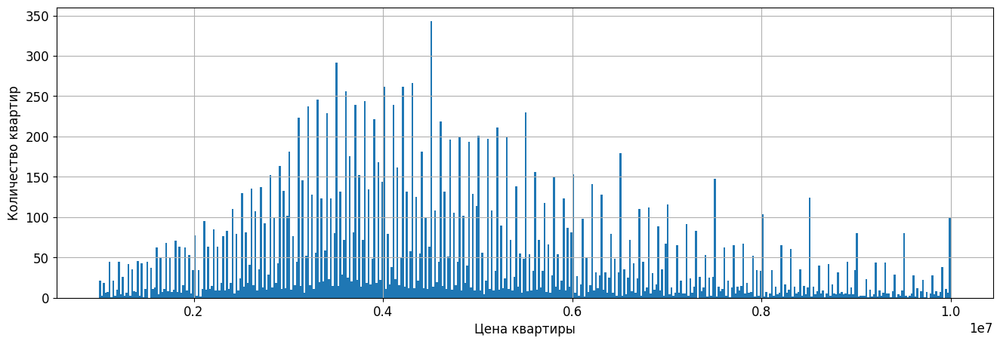

In [238]:
#grafix(data.hist('last_price', bins=100, figsize=(16,5)), 'Цена квартиры')
grafix(data.hist('last_price', bins=500, range=(0, 2e+07), figsize=(16, 5)), 'Цена квартиры')
grafix(data.hist('last_price', bins=450, range=(1e+06, 10e+06), figsize=(16, 5)), 'Цена квартиры')

4. Цена объекта:
    - также похоже на распределение Пуассона, при этом затянутое. Пик на 4,5 млн. Начиная с 3 млн. максимальные значения с шагом по 0,5 млн.Нужно учитывать, что данные собраны за 4,5 года, а денежная мера (рубль) каждый год "дешевеет" примерно на 10%. Для 2014 года условный рубль примерно соответствует в 2019 - 1*1,1*1,1*1,1*1,1*1,1 = 1,61 рубля. На постоянные выбросы влияет спекулятивная составляющая рынка продаж недвижимости, стройматериалов и т.д. 

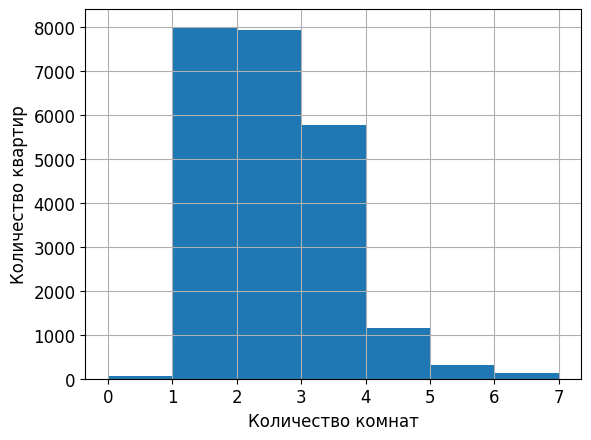

In [239]:
grafix(data.hist('rooms', bins=data['rooms'].max()), 'Количество комнат')

5) Количество комнат:
    - "ноздря в ноздрю" идут 1- и 2-комнатные с небольшим преимуществом первых. На четверть меньше "трёшек", 4-комнатных в несколька раз меньше. Остальных ещё меньше. В принципе хоть и грубое, но распределине Пуассона.

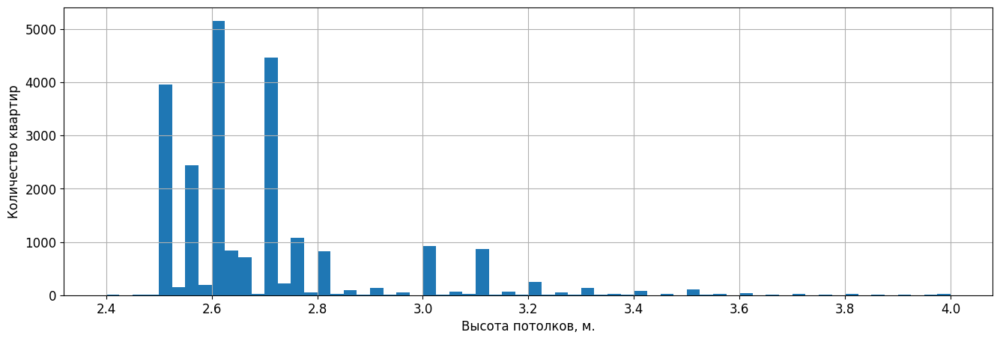

In [240]:
grafix(data.hist('ceiling_height', bins=64, range=(2.4, 4), figsize=(16, 5)), 'Высота потолков, м.')

6. Высота потолков:
    - распределение Пуассона. Три пика - 2.5, 2.6, 2.7 метра. Пики - в основном результат советского задела по "брежневкам", "хрущёвкам" и позднесоветским сериям.

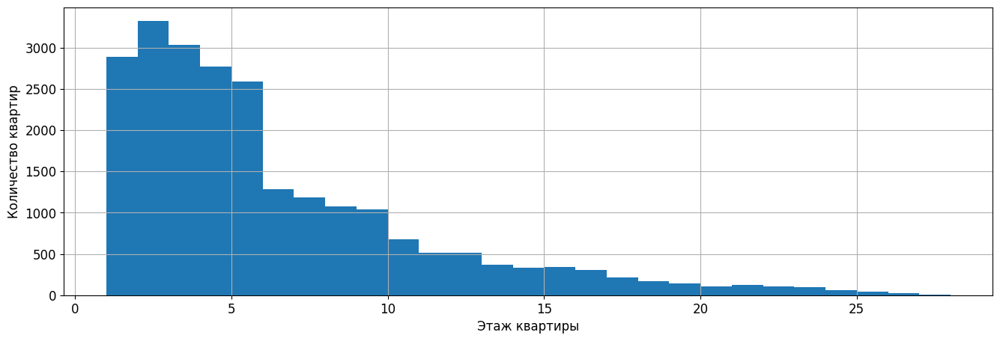

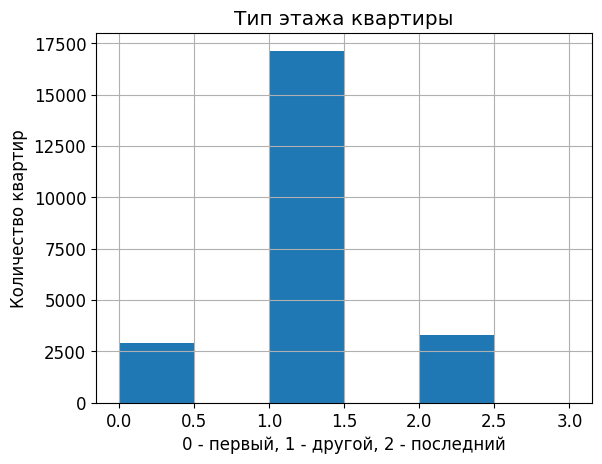

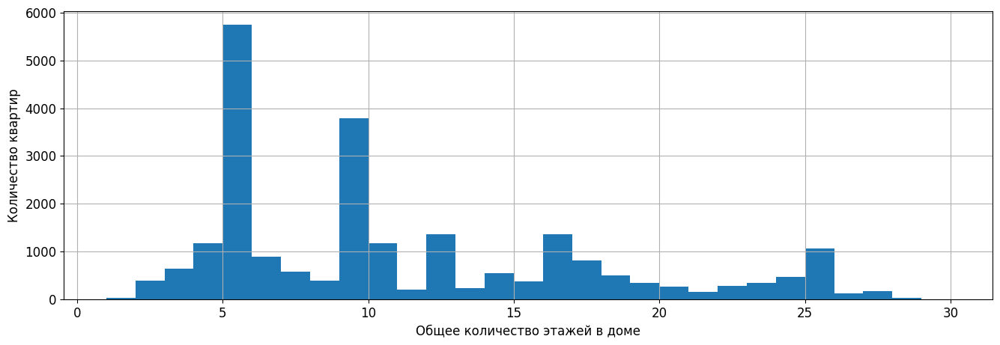

In [241]:
grafix(
    data.hist('floor', bins=data['floor'].max(), range=(1, data['floor'].max()+1), figsize=(16, 5)),
    'Этаж квартиры'
)
grafix(
    data.hist('floor_category_id', bins=6, range=(0, 3)),
    '0 - первый, 1 - другой, 2 - последний',
    title='Тип этажа квартиры'
)
grafix(
    data.hist('floors_total',
              bins=data['floors_total'].max(),
              range=(1, data['floors_total'].max()+1),
              figsize=(16,5)),
    'Общее количество этажей в доме'
)

7. Этаж квартиры:
    - с 1 по 5 этаж абсолютное большинство. Пятиэтажки рулят. Пик на 2 этаже. Потом всё по убыванию, но заметная девяточка (снова привет прошлому). 10- и 11-этажи идут парой.
8. Тип этажа квартиры («первый», «последний», «другой»):
    - значительное (в 6-7 раз) превышение "других" над "первыми" и "последними". Если в большинстве домов мегаполиса СПб больше трёх этажей, то это закономерность. "Последних" чуть больше, чем "первых". Правильно - надо быть ближе к земле и поменьше "крутить-вертеть" квартирами.
9. Общее количество этажей в доме:
    - 5-этажки, 9-этажки (от предыдущей цивилизации) - преобладают. Остальные дома равномерно распределены в диапазоне от 10 до 25 этажей, но есть приличный локальный подъём с 21- до 25-этажек. Новый тренд в "человейники".

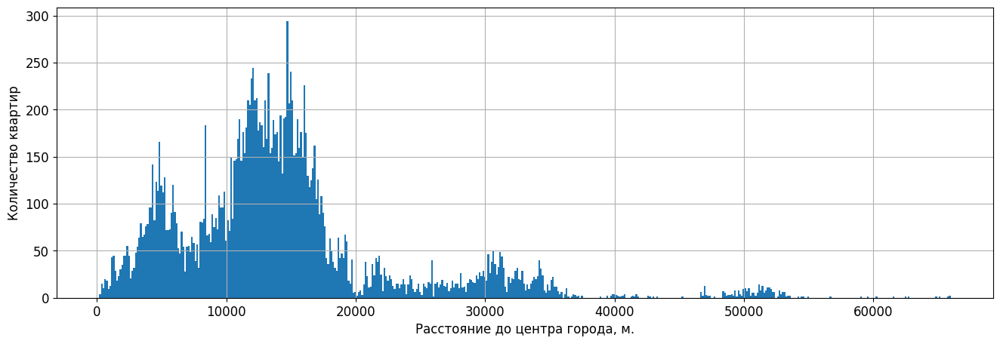

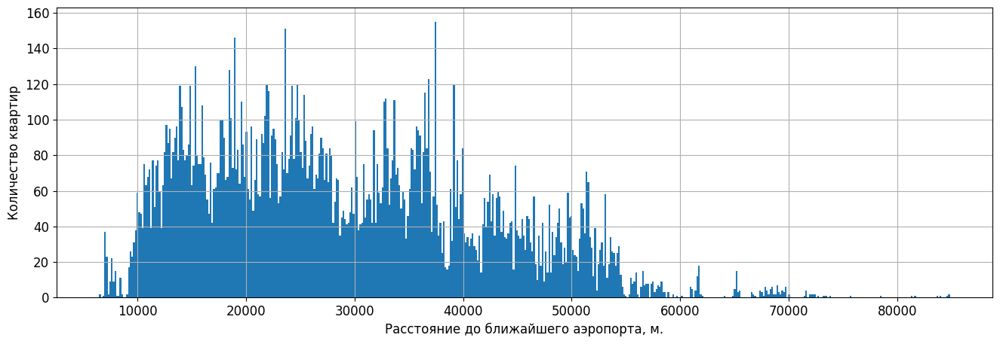

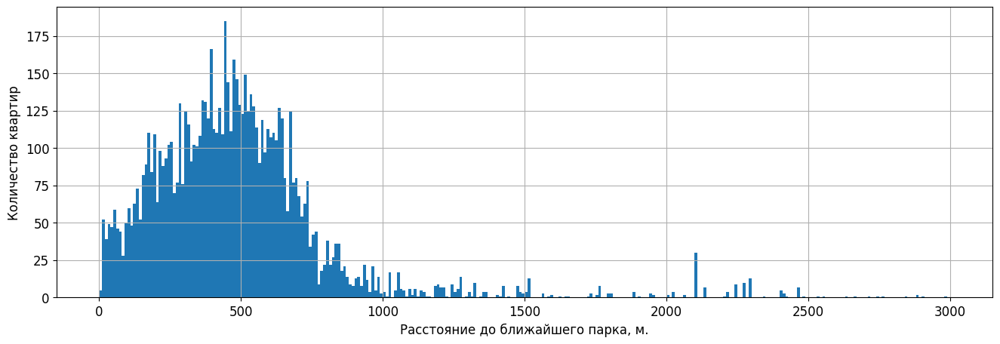

In [242]:
grafix(data.hist('cityCenters_nearest', bins=500, figsize=(16,5)), 'Расстояние до центра города, м.')
grafix(data.hist('airports_nearest', bins=500, figsize=(16,5)), 'Расстояние до ближайшего аэропорта, м.')
grafix(data.hist('parks_nearest', bins=300, range=(0, 3000), figsize=(16,5)),
       'Расстояние до ближайшего парка, м.')

10. Расстояние до центра города в метрах:
    - "пуассон" волнами. Пики на увеличение: 5, 12, 15 км.; на снижение: 22, 31, 34, 52 км. Какие-то факторы техногенного и природного характера влияют на застройку: заводы, промзоны, резиденции, заповедники, реки, водоёмы и т.п.
11. Расстояние до ближайшего аэропорта:
    - "пуассон" с большим числом всплексков. Скорее всего из-за факторов аналогичных "центру" и большого количества неточностей. Это не до центра города расстояние указывать. Проверять особо не будут.
12. Расстояние до ближайшего парка:
    - "пуассон". Пик на 450 метров. Это недалеко. Для тех у кого есть такая возможность, а таких немного (от общего количества). Любопытный локальный пик на 2,1 км.

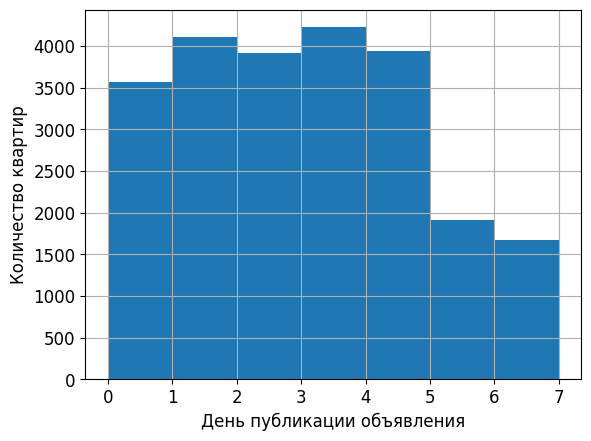

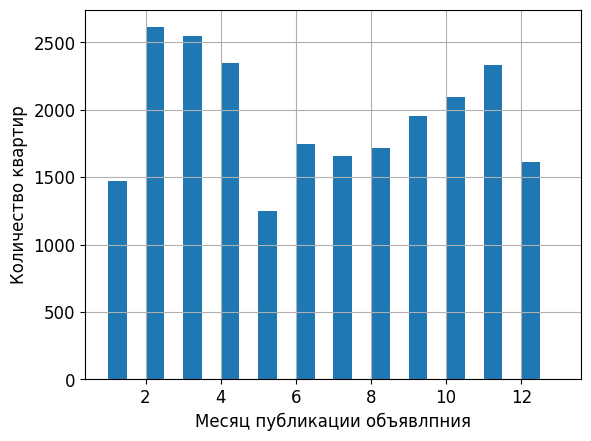

In [243]:
grafix(data.hist('dayOfWeek', bins=7, range=(0, 7)), 'День публикации объявления')
grafix(data.hist('month', bins=24, range=(1, 13)), 'Месяц публикации объявлпния')

13. День и месяц публикации объявления:
    - Дни: в будни (в понедельник чуть ниже) объявлений больше в два раза по сравнению с выходными (четверг, вторник - самые ударные).
    - Месяцы: низы - декабрь+январь, май. Летние месяцы - плато. С февраля по апрель и сентября по ноябрь - подъёмы. Влияющие факторы: конец года, январские и майские праздники, лето.

14. На всех графиках преобладают целые числа.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Здорово, что зависимость переменных рассматриваешь через тип графика scatter
</div>

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__


Лучше после каждого раздела, графика (или серии тестов) писать вывод по полученным данным с учетом поставленной бизнес задачи - так проще читать проект, поскольку будущим коллегам или заказчику не надо будет самим интерпретировать результаты каждого раздела, теста или графика.  
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b>
    Разделил вывод на части.
</div>

#### Изучение быстроты продаж

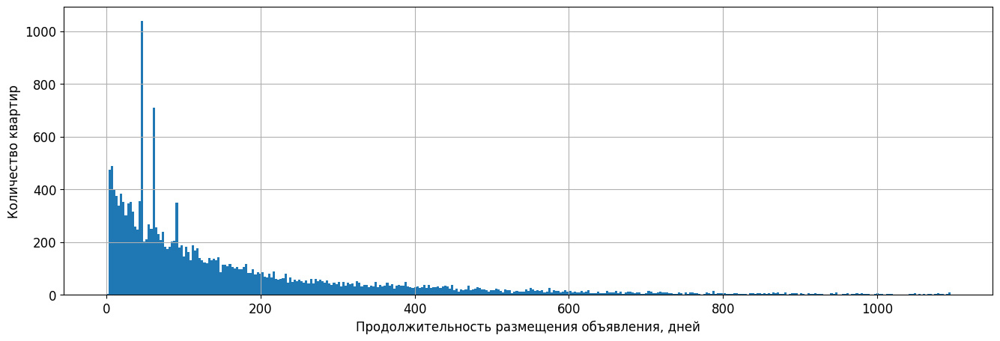

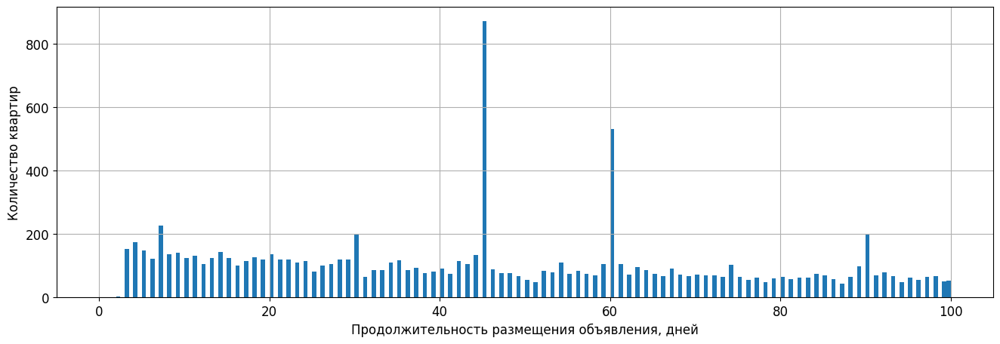

In [244]:
# Смотрим гистограммы на 3 года и 100 дней.
grafix(
    data.hist('days_exposition', bins=365, range=(0, 1095), figsize=(16,5)),
    'Продолжительность размещения объявления, дней'
)
grafix(
    data.hist('days_exposition', bins=200, range = (0,100), figsize=(16,5)),
    'Продолжительность размещения объявления, дней'
)

In [245]:
print('Среднее время продажи квартиры в днях:', int(data['days_exposition'].mean()))
print('Медианное время продажи квартиры в днях:', int(data['days_exposition'].median()))
print('Q1(25%) времени продажи квартиры в днях:', int(data['days_exposition'].quantile(0.25)))
print('Q3(75%) времени продажи квартиры в днях:', int(data['days_exposition'].quantile(0.75)))
print('\n==Выбросы==')
print(' Количество объявлений, которые сняты через:')
print('  - 7  дней:', data[data['days_exposition'] == 7]['days_exposition'].count())
print('  - 30 дней:', data[data['days_exposition'] == 30]['days_exposition'].count())
print('  - 45 дней:', data[data['days_exposition'] == 45]['days_exposition'].count())
print('  - 60 дней:', data[data['days_exposition'] == 60]['days_exposition'].count())
print('  - 90 дней:', data[data['days_exposition'] == 90]['days_exposition'].count())

Среднее время продажи квартиры в днях: 180
Медианное время продажи квартиры в днях: 95
Q1(25%) времени продажи квартиры в днях: 45
Q3(75%) времени продажи квартиры в днях: 231

==Выбросы==
 Количество объявлений, которые сняты через:
  - 7  дней: 228
  - 30 дней: 202
  - 45 дней: 873
  - 60 дней: 532
  - 90 дней: 200


In [246]:
# создание столбца last_day_exposition
def create_day_expired(row):
    if not pd.isnull(row['days_exposition']):
        result = pd.to_datetime(row['first_day_exposition']) + pd.Timedelta(days=row['days_exposition'])
    else:
        result = row['days_exposition']
    
    return result 

In [247]:
# дата закрытия объявления
data['last_day_exposition'] = data.apply(create_day_expired, axis=1)

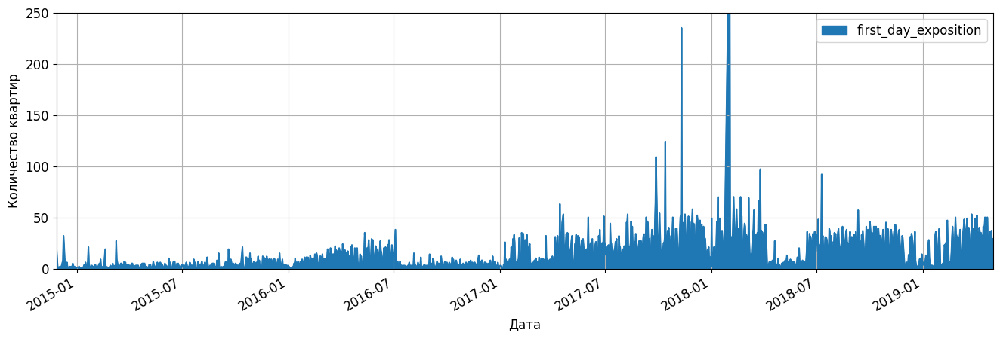

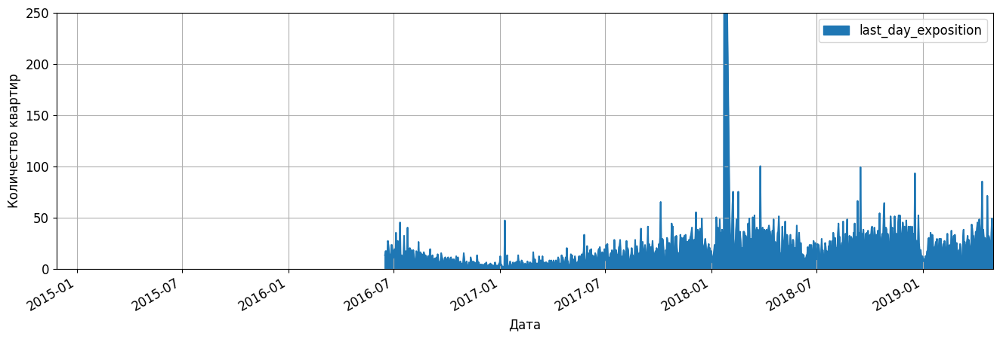

In [248]:
# посмотрим на массовость открытия и закрытия объявлений
data.groupby(by='first_day_exposition')[['first_day_exposition']].count() \
    .plot(kind='area',
          xlabel='Дата',
          ylabel='Количество квартир',
          figsize=(16,5),
          xlim=('2014-11-27', '2019-05-02'),
          ylim=(0, 250),
          grid=True)
data.groupby(by='last_day_exposition')[['last_day_exposition']].count() \
    .plot(kind='area',
          xlabel='Дата',
          ylabel='Количество квартир',
          figsize=(16,5),
          xlim=('2014-11-27', '2019-05-02'),
          ylim=(0, 250),
          grid=True
);

In [249]:
# Мощнейшая операция перерегистрации объявлений:
# 2018-01-23 - начало снятия объявлений;
# 2018-02-01 - начало выставления объявлений. 
print('2018-01-23 закрыто объявлений:',
      data[data['last_day_exposition'] == '2018-01-23']['last_day_exposition'].count())
print('2018-02-01 выставлено объявлений:',
      data[data['first_day_exposition'] == '2018-02-01']['first_day_exposition'].count())

2018-01-23 закрыто объявлений: 488
2018-02-01 выставлено объявлений: 365


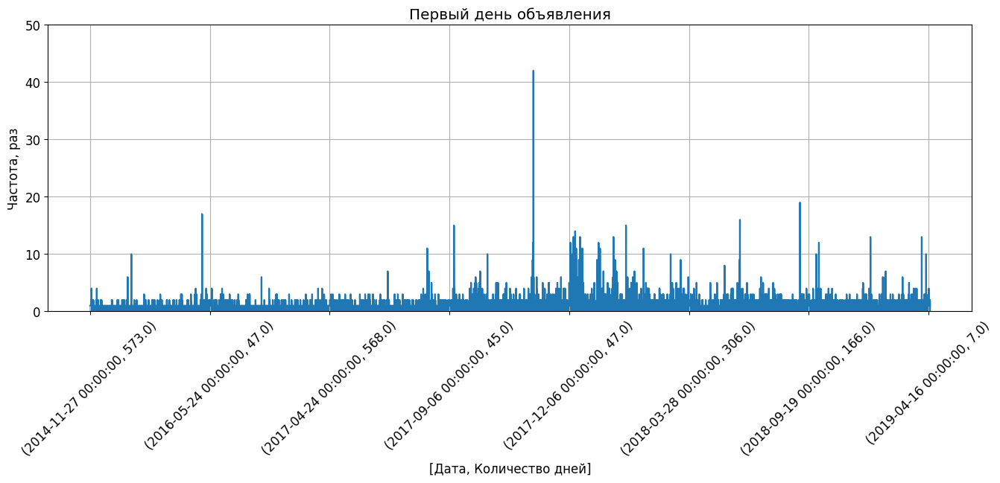

In [250]:
# Посмотрим внимательно на "крупных рыбин" с "невидимыми руками".
# последний пик не в счёт - мешает принудительное закрытие 13% объявлений.
data.groupby(by=['first_day_exposition', 'days_exposition'])['days_exposition'].count() \
    .plot(kind='area',
          xlabel='[Дата, Количество дней]',
          ylabel='Частота, раз',
          figsize=(16,5),
          #xlim=('2015', '2019'),
          #xticks=(100, 100),
          ylim=(0, 50),
          rot=45,
          title='Первый день объявления',
          grid=True);

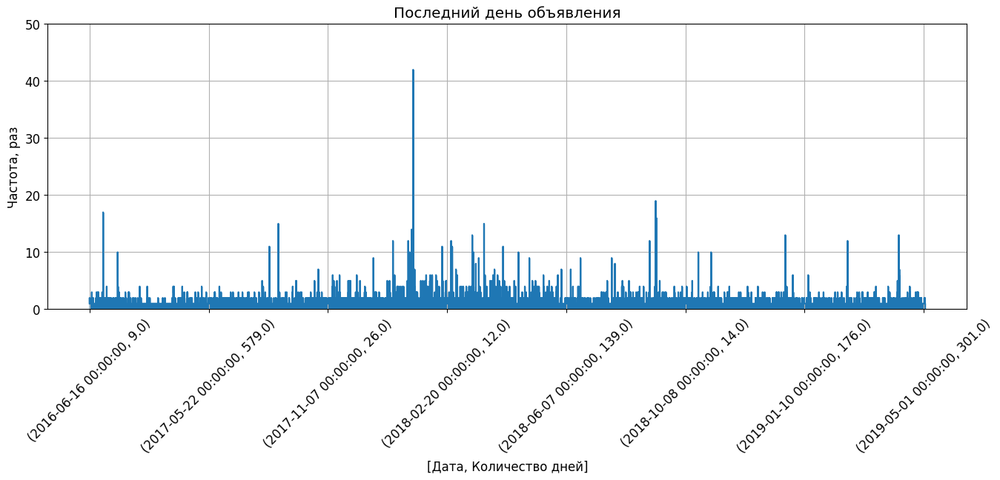

In [251]:
data.groupby(by=['last_day_exposition', 'days_exposition'])['days_exposition'].count() \
    .plot(kind='area',
          xlabel='[Дата, Количество дней]',
          ylabel='Частота, раз',
          figsize=(16,5),
          #xlim=('2014-11-27', '0'),
          #xticks=(0, 1),
          ylim=(0, 50),
          rot=45,
          title='Последний день объявления',
          grid=True);

In [252]:
# смотрим пары "открыл-закрыл" в числах.
d = data.pivot_table(index=['first_day_exposition', 'last_day_exposition'], values=['days_exposition'],
    aggfunc='count').sort_values(by='days_exposition', ascending=False)
last_day = '2019-05-03'
d.drop(index=d.query('last_day_exposition == @last_day').index, inplace=True)
d.head()

,,days_exposition
first_day_exposition,last_day_exposition,
2017-11-10,2018-01-23,42
2018-09-11,2018-09-15,19
2016-05-12,2016-07-05,17
2018-07-10,2018-09-15,16
2017-09-10,2017-09-13,15


В строках таблицы не хватает комментариев. Например, "агенство недвижимости "Ариадна"".

Наблюдения:

1) Среднее время продажи квартиры составляет 185 дней - полгода. Медиана - 95 дней. Квантиль Q1(25%) - 45 дней. Квантиль Q3(75%) - 231 день. Большое отличие медианы от среднего значения из-за квартир олигархов за сотни милионов, которые продавали годами.
2) Считаю быстрыми продажи до 45 дней, а необычно долгими - свыше 231 дня.
3) Выбросы похожи на результаты рыботы автоматизированной системы снятия объявлений. По числовому ряду дней продолжительности публикации объявлений: 7, 30, 45, 60, 90 можно понять, что это задаваемый параметр при публикации.
4) Интересны и другие аномалии.

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__

Я бы рекомендавал брать 25% и 75% распределение данных за быстрые и долгие сооветственно
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Сделал (25,75)%.</div>

#### Изучение факторов, влияющих на общую (полную) стоимость объекта

In [253]:
items = ['total_area',
         'living_area',
         'kitchen_area',
         'rooms',
         'floor_category_id',
         'dayOfWeek',
         'month',
         'year'
        ]
items_inter = items[:3] # интервальные переменные
items_rank = items[3:]  # порядковые (ранговые) переменные

In [254]:
# Общие ("огрублённые") корреляции Пирсона (для интервальных переменных x и y) по всем заданным категориям
corr_former(data, 'last_price', items_inter)

,pe,last_price,|,-/+,Связь
total_area,|,0.67,|,положит.,высокая
living_area,|,0.59,|,положит.,средняя
kitchen_area,|,0.51,|,положит.,средняя


In [255]:
# Общие ("огрублённые") корреляции Спирмена (для ранговых переменных x, y)
corr_former(data, 'last_price', items_rank, method_corr='spearman')

,sp,last_price,|,-/+,Связь
rooms,|,0.53,|,положит.,средняя
floor_category_id,|,0.05,|,положит.,оч.слабая
dayOfWeek,|,-0.02,|,отрицат.,оч.слабая
month,|,0.00,|,нулевая,отсутствует
year,|,-0.00,|,нулевая,отсутствует


In [256]:
# Общие ("огрублённые") корреляции Кендалла (для ранговых переменных x, y)
corr_former(data, 'last_price', items_rank, method_corr='kendall')

,ke,last_price,|,-/+,Связь
rooms,|,0.42,|,положит.,средняя
floor_category_id,|,0.04,|,положит.,оч.слабая
dayOfWeek,|,-0.01,|,отрицат.,оч.слабая
month,|,0.00,|,нулевая,отсутствует
year,|,-0.00,|,нулевая,отсутствует


<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №1__

Шаг 4.3 брифа взят со стронненго источника. Выполни, пожалуйста, этот шаг самостоятельно. Корреляция Пирсона не считается в %, она находится в диапазоне от -1 до 1. Вот хорошая статья, на этот момент: 
    
    https://nafi.ru/upload/spss/Lection_6.pdf
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b> Переделал.</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Первый раз вижу такой подход) Молодец =)
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b>
    Убрал коррелляции "товарища Особина" для ранговых переменных. Оставил для них корреляции "товарищей Копьёва и Свичнекова". С новым типом datetime64 метод pd.corr() не работает. Использую для определения коррелляций методами 'spearman', 'kendall' "старые": периодические день, месяц и не периодический год. Корреляция по периодическим дням недели тоже интересна. Месяц не так интересен, т.к годы очень неспокойные были, но пусть будет.
</div>

Подробно посмотрим по группам

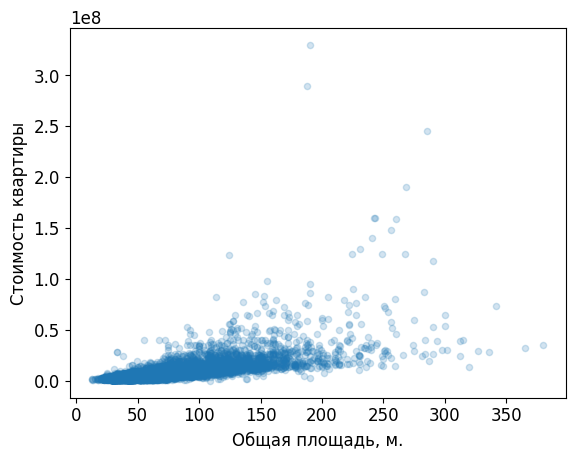

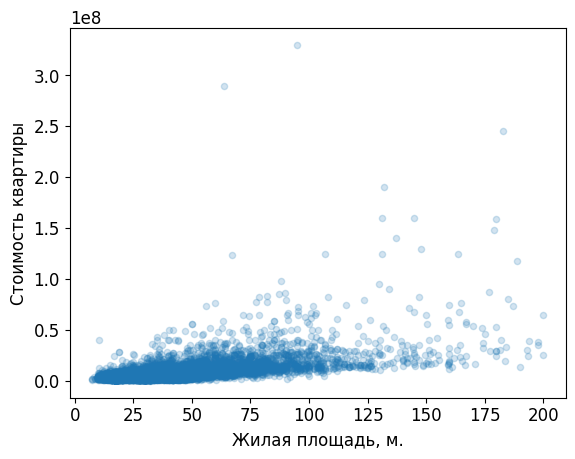

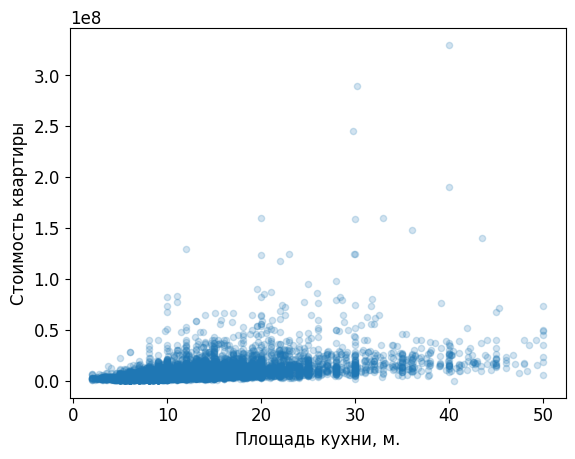

In [257]:
# тройка площадей
data.plot(x='total_area', y='last_price',
          xlabel='Общая площадь, м.', ylabel='Стоимость квартиры',
          kind='scatter', alpha=0.2)
data.plot(x='living_area', y='last_price',
          xlabel='Жилая площадь, м.', ylabel='Стоимость квартиры',
          kind='scatter', alpha=0.2)
data.plot(x='kitchen_area', y='last_price',
          xlabel='Площадь кухни, м.', ylabel='Стоимость квартиры',
          kind='scatter', alpha=0.2);

Корелляции с:

1. Общая площадь - чёткая общая положительная.
2. Жилая площадь - чёткая общая положительная.
3. Площадь кухни - чёткая общая положительная. Интересные верт. линии.

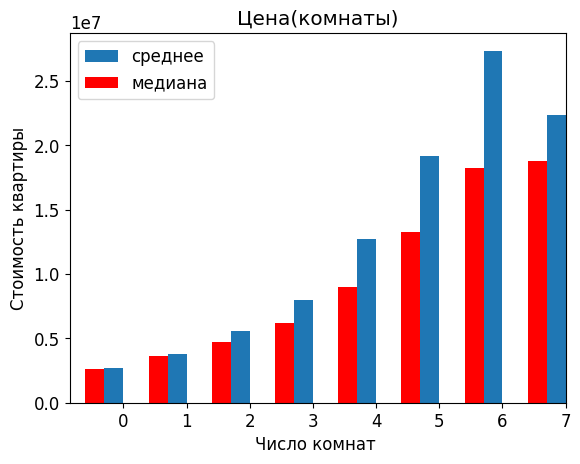

In [258]:
# Середнячок
ax= data.pivot_table(index='rooms', values='last_price', aggfunc='mean') \
    .plot(kind='bar', y='last_price',
          label='среднее', position=1, width=0.3)
data.pivot_table(index='rooms', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры',
          xlabel='Число комнат ',
          ax=ax, label='медиана', position=2, width=0.3, color='red',
          title='Цена(комнаты)', kind='bar', rot=0);

In [259]:
# Частные корреляции: <= 6, >= 6
display(corr_former(data.query('rooms <= 6'), 'last_price', ['rooms'], method_corr='spearman'))
display(corr_former(data.query('rooms >= 6'), 'last_price', ['rooms'], method_corr='spearman'))

,sp,last_price,|,-/+,Связь
rooms,|,0.53,|,положит.,средняя


,sp,last_price,|,-/+,Связь
rooms,|,0.06,|,положит.,оч.слабая


4. Количество комнат:
    - общая: положительная средняя;
    - частная: с 6 комнат начинается отрицитальная очень слабая.

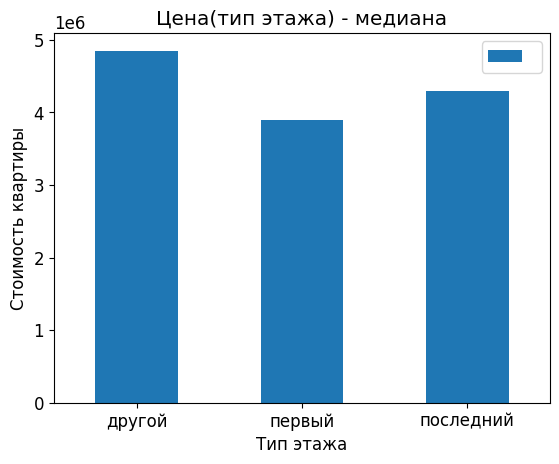

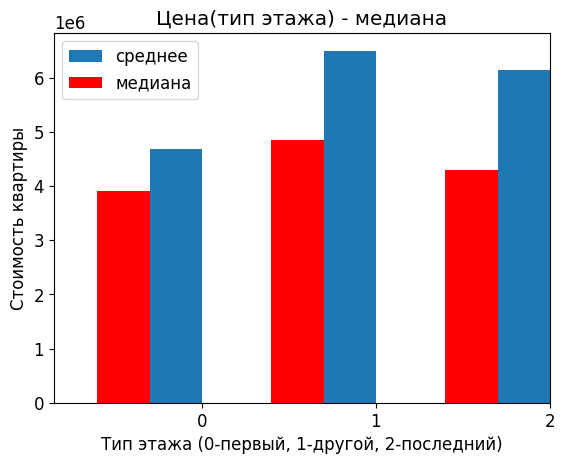

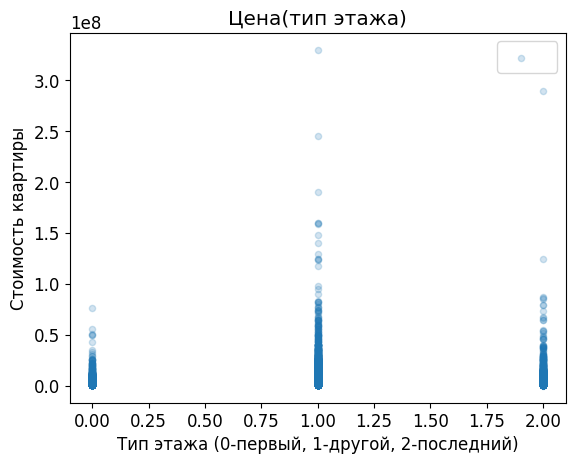

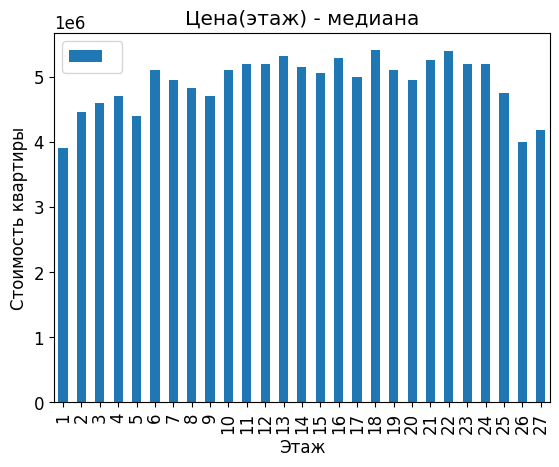

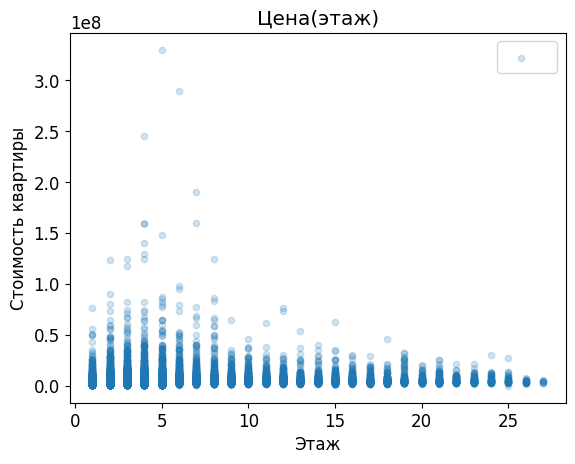

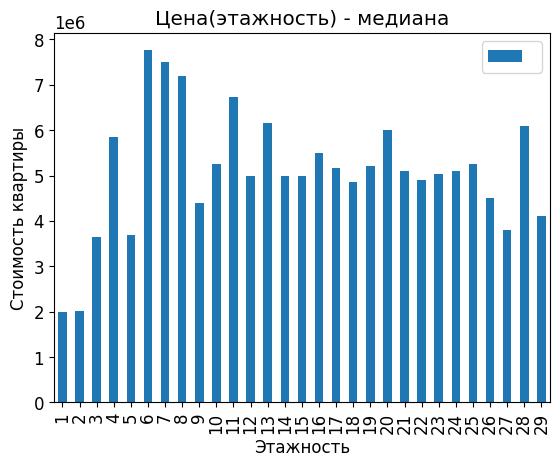

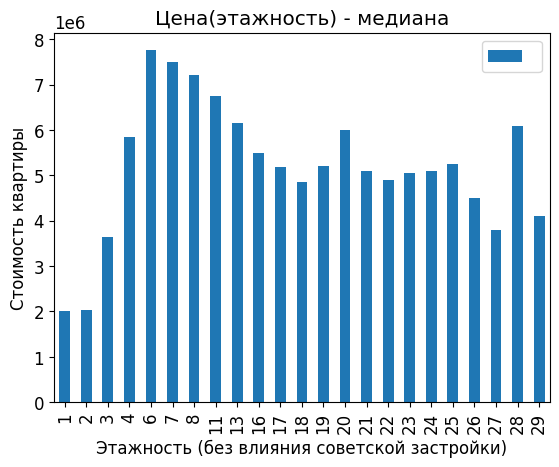

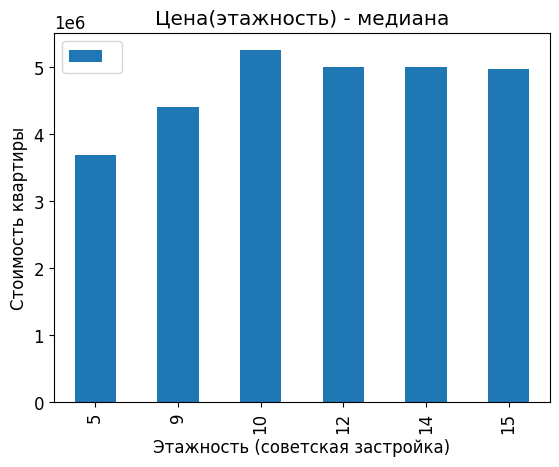

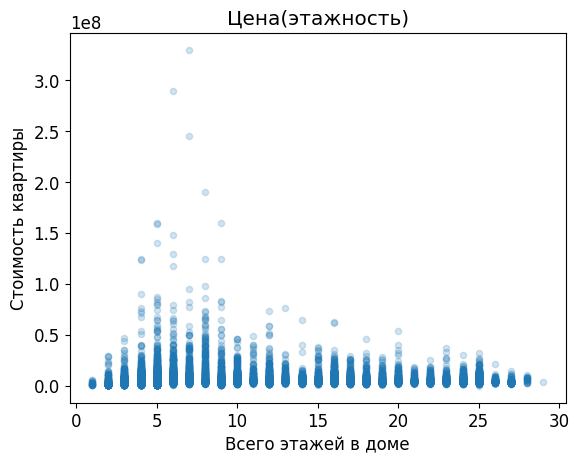

In [260]:
# Аутсайдер тип этажа
data.pivot_table(index='floor_category', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры', label='',
          xlabel='Тип этажа',
          title='Цена(тип этажа) - медиана', kind='bar', rot=0)

ax = data.pivot_table(index='floor_category_id', values='last_price', aggfunc='mean') \
    .plot(kind='bar', y='last_price', label='среднее', width=0.3, position=1)
data.pivot_table(index='floor_category_id', values='last_price', aggfunc='median') \
    .plot(kind='bar', y='last_price', ylabel='Стоимость квартиры',
          xlabel='Тип этажа (0-первый, 1-другой, 2-последний)',
          ax=ax, color='red', width=0.3, position=2, label='медиана',
          title='Цена(тип этажа) - медиана', rot=0) 

data.plot(y='last_price', ylabel='Стоимость квартиры', label='',
          title='Цена(тип этажа)',
          x='floor_category_id', xlabel='Тип этажа (0-первый, 1-другой, 2-последний)',
          kind='scatter', alpha=0.2);

data.pivot_table(index='floor', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры', label='',
          xlabel='Этаж',
          title='Цена(этаж) - медиана', kind='bar', rot=90) 
data.plot(y='last_price', ylabel='Стоимость квартиры', label='',
          title='Цена(этаж)',
          x='floor', xlabel='Этаж',
          kind='scatter', alpha=0.2);

data.pivot_table(index='floors_total', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры', label='',
          xlabel='Этажность',
          title='Цена(этажность) - медиана', kind='bar', rot=90)

data_f = data.query('floors_total not in [5, 9, 10, 12, 14, 15]')
data_f.pivot_table(index='floors_total', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры', label='',
          xlabel='Этажность (без влияния советской застройки)',
          title='Цена(этажность) - медиана', kind='bar', rot=90)

data_f = data.query('floors_total in [5, 9, 10, 12, 14, 15]')
data_f.pivot_table(index='floors_total', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры', label='',
          xlabel='Этажность (советская застройка)',
          title='Цена(этажность) - медиана', kind='bar', rot=90)

data.plot(y='last_price', ylabel='Стоимость квартиры',
          title='Цена(этажность)',
          x='floors_total', xlabel='Всего этажей в доме',
          kind='scatter', alpha=0.2);

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Как в песне, "первый и последний этаж не предлагать". Традиционно, квартиры на первом и последнем этажах считаются самыми неудобными для жизни и это отражается на их стоимости.
</div>

In [261]:
# Цифры для этажности по частям: первый-другой, другой-последний
display(corr_former(data.query('floor_category_id < 2'),
                    'last_price', ['floor_category_id'], method_corr='spearman'))
display(corr_former(data.query('floor_category_id > 0'),
                    'last_price', ['floor_category_id'], method_corr='spearman'))

,sp,last_price,|,-/+,Связь
floor_category_id,|,0.17,|,положит.,оч.слабая


,sp,last_price,|,-/+,Связь
floor_category_id,|,-0.09,|,отрицат.,оч.слабая


In [262]:
# А какие цифры для всех этажей
display(corr_former(data, 'last_price', ['floor'], method_corr='spearman'))
display(corr_former(data, 'last_price', ['floor'], method_corr='kendall'))

,sp,last_price,|,-/+,Связь
floor,|,0.16,|,положит.,оч.слабая


,ke,last_price,|,-/+,Связь
floor,|,0.11,|,положит.,оч.слабая


In [263]:
# цифры для этажей, например, до 6, от 6 до 22, от 22
display(corr_former(data.query('floor <= 6'), 'last_price', ['floor'], method_corr='spearman'))
display(corr_former(data.query('(floor >= 6) & (floor <= 22)'),
                    'last_price', ['floor'], method_corr='spearman'))
display(corr_former(data.query('(floor >= 22)'),
                    'last_price', ['floor'], method_corr='spearman'))

,sp,last_price,|,-/+,Связь
floor,|,0.12,|,положит.,оч.слабая


,sp,last_price,|,-/+,Связь
floor,|,0.02,|,положит.,оч.слабая


,sp,last_price,|,-/+,Связь
floor,|,-0.13,|,отрицат.,оч.слабая


In [264]:
# Для этажности
display(corr_former(data, 'last_price', ['floors_total'], method_corr='spearman'))
display(corr_former(data, 'last_price', ['floors_total'], method_corr='kendall'))

,sp,last_price,|,-/+,Связь
floors_total,|,0.21,|,положит.,слабая


,ke,last_price,|,-/+,Связь
floors_total,|,0.15,|,положит.,оч.слабая


In [265]:
# А для этажности, например, до 6, от 6
display(corr_former(data.query('floors_total <= 6'),
                    'last_price', ['floors_total'], method_corr='spearman'))
display(corr_former(data.query('floors_total >= 6'),
                    'last_price', ['floors_total'], method_corr='spearman'))

,sp,last_price,|,-/+,Связь
floors_total,|,0.15,|,положит.,оч.слабая


,sp,last_price,|,-/+,Связь
floors_total,|,-0.01,|,отрицат.,оч.слабая


Корреляция стоимости квартиры с:

5. Тип этажа - нелинейная (для правильного ранжирования создан floor_category_id):
    - "первый" и "другой " - положительная очень слабая;
    - "другой" и "последний" - отрицательная очень слабая.
6. По этажам и этажности "картинка" сложная (особенно в этажности). Нелинейная. Много вложенных частных корреляций. Влияют аномалии: изношенный жилищный фонд советского времени (5,9 и, возможно, 10,12,14,15), элитные многоэтажки (20,28).  

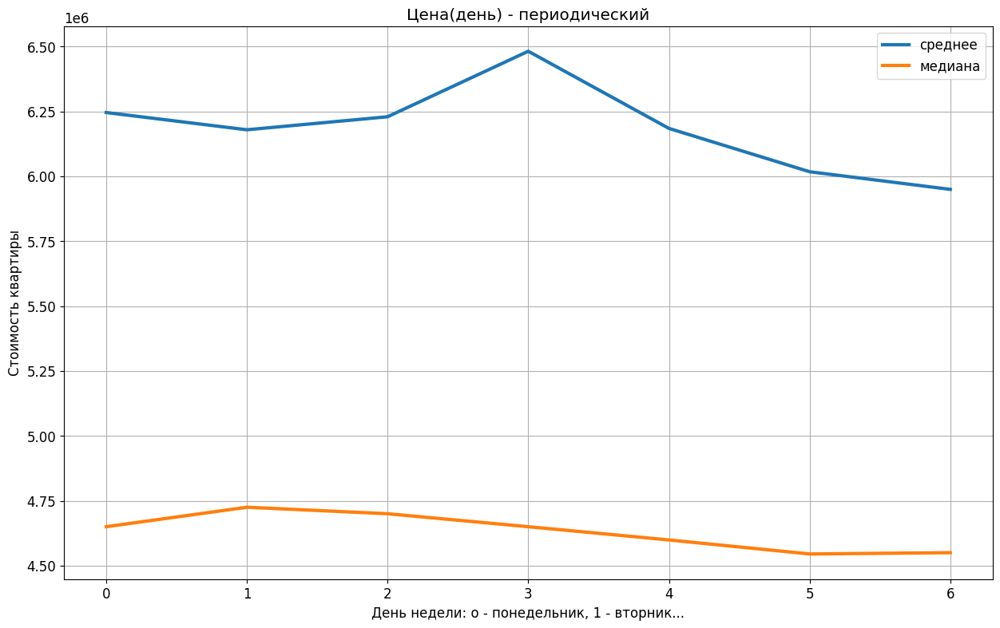

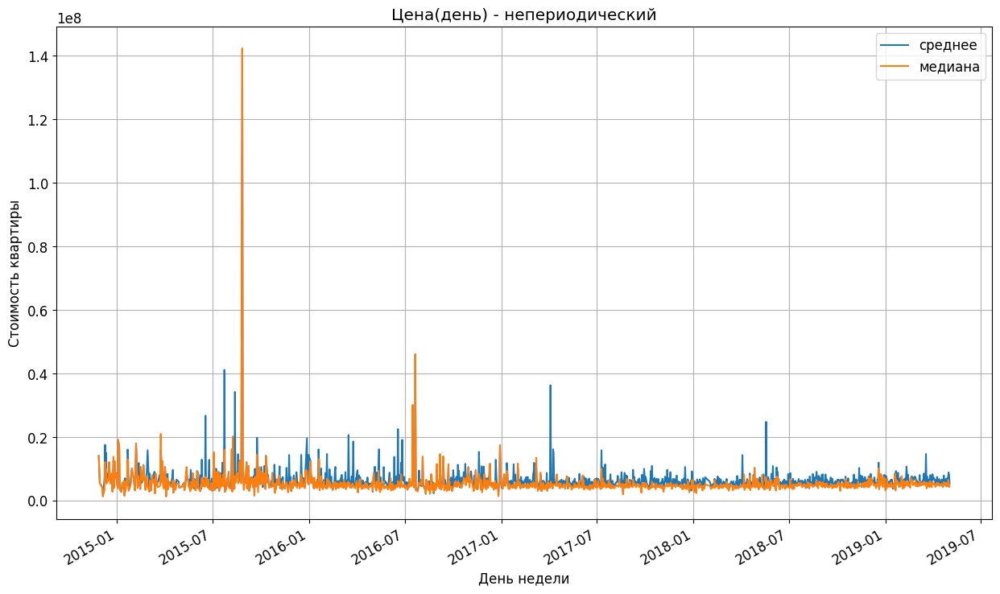

In [266]:
# Полные аутсайдеры
# День
ax = data.pivot_table(index='dayOfWeek', values='last_price', aggfunc='mean') \
    .plot(y='last_price', ylabel='Стоимость квартиры',
          linewidth = 3,
          label='среднее')

data.pivot_table(index='dayOfWeek', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры',
          xlabel='День недели: о - понедельник, 1 - вторник...',
          kind='line',
          ax=ax, label='медиана', linewidth = 3,
          title='Цена(день) - периодический',
          grid=True, figsize=(15,9)
         );
ax = data.pivot_table(index='dayOfWeek2', values='last_price', aggfunc='mean') \
    .plot(y='last_price', ylabel='Стоимость квартиры', label='среднее')

data.pivot_table(index='dayOfWeek2', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры',
          xlabel='День недели',
          kind='line',
          ax=ax, label='медиана',
          title='Цена(день) - непериодический',
          grid=True, figsize=(15,9)
         );

In [267]:
# Дневные рекорды
data.pivot_table(index='dayOfWeek2', values='last_price', aggfunc='median') \
    .sort_values(by='last_price', ascending=False).head()

,last_price
dayOfWeek2,
2015-08-27,142167000.0
2016-07-21,46000000.0
2016-07-16,30000000.0
2015-03-25,20900000.0
2015-08-09,20050000.0


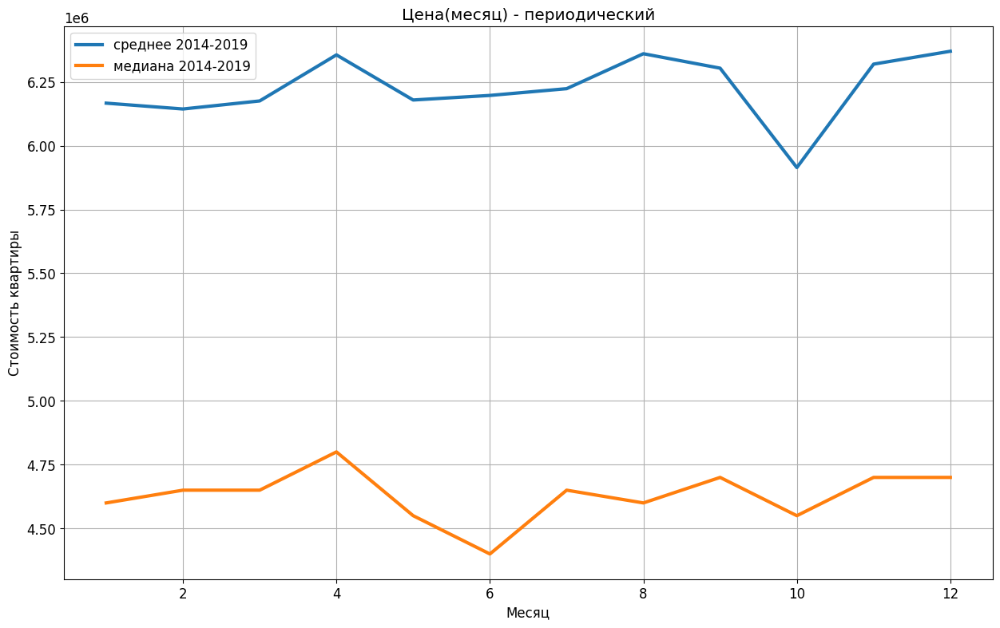

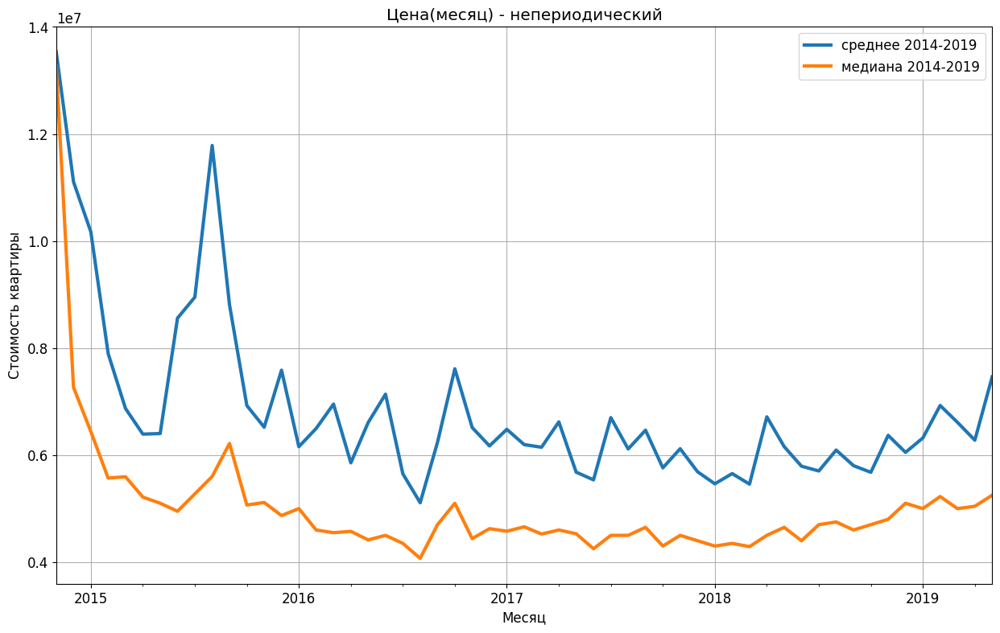

In [268]:
# Месяц
ax = data.pivot_table(index='month', values='last_price', aggfunc='mean') \
    .plot(y='last_price',
          kind='line',
          label='среднее 2014-2019', linewidth = 3,

)
data.pivot_table(index='month', values='last_price', aggfunc='median') \
    .plot(y='last_price',
          ylabel='Стоимость квартиры', xlabel='Месяц',
          kind='line',
          label='медиана 2014-2019', linewidth = 3,
          title='Цена(месяц) - периодический',
          ax=ax, grid=True, figsize=(15,9)
);
ax = data.pivot_table(index='month2', values='last_price', aggfunc='mean') \
    .plot(y='last_price',
          kind='line',
          label='среднее 2014-2019', linewidth = 3,

)
data.pivot_table(index='month2', values='last_price', aggfunc='median') \
    .plot(y='last_price',
          ylabel='Стоимость квартиры', xlabel='Месяц',
          kind='line',
          label='медиана 2014-2019', linewidth = 3,
          title='Цена(месяц) - непериодический',
          ax=ax, grid=True, figsize=(15,9)
);

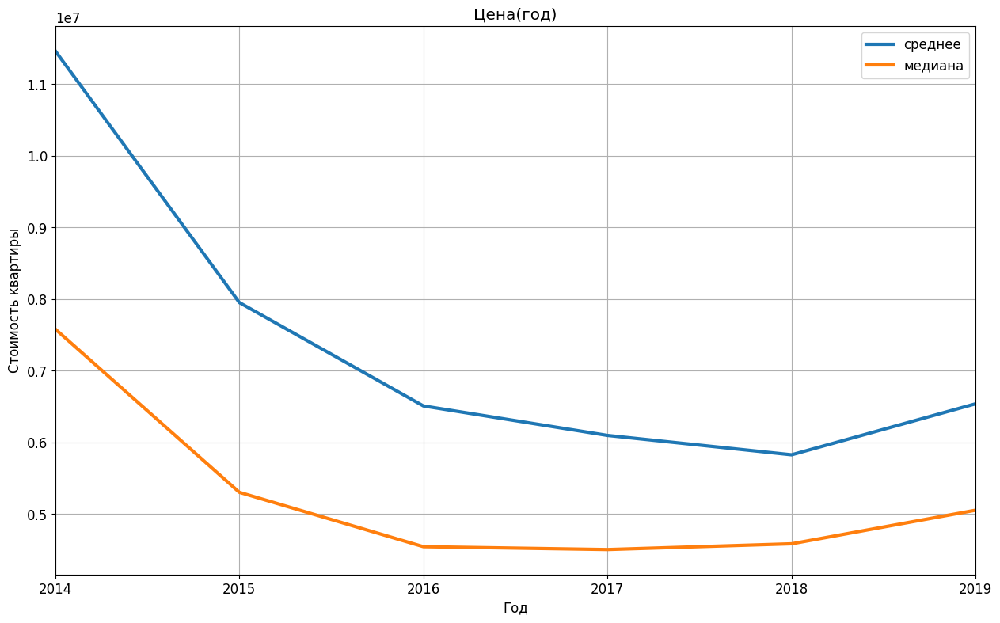

In [269]:
# Год
ax = data.pivot_table(index='year2', values='last_price', aggfunc='mean') \
    .plot(y='last_price', linewidth = 3, label='среднее')

data.pivot_table(index='year2', values='last_price', aggfunc='median') \
    .plot(y='last_price', ylabel='Стоимость квартиры',
          xlabel='Год',
          kind='line',
          ax=ax, label='медиана', linewidth = 3,
          title='Цена(год)',
          grid=True, figsize=(15,9)
);

Корреляция стоимости квартиры с:

7. День:
    - периодический:
        - нулевая. Активность от понеделька ко вторнику (для среднего значения - к четвергу) растёт, к выходным падает.
    - непериодический:
        - нулевая. Несколько сильных всплесков (самый сильный: четверг 2015-08-27 средняя стоимость 142167000.0).
8. Месяц:
    - периодический:
        - нулевая. Разнонаправленные непонятные колебания. Фактор "обвала" курса рубля всё "забивает".
    - непериодический:
        - общая: отрицательная очень слабая, фактически нелинейная;
        - частные по годам: отрицательная слабая в ноябре-декабре 2014, отрицательная очень слабая с января по июнь в 2015, положительная очень слабая с июня по сентрябрь и отрицательная очень слабые до января. Попеременные затухающие в сумме дают положительную очень слабую в последующие годы.
9. Год:
    - общая: суммарно отрицательная очень слабая, фактически нелинейная;
    - частные: падение (отрицательная очень слабая) до 2016, плато (нулевая) 2016-2018, рост (положительная очень слаба) с 2018.

<div class="alert alert-block alert-danger">✍
    

__Комментарий от ревьюера №2__

Оставлю общий комментарий по корреляции Пирсона. Смотри, её есть смысл рассматривать только на непрерывных данных (которые нельзя сгруппировать). В данном случае это площади. Остальные данные (тип этажа, день, месяц, год) - нельзя. Поэтому давай оставим корреляцию Пирсона только для площадей
    
</div>

<div class="alert alert-info"> <b>Комментарии студента:</b>
    Убрал метод Пирсона - 'pe' для порядковых (ранговых) переменных в самом начале п.4.3. Далее для сравнения непрерывных и порядковых переменных применены метод Спирмена - 'sp' и Кендалла - "ke".
</div>

#### Расчёт средней цены одного квадратного метра квартир в 10 самых крупных по количеству объявлений н.п.

In [270]:
top10 = data.groupby('locality_name') \
            .agg({'locality_name': 'count', 'price_per_sqm':'mean'}) \
            .rename(columns={'locality_name': 'Число объявлений', 'price_per_sqm': 'Средняя стоимость кв.м.'}) \
            .reset_index().rename(columns={'locality_name': 'Название н.п.'}) \
            .sort_values(by='Число объявлений', ascending = False) \
            .head(10)

top10['Средняя стоимость кв.м.'] = top10['Средняя стоимость кв.м.'].astype(int)
top10 = top10.reset_index(drop=True)
top10.index += 1
top10

,Название н.п.,Число объявлений,Средняя стоимость кв.м.
1,санкт-петербург,15488,113722
2,поселок мурино,532,85125
3,поселок шушары,436,78405
4,всеволожск,392,68618
5,пушкин,365,102900
6,колпино,337,75333
7,поселок парголово,325,90243
8,гатчина,307,68746
9,деревня кудрово,293,92412
10,выборг,237,58141


Вывод:

1) Наибольшая средняя стоимость квадратного метра в Санкт-Петербурге. Немного уступает Пушкин - историческая жемчужина вблизи от СПб.
2) Затем идут районы, равноудалённые от центра СПб и фактически входящие в него: деревня Кудрово, посёлки Парголово, Мурино и Шушары (чуть дальше).
3) Далее в списке Колпино (промышленно развитый центр) и Гатчина (научно-исторический центр). Они расположены на большем удалении от СПб.
4) Почти в самом низу топ-10 и недалеко от СПб расположен Всеволжск. Развитый промышленный город.
5) В самом низу топ-10 и очень далеко от СПб расположен Выборг. Город с большим и развитым судостроительным заводом.

<div class="alert alert-block alert-warning">📝
    

__Комментарий от ревьюера №1__

Смотри, как можно в 1 строку:
</div>

In [271]:
data.groupby('locality_name').agg({'balcony':'count', 'last_price':'median'}) \
    .sort_values(by = 'balcony', ascending = False) \
    .head(10)

,balcony,last_price
locality_name,,
санкт-петербург,15488,5500000.0
поселок мурино,532,3412500.0
поселок шушары,436,3970000.0
всеволожск,392,3500000.0
пушкин,365,5150000.0
колпино,337,3600000.0
поселок парголово,325,4130000.0
гатчина,307,3100000.0
деревня кудрово,293,3800000.0


<div class="alert alert-info"> <b>Комментарии студента:</b> Сделал, но строк больше.</div>

#### Расчёт и описание средней цены квартиры ны каждом километре от центра СПб

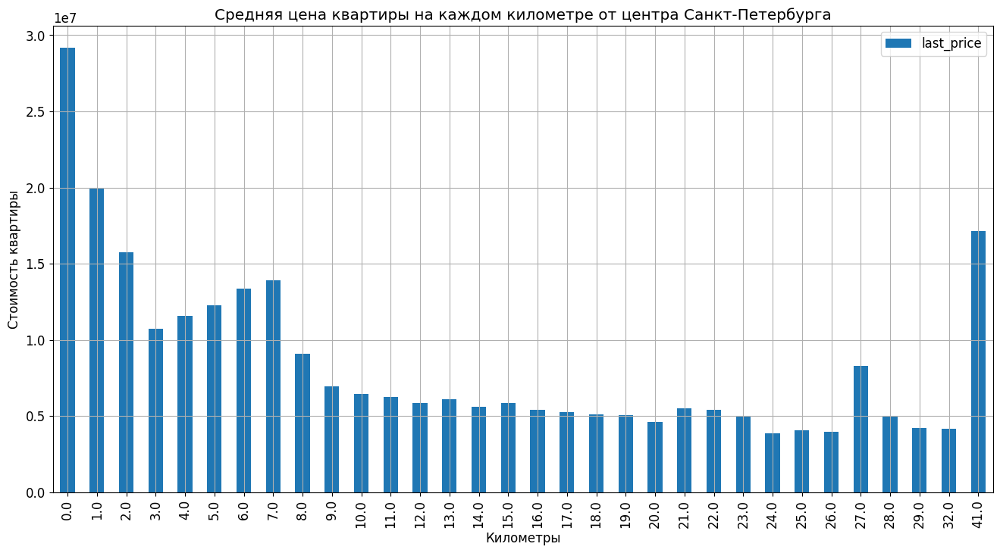

In [272]:
# Строим столбчатую диаграмму
data[data['locality_name'] == SPb] \
    .pivot_table(index='cityCenters_nearest_km', values='last_price', aggfunc='mean') \
    .plot(kind='bar',
          title='Средняя цена квартиры на каждом километре от центра Санкт-Петербурга',
          xlabel = 'Километры',
          ylabel = 'Стоимость квартиры',
          figsize=(16, 8),
          grid=True
         );

In [273]:
# поиск недвижимости на 27 километре
data[(data['locality_name'] == SPb) &
    (data['last_price'] > 0.75e+7) & (data['cityCenters_nearest_km'] == 27)] \
    .sort_values(by='last_price', ascending=False).head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_per_sqm,dayOfWeek,month,year,dayOfWeek2,month2,year2,floor_category,floor_category_id,cityCenters_nearest_km,last_day_exposition
748,13,14350000,74.0,2017-11-28,2,3.13,5,30.0,3,False,False,False,25.0,0,санкт-петербург,23888.0,27313.0,1.0,1496.0,0.0,NaN,128.0,193919,1,11,2017,2017-11-28,2017-11-01,2017-01-01,другой,1,27.0,2018-04-05


In [274]:
# удалим для ясности выброс на 27 километре
data.drop(index=748, inplace=True)

In [275]:
# поиск недвижимости на 41 километре
data[(data['locality_name'] == SPb) &
    (data['last_price'] > 1.5e+7) & (data['cityCenters_nearest_km'] == 41)] \
    .sort_values(by='last_price', ascending=False).head(5)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_per_sqm,dayOfWeek,month,year,dayOfWeek2,month2,year2,floor_category,floor_category_id,cityCenters_nearest_km,last_day_exposition
21276,0,17122148,178.3,2017-02-10,1,2.6,3,95.1,1,False,False,False,41.6,1,санкт-петербург,60195.0,41294.0,0.0,NaN,0.0,NaN,4.0,96030,4,2,2017,2017-02-10,2017-02-01,2017-01-01,первый,0,41.0,2017-02-14


In [276]:
# удалим для ясности выборос на 41 километре
data.drop(index=21276, inplace=True)

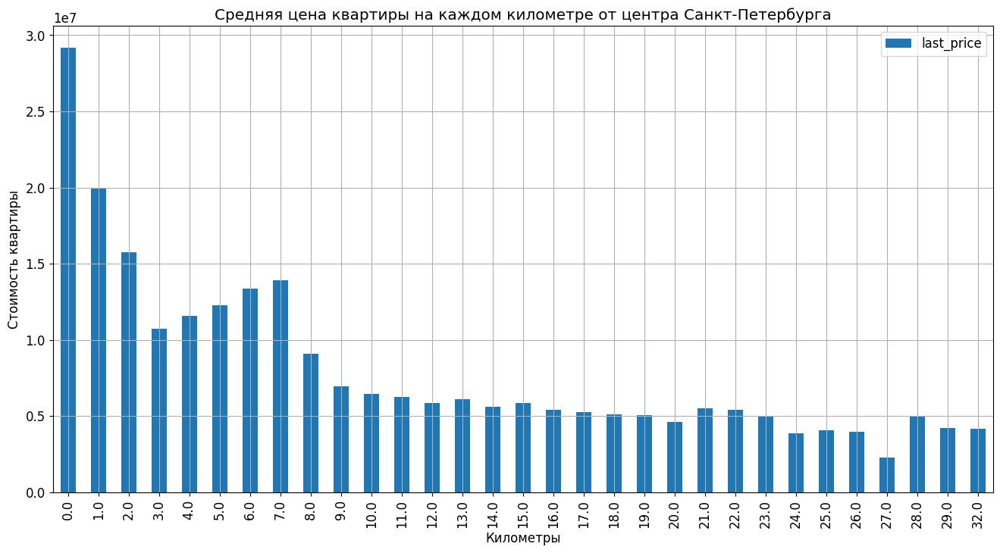

In [277]:
# Строим столбики повторно
data[data['locality_name'] == SPb] \
    .pivot_table(index='cityCenters_nearest_km', values='last_price', aggfunc='mean') \
    .plot(kind='bar',
          title='Средняя цена квартиры на каждом километре от центра Санкт-Петербурга',
          xlabel = 'Километры',
          ylabel = 'Стоимость квартиры',
          figsize=(16, 8),
          grid=True
         );

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Отличный и наглядный график 👍
    
Здорово, когда он подписан. Так быстрее понять о чем идёт речь на нём.
    
</div>

Наблюдения:

Привязки к площади квартиры нет. Т.е. "дворец" и "конура" в одной категории.

1) В самом центре - самая дорогая недвижимость. "Дворцы".
2) Затем до 3 км включительно - резкое снижение. "Придворные". Падение площади квартир.
3) С 3 до 7 километров включительно - подъём стоимости. Скорее всего из-за увеличения площади квартир.
4) С 7 до 26 километров волнообразное падение. Влияют "элитные" квартиры.
5) 27 километр - значительный всплеск. Какая-то дорогая, крупная недвижимость. Выброс. Удалил.
6) 41 километр - дорогая, крупная недвижимость на "отшибе". Выброс. Удалил.

### Общий вывод

Во время работы установлена недостаточность и искажённость данных из-за не ввода данных, опечаток, приписок, сбоев и т.п.


Пропуски данных и их причины:

1. Название н.п. (locality_name) - сбой по 49 записям. Восстановил функцией анализа расстояния до центра и аэропорта. Функция протестирована на данных без пропусков; точность: -9%/+1%. Остатки "заполировал" ручным изменением по найденным аналогам.
2. Апартаменты (is_apartment) - незаполнение данных пользователем (и так лень заполнять, а тут ещё непонятный термин какой-то). Заполнил пропуски False.
3. Балкон (balcony) - отсутствие описываемого объекта, незаполнение данных пользователем. Заполнил пропуски нулями.
4. Высота потолков (ceiling_height) - незаполнение данных пользователем. Заполнил по медианным значениям каждого н.п. Остатки вручную.
5. Этаж (floor) - незаполнение данных или сбой. Заполнил по расчётным данным.
6. Расстояние до ближайшего аэропорта, центра (airports_nearest, cityCenters_nearest) - незаполнение данных пользователем. 24 значения airports_nearest восстановить не удалось.
7. Парки и пруды в радиусе 3000 метров (parks_around3000, ponds_around3000) - незаполнение данных пользователем. Оставил без изменений.
8. Ближайшие парки, пруды (parks_nearest, ponds_nearest) - отсутствие описываемого объекта, незаполнение данных пользователем (ярко выраженная комплексная причина). Оставил без изменений.
9. Дней размещения объявления (days_exposition) - незаполнение данных принудительно при выгрузке данных. Рассчитал даты. Заполнил.
10. Жилая площадь и площадь кухни (living_area, kitchen_area) - незаполнение данных пользователем. Составлены функции для определения правильных значений. Заполнил по расчётным значениям. Остатки вручную по аналогам.
11. Всего этажей (floors_total) - незаполнение данных или сбой. Заполнил по расчётным значениям. Остатки вручную по аналогам.



Возможные аномалии и ошибки:
1. total_images-- аномалии и ошибки не найдены.
2. last_price---- найдена ошибка, аномалии не найдены, если не считать проявления капитализма аномалией.
    - квартира стоимостью 12190 - убрана.
    - квартира стоимостью > 700 млн. - квартира олигарха.
3. total_area---- аномалии и ошибки не найдены.
    - квартира площадью 12 кв.м. - студия или открытая планировка.
    - квартира 900 метров - квартира олигарха.
4. rooms--------- аномалии и ошибки не найдены.
    - нулевое значение - студии. 
    - 19 комнат - олигарх.
    - и самое интересное. В "однушках" ошибочно есть и бОльшие квартиры.
5. ceiling_height- найдены ошибки.
    - исправлены ошибки в высоте потолка: опечатки, польностью неправильные значения.
    - значения высот квартир с мансардами оставлены. 
6. floors_total--- ошибки.
    - 60-этажка в Кронштадте - ошибка исправлена. А 35-этажки в СПб - реальность.
7. living_area---- найдены ошибки.
    - исправлены отрицательные значения, опечатки, перепутанные с площадью кухни значения. 
    - площадь 511 метров - олигарх.
8. floor---------- аномалии и ошибки не найдены.
    - есть 33-й этаж в продаже, т.к. есть 35-этажка. 
9. kitchen_area--- аномалии и ошибки не найдены.
    - нулевое значение - студии и некоторые открытые планировки.
    - 115 метров - олигарх.
10. balcony------- аномалии и ошибки найдены.
    - странная ситуация с балконами. Увеличено значение более сотни балконов. Подправил как смог.
11. airports_nearest- найдена ошибка.
    - 0 метров до аэропорта. Убрана.
12. cityCenters_nearest- аномалии и ошибки не найдены.
13. parks_around3000---- аномалии и ошибки не найдены.
14. parks_nearest------- найдена ошибка.
    - 1 и 4 метра до парка подправлены на 10. 3 метра исправлено на 300.
15. ponds_around3000---- аномалии и ошибки не найдены.
16. ponds_nearest------- аномалии и ошибки не найдены.
    - 13 метров до пруда - возможно.
17. days_exposition----- аномалии и ошибки не найдены..
    - 0 дней - выставленные в день выгрузки данных.
    - более 3*365 дней - это объявления о продаже дорогих квартир.



Наблюдения по результатам анализа данных объектов недвижимости (квартир):
1. Общая площадь:
    - похоже на распределение Пуассона. Пики: 30, 45, 60, 80. Значение 110 с небольшим метров отделяет массовые квартиры от более дорогих и, соответственно, редких. Олигархические квартиры, которые можно мерять огородными сотками отсеяли ранее из-за ещё большей редкости и бесполезности в текущем исследовании.
2. Жилая площадь:
    - два пика - на 18 кв.м. и на 30 кв.м. И провал на 24 кв.м. Цель для отдельно исследования. Но скорее всего оказало влияние советское массовое строительство с установленными метражами 1- и 2-комнатных квартир.
3. Площадь кухни:
    - похоже на распределение Пуассона. Пики: на 6, 7 и 10 м.кв. Везде следы прошлой цивилизации.
4. Цена объекта:
    - также похоже на распределение Пуассона, при этом затянутое. Пик на 4,5 млн. Начиная с 3 млн. максимальные значения с шагом по 0,5 млн.Нужно учитывать, что данные собраны за 4,5 года, а денежная мера (рубль) каждый год "дешевеет" примерно на 10%. Для 2014 года условный рубль примерно соответствует в 2019 - 1*1,1*1,1*1,1*1,1*1,1 = 1,61 рубля. На постоянные выбросы влияет спекулятивная составляющая рынка продаж недвижимости, стройматериалов и т.д. 
5. Количество комнат:
    - "ноздря в ноздрю" идут 1- и 2-комнатные с небольшим преимуществом первых. На четверть меньше "трёшек", 4-комнатных в несколька раз меньше. Остальных ещё меньше. В принципе хоть и грубое, но распределине Пуассона.
6. Высота потолков:
    - распределение Пуассона. Три пика - 2.5, 2.6, 2.7 метра. Пики - в основном результат советского задела по "брежневкам", "хрущёвкам" и позднесоветским сериям.
7. Этаж квартиры:
    - с 1 по 5 этаж абсолютное большинство. Пятиэтажки рулят. Пик на 2 этаже. Потом всё по убыванию, но заметная девяточка (снова привет прошлому). 10- и 11-этажи идут парой.
8. Тип этажа квартиры («первый», «последний», «другой»):
    - значительное (в 6-7 раз) превышение "других" над "первыми" и "последними". Если в большинстве домов мегаполиса СПб больше трёх этажей, то это закономерность. "Последних" чуть больше, чем "первых". Правильно - надо быть ближе к земле и поменьше "крутить-вертеть" квартирами.
9. Общее количество этажей в доме:
    - 5-этажки, 9-этажки (от предыдущей цивилизации) - преобладают. Остальные дома равномерно распределены в диапазоне от 10 до 25 этажей, но есть приличный локальный подъём с 21- до 25-этажек. Новый тренд в "человейники".
10. Расстояние до центра города в метрах:
    - "пуассон" волнами. Пики на увеличение: 5, 12, 15 км.; на снижение: 22, 31, 34, 52 км. Какие-то факторы техногенного и природного характера влияют на застройку: заводы, промзоны, резиденции, заповедники, реки, водоёмы и т.п.
11. Расстояние до ближайшего аэропорта:
    - "пуассон" с большим числом всплексков. Скорее всего из-за факторов аналогичных "центру" и большого количества неточностей. Это не до центра города расстояние указывать. Проверять особо не будут.
12. Расстояние до ближайшего парка:
    - "пуассон". Пик на 450 метров. Это недалеко. Для тех у кого есть такая возможность, а таких немного (от общего количества). Любопытный локальный пик на 2,1 км.
13. День и месяц публикации объявления:
    - Дни: в будни (в понедельник чуть ниже) объявлений больше в два раза по сравнению с выходными (четверг, вторник - самые ударные).
    - Месяцы: низы - декабрь+январь, май. Летние месяцы - плато. С февраля по апрель и сентября по ноябрь - подъёмы. Влияющие факторы: конец года, январские и майские праздники, лето.
14. На всех графиках преобладают целые числа.



Выводы по результатам анализа быстроты продаж:

1. Среднее время продажи квартиры составляет 185 дней - полгода. Медиана - 95 дней. Квантиль Q1(25%) - 45 дней. Квантиль Q3(75%) - 231. Большое отличие медианы от среднего значения из-за квартир олигархов за сотни милионов, которые продавали годами.
2. Считаю быстрыми продажи до 45 дней, а необычно долгими - свыше 231 дня.
3. Выбросы похожи на результаты рыботы автоматизированной системы снятия объявлений. По числовому ряду дней продолжительности публикации объявлений: 7, 30, 45, 60, 90 можно понять, что это задаваемый параметр при публикации.
4. Интересны и другие аномалии.



Вывод по результатам изучения факторов влияющих на полную стоимость квартиры:

Коррелляция с:

1. Общая площадь - чёткая общая положительная.
2. Жилая площадь - чёткая общая положительная.
3. Площадь кухни - чёткая общая положительная. Интересные верт. линии.
4. Количество комнат:
    - общая: положительная средняя;
    - частная: с 6 комнат начинается отрицитальная очень слабая.
5. Тип этажа - нелинейная (для правильного ранжирования создан floor_category_id):
    - "первый" и "другой " - положительная очень слабая;
    - "другой" и "последний" - отрицательная очень слабая.
6. По этажам и этажности "картинка" сложная (особенно в этажности). Нелинейная. Много вложенных частных корреляций. Влияют аномалии: изношенный жилищный фонд советского времени (5,9 и, возможно, 10,12,14,15), элитные многоэтажки (20,28). 
7. День:
    - периодический:
        - нулевая. Активность от понеделька ко вторнику (для среднего значения - к четвергу) растёт, к выходным падает.
    - непериодический:
        - нулевая. Несколько сильных всплесков (самый сильный: четверг 2015-08-27 средняя стоимость 142167000.0).
8. Месяц:
    - периодический:
        - нулевая. Разнонаправленные непонятные колебания. Фактор "обвала" курса рубля всё "забивает".
    - непериодический:
        - общая: отрицательаня очень слабая, фактически нелинейная;
        - частные по годам: отрицательная слабая в ноябре-декабре 2014, отрицательная очень слабая с января по июнь в 2015, положительная очень слабая с июня по сентрябрь и отрицательная очень слабые до января. Попеременные затухающие в сумме дают положительную очень слабую в последующие годы.
9. Год:
    - общая: суммарно отрицательная очень слабая, фактически нелинейная;
    - частные: падение (отрицательная очень слабая) до 2016, плато (нулевая) 2016-2018, рост (положительная очень слаба) с 2018.


Выводы по результатам расчёт средней цены кв.м. жилой недвижимости в ТОП-10 по количеству объявлений:

1. Наибольшая средняя стоимость квадратного метра в Санкт-Петербурге. Немного уступает Пушкин - историческая жемчужина вблизи от СПб.
2. Затем идут районы, равноудалённые от центра СПб и фактически входящие в него: деревня Кудрово, посёлки Парголово, Мурино и Шушары (чуть дальше).
3. Далее в списке Колпино (промышленно развитый центр) и Гатчина (научно-исторический центр). Они расположены на большем удалении от СПб.
4. Почти в самом низу топ-10 и недалеко от СПб расположен Всеволжск. Развитый промышленный город.
5. В самом низу топ-10 и очень далеко от СПб расположен Выборг. Город с большим и развитым судостроительным заводом.



Выводы по результатам расчёта средней цены квартиры на каждом километре от центра Санкт-Петербурга:

1. В самом центре - самая дорогая недвижимость. "Дворцы".
2. Затем до 3 км включительно - резкое снижение. "Придворные". Падение площади квартир.
3. С 3 до 7 километров включительно - подъём стоимости. Скорее всего из-за увеличения площади квартир.
4. С 7 до 26 километров волнообразное падение. Влияют "элитные" квартиры.
5. 27 километр - значительный всплеск. Какая-то дорогая, крупная недвижимость. Выброс. Удалил.
6. 41 километр - дорогая, крупная недвижимость на "отшибе". Выброс. Удалил.

Прим.: Привязки к площади квартиры нет. Т.е. "дворец" и "конура" в одной категории - 1 шт.




== ПРИЛОЖЕНИЕ ==

Указанные выше выводы сделаны в результате следующих проделанных действий (кратко):

1) Импорт данных из 'https://code.s3.yandex.net/datasets/real_estate_data.csv'.
    - в качестве разделителя в csv файле применён знак табуляции ('\t').
 

2) Первичное изучение данных:
    - количество столбцов и строк: 23 и 23699;
    - типы данных: bool(2), float64(14), int64(3), object(3).


3) Предобработка данных:
    - общее количество пропусков: 101441;
    - заполнено и удалено пропусков: 44375; 
    - обработано аномальных значений: тьма;
    - обработано дубликатов: 41.


4) Изменение типов данных для удобной работы и эффективного использования памяти:
    - total_image ---------- int8 (было int64);
    - last_price ----------- int64 (float64);
    - first_day_exposition - datetime (object);
    - rooms ---------------- int8 (int64);
    - floors_total --------- int8 (float64);
    - floor ---------------- int8 (int64);
    - balcony -------------- int8 (float64);
    - days_exposition ------ int16 (float64).


5) Добавлено типов данных:
    - price_per_sqm -------- int64;
    - dayOfWeek------------- int8;
    - month----------------- int8;
    - year------------------ int16;
    - floor_category-------- object;
    - floor_category_id----- int8;
    - cityCenters_nearest_km- int16;
    - last_day_exposition--- datetime.


6) Категоризация данных:
    - для общего количества этажей в доме (floor-->floor_category, floor_category_id).


7) Проверка гипотез:
    - их было очень много.
    

8) Итоговая структура данных:
    - количество столбцов и строк: 30 и 23342;
    - типы данных: bool(3), datetime64[ns](2), float64(11), int16(2), int64(2), int8(8), object(2).
    
    
    
8) Общий вывод.
9) На выполнение работы затрачено полных 12 дней без перерыров.
    - дополнительно 2 дня на исправление замечаний после ревью №1;
    - дополнительно 0.5 дня на исправление замечаний после ревью №2.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Шикарный вывод и рекомендации для бизнеса. Кстати, хорошей практикой является написание в общем выводе всех твоих действий (кратко) по проекту. Ведь вывод раскрывает для заказчика всю твою проделанную работу и за что он платит деньги, даже если ему не интересен весь процесс исследования, то в отчёт он заглянет обязательно. Ты молодец!
</div>

<div class="alert alert-block alert-warning">📝
Комментарий от ревьюера №1 </b> 



У тебя получилась очень сильная и хорошая работа. Здорово, что расчеты ты сопровождаешь иллюстрациями, а так же не забываешь про комментарии, твой проект интересно проверять. Но не стоит пользоваться сторонними источниками, это плохая практика

---

Нужно поправить:

1) Шаг 4.3 выполнить самостоятельно

2) Подправить выводы, после изменений

----


Если у тебя будут какие-то вопросы по моим комментариям - обязательно пиши! Буду ждать работу на повторное ревью :)</div>

<div class="alert alert-block alert-warning">📝
Комментарий от ревьюера №2 </b> 



Отличная работа, осталось поправить один момент:

---

Нужно поправить:

1) Оставить корреляцию Пирсона только для площадей

----


Если у тебя будут какие-то вопросы по моим комментариям - обязательно пиши! Буду ждать работу на повторное ревью :)</div>

<div class="alert alert-info"> <b>Комментарии студента:</b>
    Подправил с уточнением.
</div>

**Чек-лист готовности проекта**

Поставьте 'x' в выполненных пунктах. Далее нажмите Shift+Enter.

- [x]  открыт файл
- [x]  файлы изучены (выведены первые строки, метод `info()`, гистограммы и т.д.)
- [x]  определены пропущенные значения
- [x]  заполнены пропущенные значения там, где это возможно
- [x]  есть пояснение, какие пропущенные значения обнаружены
- [x]  изменены типы данных
- [x]  есть пояснение, в каких столбцах изменены типы и почему
- [x]  устранены неявные дубликаты в названиях населённых пунктов
- [x]  устранены редкие и выбивающиеся значения (аномалии) во всех столбцах
- [x]  посчитано и добавлено в таблицу: цена одного квадратного метра
- [x]  посчитано и добавлено в таблицу: день публикации объявления (0 - понедельник, 1 - вторник и т.д.)
- [x]  посчитано и добавлено в таблицу: месяц публикации объявления
- [x]  посчитано и добавлено в таблицу: год публикации объявления
- [x]  посчитано и добавлено в таблицу: тип этажа квартиры (значения — «первый», «последний», «другой»)
- [x]  посчитано и добавлено в таблицу: расстояние в км до центра города
- [x]  изучены и описаны следующие параметры:
        - общая площадь;
        - жилая площадь;
        - площадь кухни;
        - цена объекта;
        - количество комнат;
        - высота потолков;
        - этаж квартиры;
        - тип этажа квартиры («первый», «последний», «другой»);
        - общее количество этажей в доме;
        - расстояние до центра города в метрах;
        - расстояние до ближайшего аэропорта;
        - расстояние до ближайшего парка;
        - день и месяц публикации объявления
- [x]  построены гистограммы для каждого параметра
- [x]  выполнено задание: "Изучите, как быстро продавались квартиры (столбец days_exposition). Этот параметр показывает, сколько дней «висело» каждое объявление.
    - Постройте гистограмму.
    - Посчитайте среднее и медиану.
    - В ячейке типа markdown опишите, сколько обычно занимает продажа. Какие продажи можно считать быстрыми, а какие — необычно долгими?"
- [x]  выполнено задание: "Какие факторы больше всего влияют на общую (полную) стоимость объекта? Постройте графики, которые покажут зависимость цены от указанных ниже параметров. Для подготовки данных перед визуализацией вы можете использовать сводные таблицы."
        - общей площади;
        - жилой площади;
        - площади кухни;
        - количество комнат;
        - типа этажа, на котором расположена квартира (первый, последний, другой);
        - даты размещения (день недели, месяц, год);
- [x]  выполнено задание: "Посчитайте среднюю цену одного квадратного метра в 10 населённых пунктах с наибольшим числом объявлений. Выделите населённые пункты с самой высокой и низкой стоимостью квадратного метра. Эти данные можно найти по имени в столбце `locality_name`."
- [x]  выполнено задание: "Ранее вы посчитали расстояние до центра в километрах. Теперь выделите квартиры в Санкт-Петербурге с помощью столбца `locality_name` и вычислите среднюю цену каждого километра. Опишите, как стоимость объектов зависит от расстояния до центра города."
- [x]  в каждом этапе есть промежуточные выводы
- [x]  есть общий вывод